### Background:

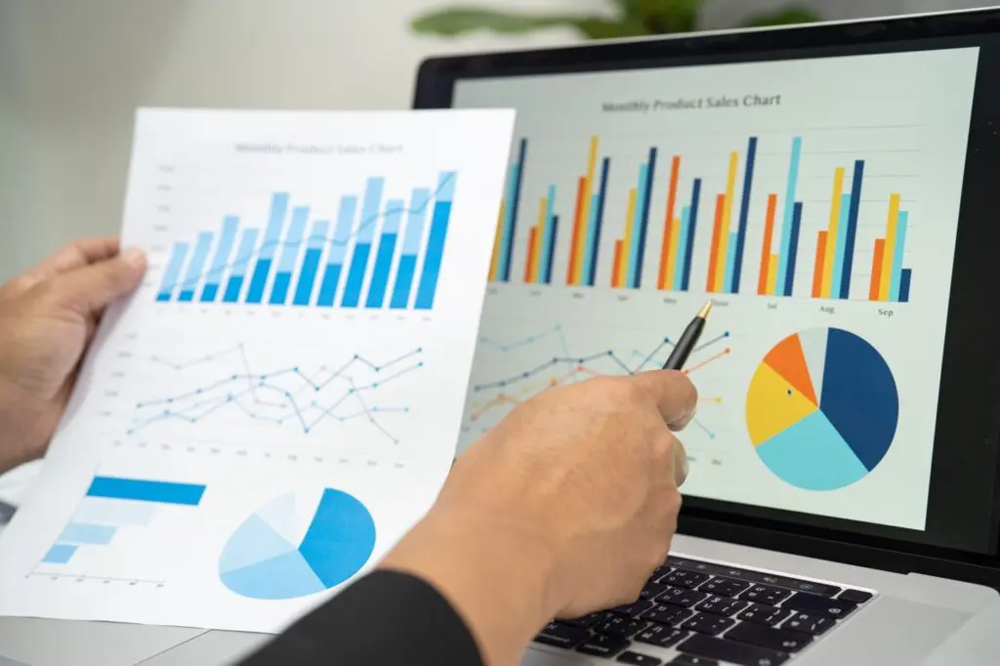

The goal of this Project is to try and gain some insights on a random dataset. This dataset contains sales data for a pharmaceutical company. The goal is to see if we can identify and trends in the sales of each product based on seasonality and time. Since this dataset contains sales data over a period of time, it only makes sense to use time-series forecasting techniques. In this project, we will use these techniques along with data transformations and basic machine learning algorithms to evaluate the performance. Although we will try multiple machine learning algorithms, I may cut down the number we show here to 2 for conciseness.

Sources: https://www.google.com/url?sa=i&url=https%3A%2F%2Fmyhfa.org%2F3-steps-to-effectively-analyze-sales-data%2F&psig=AOvVaw3br4Si2loqRX1Z7Kjh29uA&ust=1743513512972000&source=images&cd=vfe&opi=89978449&ved=0CBQQjRxqFwoTCOCQ8ZC0tIwDFQAAAAAdAAAAABAE

In [1]:
!pip install -r requirements.txt

Defaulting to user installation because normal site-packages is not writeable


In [3]:
# Lets read in our csv files
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read the csv file into a pandas dataframe
df_salesdaily = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Portfolio-Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesdaily.csv")
df_saleshourly = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Portfolio-Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\saleshourly.csv")
df_salesmonthly = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Portfolio-Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesmonthly.csv")
df_salesweekly = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Portfolio-Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesweekly.csv")

#Lets take it one at a time. Let's look at monthly sales data first since we can better identify trends.
df_salesmonthly['datum'] = pd.to_datetime(df_salesmonthly['datum'])
print(df_salesmonthly.dtypes)
print(df_salesmonthly.head())

datum    datetime64[ns]
M01AB           float64
M01AE           float64
N02BA           float64
N02BE           float64
N05B            float64
N05C            float64
R03             float64
R06             float64
dtype: object
       datum   M01AB    M01AE    N02BA     N02BE   N05B  N05C    R03    R06
0 2014-01-31  127.69   99.090  152.100   878.030  354.0  50.0  112.0   48.2
1 2014-02-28  133.32  126.050  177.000  1001.900  347.0  31.0  122.0   36.2
2 2014-03-31  137.44   92.950  147.655   779.275  232.0  20.0  112.0   85.4
3 2014-04-30  113.10   89.475  130.900   698.500  209.0  18.0   97.0   73.7
4 2014-05-31  101.79  119.933  132.100   628.780  270.0  23.0  107.0  123.7


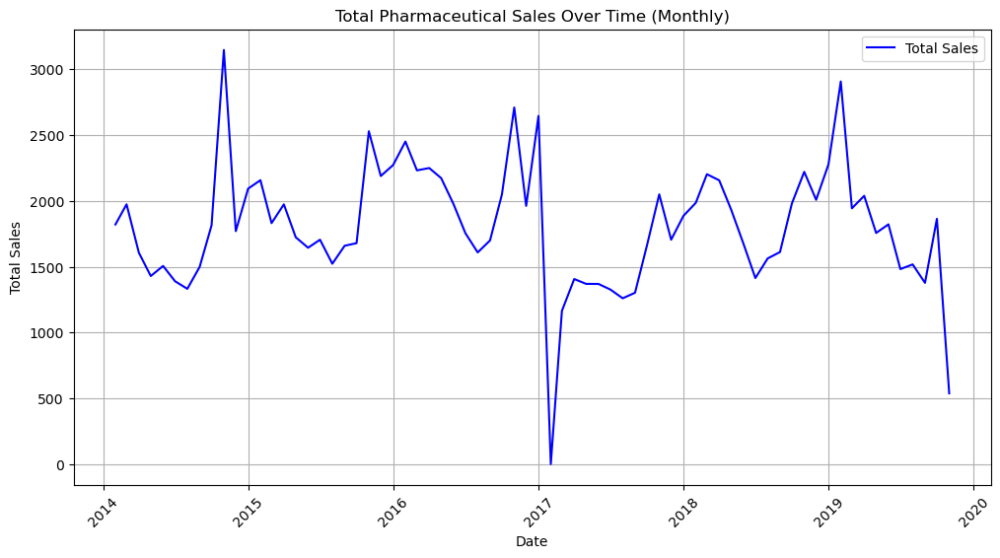

In [4]:
#Lets find the Total Sales for each month to see if we can find some trends in the data.
#We're using monthly totals for a cleaner and more readable graph.
drugs_columns = ["M01AB", "M01AE" , "N02BA", "N02BE", "N05B", "N05C", "R03", "R06"]

df_salesmonthly['Total Sales'] = df_salesmonthly[drugs_columns].sum(axis=1)

plt.figure(figsize=(12, 6))
plt.plot(df_salesmonthly["datum"], df_salesmonthly["Total Sales"], linestyle='-', color='b', label="Total Sales")

plt.xlabel("Date")
plt.ylabel("Total Sales")
plt.title("Total Pharmaceutical Sales Over Time (Monthly)")
plt.xticks(rotation=45)
plt.legend()
plt.grid()

plt.show()

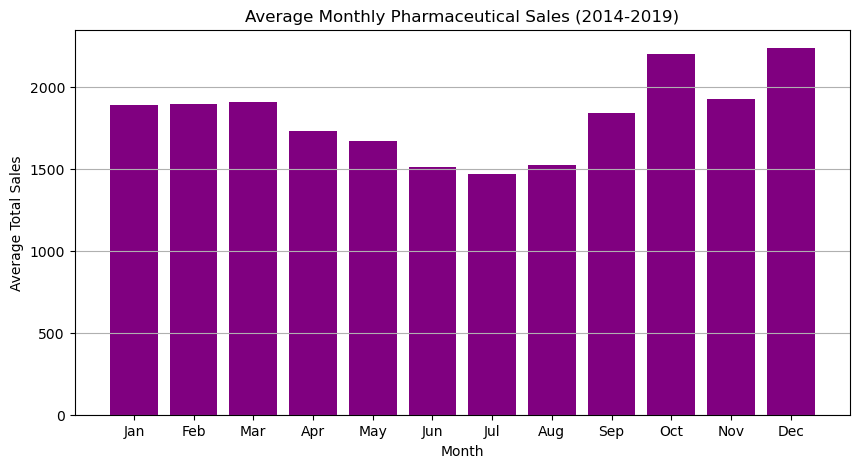

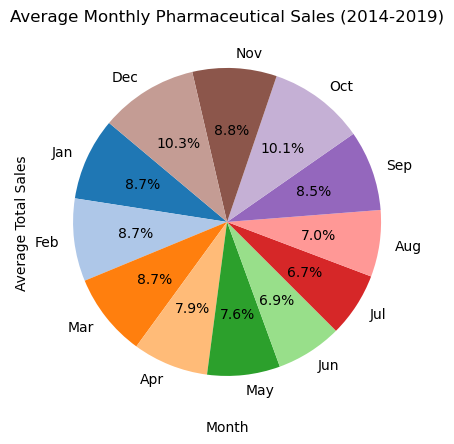

In [5]:
df_salesmonthly["Month"] = df_salesmonthly["datum"].dt.month
df_salesmonthly["Total Sales"] = df_salesmonthly[drugs_columns].sum(axis=1)

monthly_avg_sales = df_salesmonthly.groupby("Month")["Total Sales"].mean()
months_labels = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

#Creating a Bar plot
plt.figure(figsize=(10, 5))
plt.bar(months_labels, monthly_avg_sales, color="purple")

plt.xlabel("Month")
plt.ylabel("Average Total Sales")
plt.title("Average Monthly Pharmaceutical Sales (2014-2019)")
plt.grid(axis="y") #only horizontal grid lines
plt.show()

#Creating a Pie Chart to visualize the same data
plt.figure(figsize=(10, 5))
plt.pie(monthly_avg_sales, labels=months_labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)

plt.xlabel("Month")
plt.ylabel("Average Total Sales")
plt.title("Average Monthly Pharmaceutical Sales (2014-2019)")

plt.show()


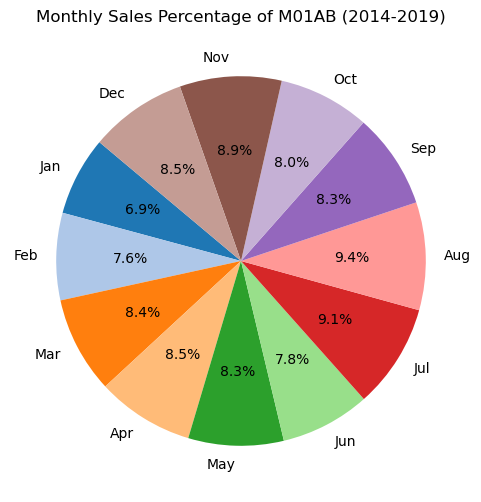

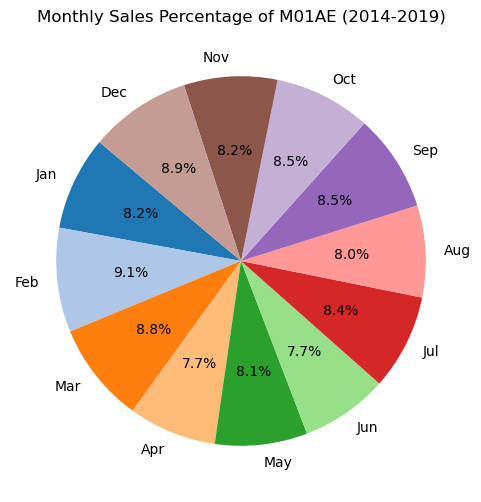

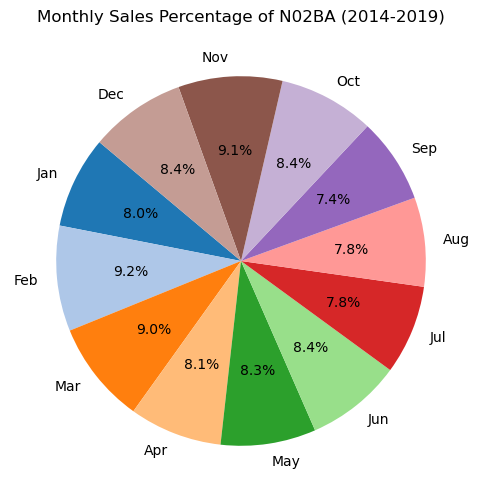

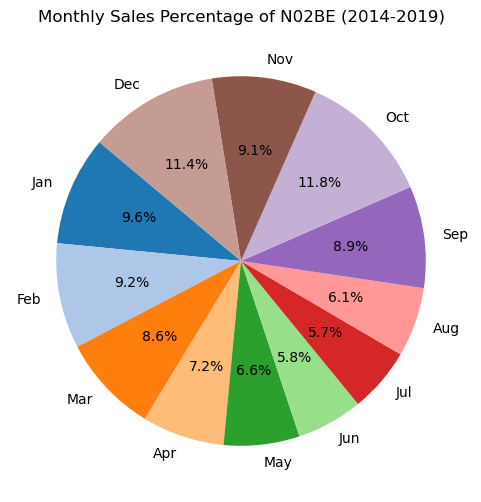

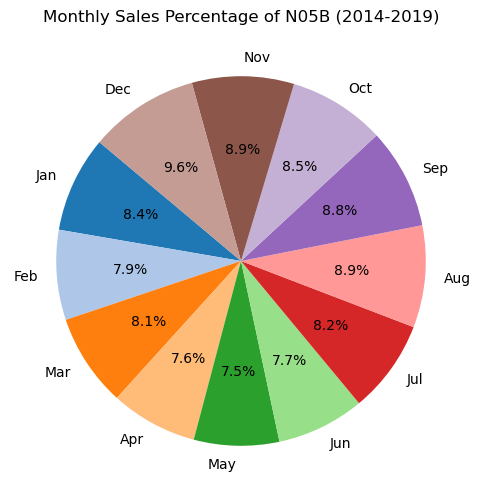

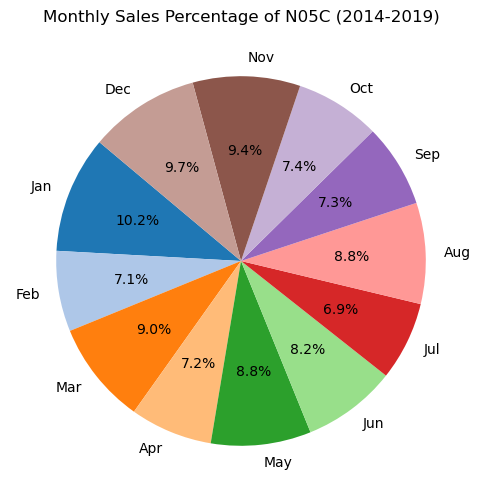

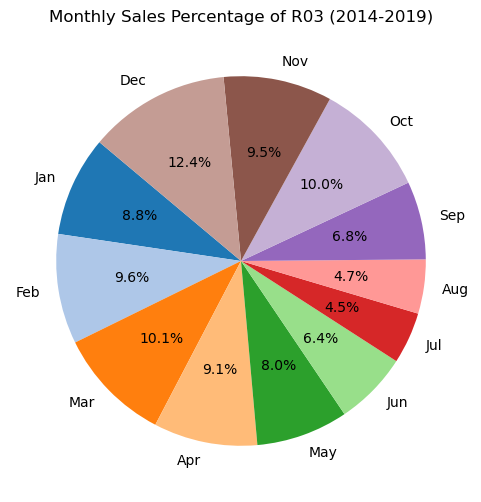

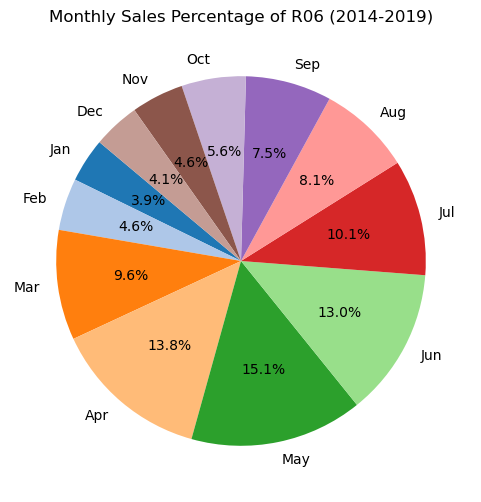

In [6]:
#Building a Pie Chart to visualize the monthly sales data for every drug.
for drug in drugs_columns:
    monthly_sales = df_salesmonthly.groupby("Month")[drug].mean()
    monthly_sales_percentage = (monthly_sales / monthly_sales.sum()) * 100
    plt.figure(figsize=(6, 6))
    plt.pie(monthly_sales_percentage, labels=months_labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)
    
    plt.title("Monthly Sales Percentage of " + drug + " (2014-2019)")
    plt.show()

### Quick Notes:
These pie charts `above` show the percentage of sales for each month that the drug sells in a year. For example if we take a look at R06 in the pie chart above, We can see that 15.1% of sales for R06 happen in the month of May. This may give us some insight for our Marketing team. If the administrative team decides that we want to promote the sale of R06, for example, the best time to do so would be in the months of April, May, and June. We also have a better understand of what months we may need more inventory for a particular drug.

In [7]:
top_products_monthly = {}

# Going through each month and collecting the top 3 products in terms of expected sales
for month in range(1, 13):
    # Filter the expected sales for the current month
    monthly_sales = df_salesmonthly[df_salesmonthly["Month"] == month][drugs_columns].mean()

    top_products = monthly_sales.sort_values(ascending=False).head(3)

    top_products_monthly[month] = top_products.index.tolist()

#Outputing the top three products for each month
for month, products in top_products_monthly.items():
    print(f"Month {month}: Top 3 Products: {products}")

Month 1: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 2: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 3: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 4: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 5: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 6: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 7: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 8: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 9: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 10: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 11: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 12: Top 3 Products: ['N02BE', 'N05B', 'R03']


In [8]:
drugs_columns = ["M01AB", "M01AE", "N02BA", "N02BE", "N05B", "N05C", "R03", "R06"]

monthly_sales = df_salesmonthly.groupby("Month")[drugs_columns].sum()

monthly_sales_percentage = (monthly_sales.T / monthly_sales.sum(axis=1)).T * 100

display(monthly_sales_percentage)

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
Month,,,,,,,,
1,6.598175,6.089627,5.884873,54.689986,14.041750,1.165584,9.432838,2.097167
2,7.264732,6.746487,6.738435,52.532357,13.130116,0.801691,10.316268,2.469914
3,7.990918,6.462196,6.497120,48.694161,13.446328,1.014553,10.714031,5.180693
4,8.867921,6.220617,6.487079,44.866578,13.855915,0.895234,10.656175,8.150482
5,9.018702,6.791776,6.915082,42.902641,14.125520,1.130602,9.805220,9.310457
6,9.351897,7.077010,7.666449,41.273994,16.033524,1.168078,8.628350,8.800697
7,11.213265,7.972968,7.357112,41.578526,17.528072,1.010623,6.245426,7.094009
8,11.142987,7.366936,7.067705,42.935431,18.468375,1.245796,6.305475,5.467295
9,8.152436,6.466476,5.586655,52.171099,15.051889,0.850645,7.529112,4.191688


In [9]:
ranked_months_df = monthly_sales_percentage.apply(lambda x: x.sort_values(ascending=False).index, axis=0)

ranked_months_df.index = [f"Rank {i+1}" for i in range(12)]

print(ranked_months_df)

         M01AB  M01AE  N02BA  N02BE  N05B  N05C  R03  R06
Rank 1       7      7      6     10     8     8   12    5
Rank 2       8      8      7     12     7     6    3    6
Rank 3       6      6      8      1     6     1    4    4
Rank 4       5      5      5      2     9     5    2    7
Rank 5       4      2      2      9    11    11   11    8
Rank 6      11      9     11     11     5     3    5    3
Rank 7       9      3      3      3     1     7    1    9
Rank 8       3      4      4      4     4    12   10   10
Rank 9       2      1      1      8    12     4    6    2
Rank 10     12     11      9      5     3     9    9   11
Rank 11      1     12     10      7     2     2    8    1
Rank 12     10     10     12      6    10    10    7   12


In [10]:
top_products_per_month = monthly_sales_percentage.apply(lambda x: x.sort_values(ascending=False).index[:3].tolist(), axis=1)

top_products_df = pd.DataFrame(top_products_per_month.tolist(), index=top_products_per_month.index, columns=["Top 1", "Top 2", "Top 3"])

print(top_products_df)

       Top 1 Top 2  Top 3
Month                    
1      N02BE  N05B    R03
2      N02BE  N05B    R03
3      N02BE  N05B    R03
4      N02BE  N05B    R03
5      N02BE  N05B    R03
6      N02BE  N05B  M01AB
7      N02BE  N05B  M01AB
8      N02BE  N05B  M01AB
9      N02BE  N05B  M01AB
10     N02BE  N05B    R03
11     N02BE  N05B    R03
12     N02BE  N05B    R03


In [11]:
#Here we are calculating the Coefficient of variation for each product.
cv_per_product = df_salesmonthly[drugs_columns].std() / df_salesmonthly[drugs_columns].mean()

stability_products = cv_per_product[cv_per_product < 0.3].index.tolist()  # Low variation (<30%)
growth_products = cv_per_product[cv_per_product >= 0.3].index.tolist()  # High variation (>=30%)

print(f"Stable Products: {stability_products}")
print(f"High Variable Products: {growth_products}")


Stable Products: ['M01AB', 'M01AE', 'N02BA']
High Variable Products: ['N02BE', 'N05B', 'N05C', 'R03', 'R06']


In [12]:
for product, cv in cv_per_product.items():
    print(f"Product: {product}, Coefficient of Variation: {cv:.2f}")

Product: M01AB, Coefficient of Variation: 0.21
Product: M01AE, Coefficient of Variation: 0.24
Product: N02BA, Coefficient of Variation: 0.27
Product: N02BE, Coefficient of Variation: 0.38
Product: N05B, Coefficient of Variation: 0.32
Product: N05C, Coefficient of Variation: 0.48
Product: R03, Coefficient of Variation: 0.49
Product: R06, Coefficient of Variation: 0.53


### Quick Notes:
`Above` we are calculating the coefficient of variation for each product. Since the coefficient of variation can help determine the volatility in a particular set of data, this can help us understand the stability of each product and help us rank which products are more stable and which ones are more volatile. We calculate this by dividing the standard deviation by the mean for each product. A lower coefficient of variation indicates a more stable product, while a higher coefficient of variation indicates more variability in sales. This can help us determine the level of "risk" for each product. We can then weigh theses risks along with the revenue potential and help us determine if the product is worth investing more money into. (ie. promoting the product for example.)

Formula for Coefficient of Variation:

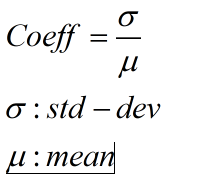

In our case I set the thresholds for low/high variation at 30%, meaning anything below 30% would be a more stable product while anything over would be considered less stable. This value can be changed depending on what strategy upper management may want. This is just one variable to consider.

### Quick Notes:
In this step `below` we are applying a simple linear regression to understand the gross general trends for each product. This is not necessarily meant to completely fit the data but just understand the general trend. In our case we are using a machine learning model via sklearn to help fit this.

In [13]:
df_salesmonthly_fixed = df_salesmonthly.groupby("Month")[drugs_columns].sum()

from sklearn.linear_model import LinearRegression
import numpy as np

# Function to calculate sales trend using Scikit-Learn
def calculate_trend_sklearn(product_sales):
    months = np.array(range(1, 13)).reshape(-1, 1)  # Reshape to column vector
    product_sales = np.array(product_sales).reshape(-1, 1)  # Ensure it's also a column vector
    model = LinearRegression()
    model.fit(months, product_sales)  # Fit the regression model
    return model.coef_[0][0]  # Return the slope (rate of change in sales)

# Apply trend calculation to each product (now fixed)
sales_trends = df_salesmonthly_fixed.apply(calculate_trend_sklearn, axis=0)

# Identify growth and declining products
growing_products = sales_trends[sales_trends > 0].index.tolist()  # Increasing trend
declining_products = sales_trends[sales_trends < 0].index.tolist()  # Decreasing trend

# Display results
print(f"Trending Growth Products: {growing_products}")
print(f"Trending Decline Products: {declining_products}")
print("Sales Trends (Slope per Product):")
print(sales_trends)

Trending Growth Products: ['M01AB', 'N02BE', 'N05B']
Trending Decline Products: ['M01AE', 'N02BA', 'N05C', 'R03', 'R06']
Sales Trends (Slope per Product):
M01AB     0.264196
M01AE    -8.059895
N02BA   -10.374549
N02BE    30.951780
N05B      3.286364
N05C     -1.283217
R03      -9.152972
R06     -20.308182
dtype: float64


### Quick Notes:
`Above` We can see that N02BE seems to have the highest increasing growth rate from all of the products we have data for. We can also see that R06 has the highest decreasing growth rate from all of the products we have data for. In addition, R06 has a very high Coefficient of variation meaning that it is a highly unstable product in terms of sales, therefore it is a far more "risky" product with a low revenue potential due it's highly decreasing growth. This may indicate that this product may not give us the best ROI on some investment and therefore we should heavily de-prioritize marketing and development product and consider keeping a lower inventory. While I don't think we should go so far as to say the company should completely eliminate this product from their catalog, the company should prioritize using the sales data for inventory purposes rather than promotional. There may be an exception for this product in the summer months as a majority of it's sales happen during that time. We can also consider altering our sales and inventory strategies to account for this.

We can also see that N02BE has the highest growth rate from all of the products we have data for. It is important to note, however, that N02BE still does have a higher coefficient of variation meaning that it's stability still puts the value of its investment into question. If we were to invest into this product, it would be more of a "high risk-high return" value investment. We need to understand how this product has done historically to get a better picture of what we should do with it.

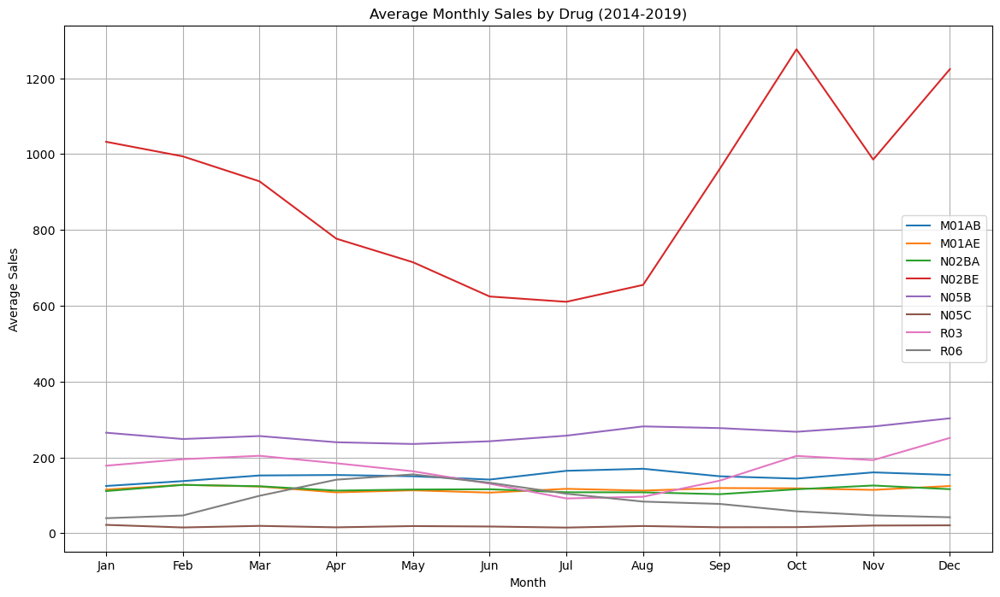

In [14]:
df_salesmonthly["Month"] = df_salesmonthly["datum"].dt.month
df_salesmonthly["Year"] = df_salesmonthly["datum"].dt.year

monthly_avg_by_drug = df_salesmonthly.groupby("Month")[drugs_columns].mean()

plt.figure(figsize=(14, 8))

for drug in drugs_columns:
    plt.plot(monthly_avg_by_drug.index, monthly_avg_by_drug[drug], label=drug)
plt.title("Average Monthly Sales by Drug (2014-2019)")
plt.xlabel("Month")
plt.ylabel("Average Sales")
plt.xticks(monthly_avg_by_drug.index, ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend()
plt.grid()
plt.show()

In [15]:
yoy_sales = df_salesmonthly.groupby("Year")[drugs_columns].sum()
yoy_growth = yoy_sales.pct_change() * 100 # Calculating Year-over-Year growth, this is the percentage change of sales from one year to the next.

print(yoy_sales)
print(yoy_growth)

        M01AB     M01AE     N02BA      N02BE    N05B   N05C      R03      R06
Year                                                                         
2014  1510.77  1333.594  1683.279  10094.555  4355.0  303.0  1277.00   828.30
2015  1905.62  1496.603  1608.630  11997.350  2965.0  159.0  1776.25   983.03
2016  2125.06  1604.441  1664.800  13435.830  3278.5  207.0  2137.00  1065.07
2017  1653.79  1214.485  1091.150   7674.919  2078.0  142.0  1732.00   919.61
2018  1786.93  1389.656  1123.800  11263.675  3266.2  242.0  2765.00  1196.80
2019  1517.27  1117.221   879.800   8011.616  2405.6  196.0  2050.00  1073.57
          M01AB      M01AE      N02BA      N02BE       N05B       N05C  \
Year                                                                     
2014        NaN        NaN        NaN        NaN        NaN        NaN   
2015  26.135679  12.223285  -4.434737  18.849717 -31.917336 -47.524752   
2016  11.515412   7.205518   3.491791  11.989981  10.573356  30.188679   
2017 -

### Quick Notes:

`Above` We clearly see that NO2BE drives most of the sales for this particular pharmaceutical company. From an earlier analysis, we also determined that this product is fairly volatile. This could mean that there is a strong relationship between the time of year and the sales of this product so that may be something to take into consideration. Next I want to see how the year over year sales are for each of our products. This will give us some better insights into growth opportunities.

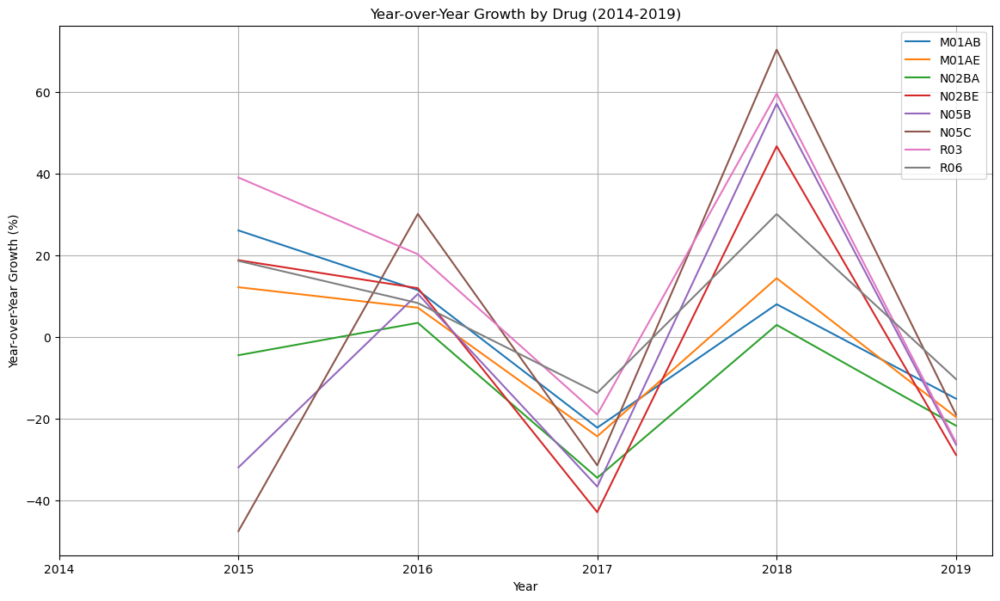

In [16]:
plt.figure(figsize=(14, 8))

for drug in drugs_columns:
    plt.plot(yoy_growth.index, yoy_growth[drug], label=drug)
plt.title("Year-over-Year Growth by Drug (2014-2019)")
plt.xlabel("Year")
plt.ylabel("Year-over-Year Growth (%)")
plt.xticks(yoy_growth.index, [str(year) for year in yoy_growth.index])
plt.legend()
plt.grid()

plt.show()

Finding cumulative growth

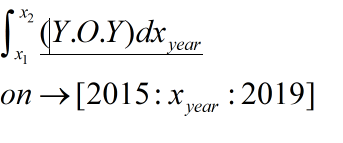

Using the trapezoidal numerical approximation method.

In [17]:
yoy_growth.index = yoy_growth.index.astype(int)

cumulative_growth = {}

for drug in drugs_columns:
    growth_curve = yoy_growth[drug].dropna().values 
    years = yoy_growth[drug].dropna().index.values 
    if len(growth_curve) > 1:
        area = np.trapz(growth_curve, x=years)
        cumulative_growth[drug] = area
    else:
        cumulative_growth[drug] = np.nan

cumulative_df = pd.DataFrame.from_dict(cumulative_growth, orient='index', columns=["Cumulative YoY Growth"])
cumulative_df = cumulative_df.sort_values("Cumulative YoY Growth", ascending=False)
print(cumulative_df)

       Cumulative YoY Growth
R03                67.618164
N05C               35.943740
R06                29.022335
N02BE              10.861096
M01AB               2.911722
N05B                2.002982
M01AE              -6.366394
N02BA             -41.046938


### Quick Notes:

`Above` So here we calculated the Y.O.Y growth for each drug. We also wanted to see which drugs may have the highest potential by measuring their cumulative growth. Since we set the Y.O.Y growth by year, it would be best to use the trapezoidal rule to find with drug has the biggest net area under the Y.O.Y growth curve. This will give us the highest cumulative growth. This is useful for identifying products with good potential.

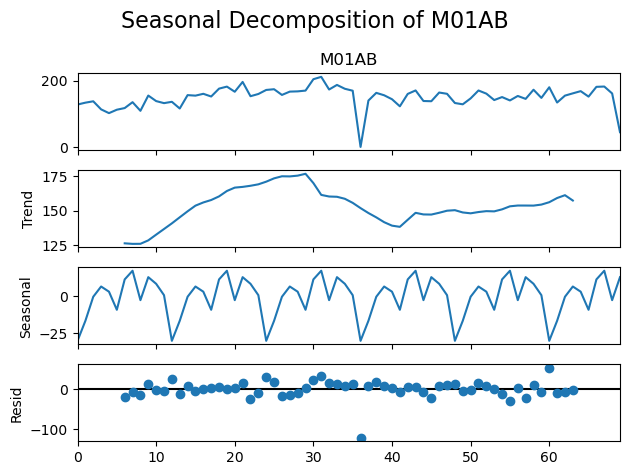

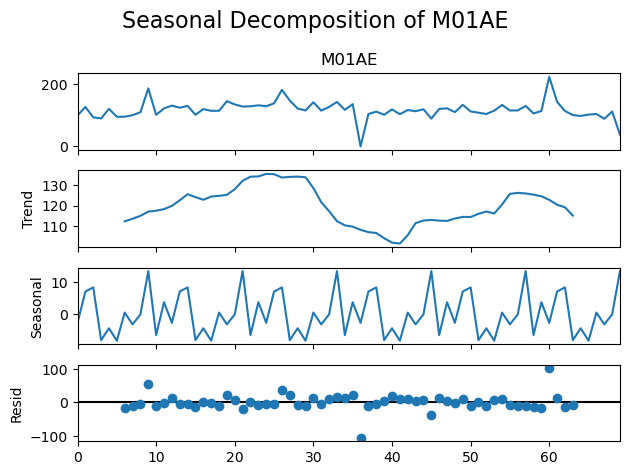

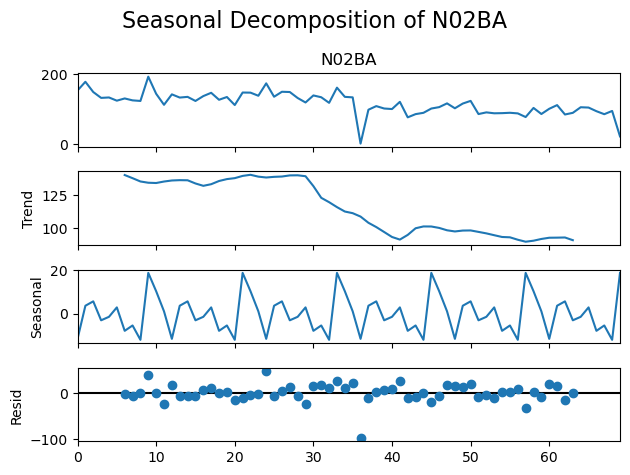

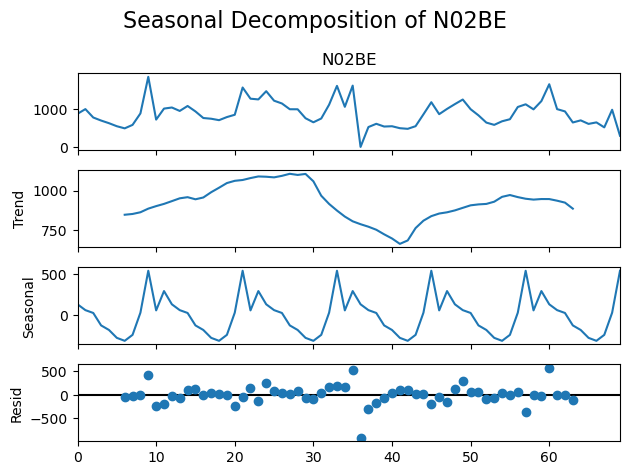

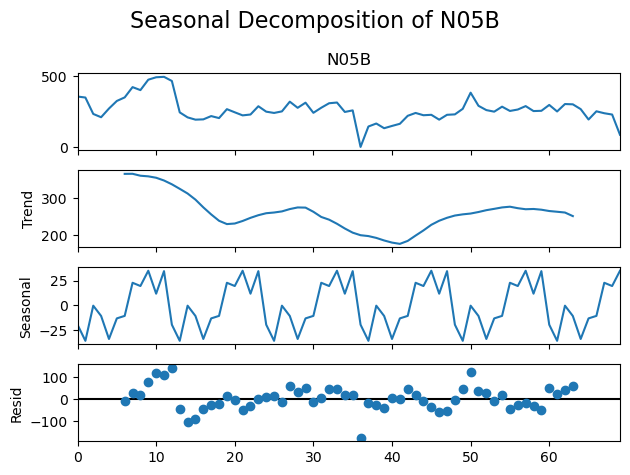

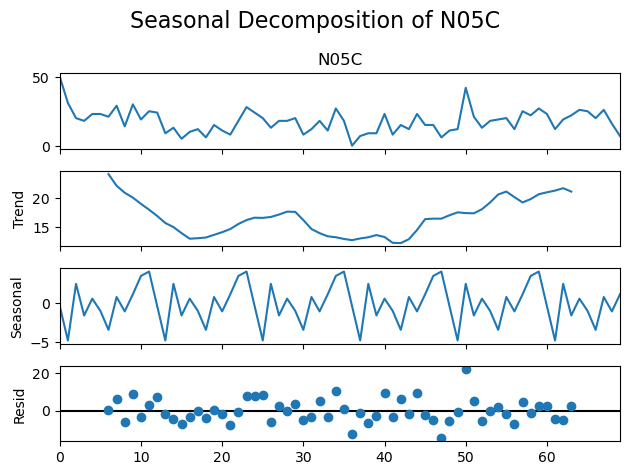

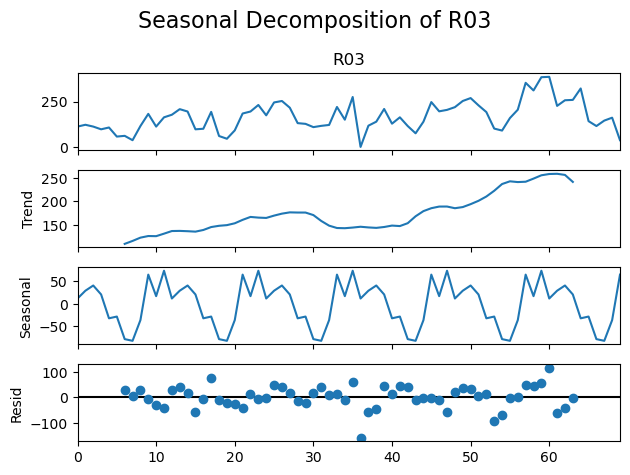

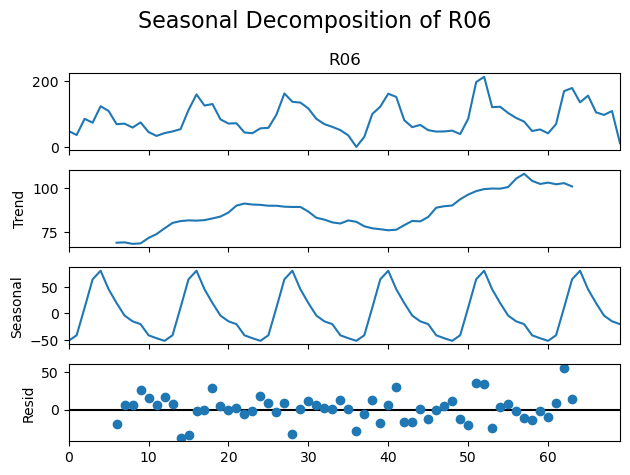

In [18]:
from statsmodels.tsa.seasonal import seasonal_decompose

figsize = (12, 8)
for drug in drugs_columns:
    result = seasonal_decompose(df_salesmonthly[drug], model='additive', period=12)
    result.plot()
    plt.suptitle(f"Seasonal Decomposition of {drug}", fontsize=16)
    plt.tight_layout()
    plt.show()



In [19]:
seasonality_strength = {}
for drug in drugs_columns:
    result = seasonal_decompose(df_salesmonthly[drug], model='additive', period=12)
    seasonality_strength[drug] = result.seasonal.var() / result.trend.var()

seasonality_df = pd.DataFrame.from_dict(seasonality_strength, orient='index', columns=["Seasonality Strength"])
seasonality_df.sort_values("Seasonality Strength", ascending=False, inplace=True)
print(seasonality_df)


       Seasonality Strength
R06               17.222011
N02BE              4.782192
R03                1.402891
M01AB              1.062657
N05C               0.650054
M01AE              0.578975
N05B               0.236950
N02BA              0.199591


In [20]:
seasonality_df.to_csv("seasonality_strength.csv")

In [21]:
outliers = {}

for drug in drugs_columns:
    result = seasonal_decompose(df_salesmonthly[drug], model='additive', period=12)
    resid = result.resid.dropna()  # Remove NaNs introduced by decomposition

    # Define an outlier as any point > 2 standard deviations from the mean
    threshold = 2 * resid.std()
    outlier_points = resid[np.abs(resid) > threshold]

    outliers[drug] = outlier_points

# Display outliers for each drug
for drug, points in outliers.items():
    print(f"\nOutliers for {drug}:")
    if not points.empty:
        print(points)
    else:
        print("No significant outliers detected.")



Outliers for M01AB:
36   -121.740410
60     53.673757
Name: resid, dtype: float64

Outliers for M01AE:
9      54.571301
36   -105.622633
60    102.373742
Name: resid, dtype: float64

Outliers for N02BA:
24    46.269269
36   -97.068231
Name: resid, dtype: float64

Outliers for N02BE:
9     425.117781
35    522.078306
36   -921.424719
60    581.341864
Name: resid, dtype: float64

Outliers for N05B:
10    120.471250
12    143.699583
36   -177.925417
50    123.196250
Name: resid, dtype: float64

Outliers for N05C:
47   -14.499826
50    22.108507
Name: resid, dtype: float64

Outliers for R03:
36   -157.517188
53    -93.759896
60    115.441146
Name: resid, dtype: float64

Outliers for R06:
14   -37.806420
62    56.190247
Name: resid, dtype: float64


21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:38 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
21:22:38 - cmdstanpy - INFO - Chain [1] start processing
21:22:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
21:22:39 - cmdstanpy - INFO - Chain [1] start processing
21:22:39 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
21:2

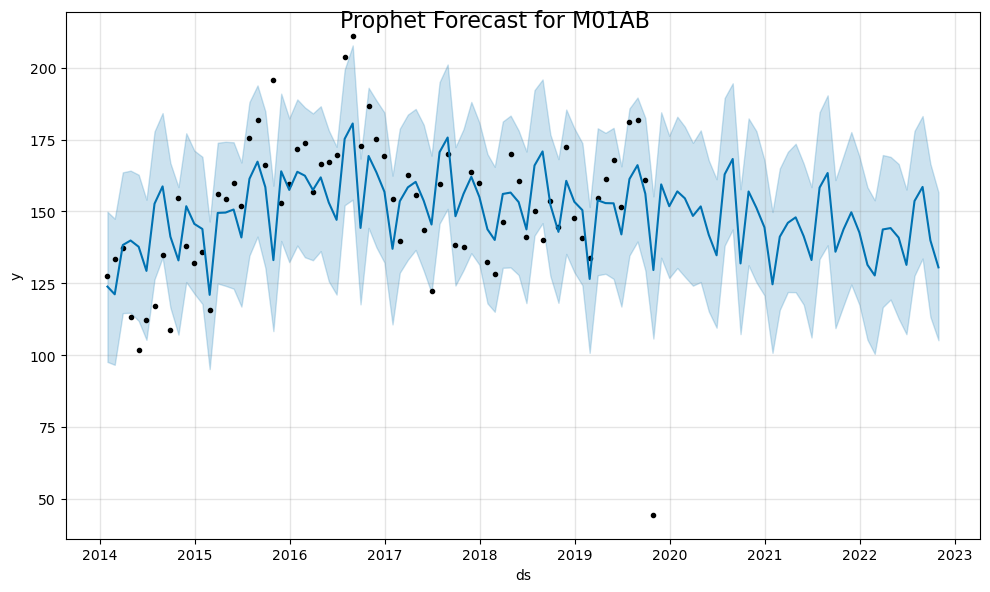

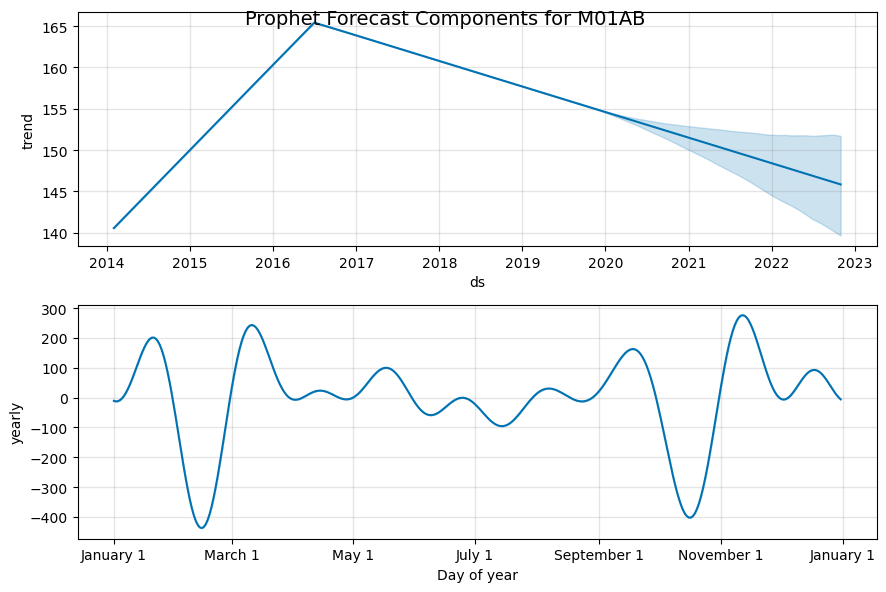

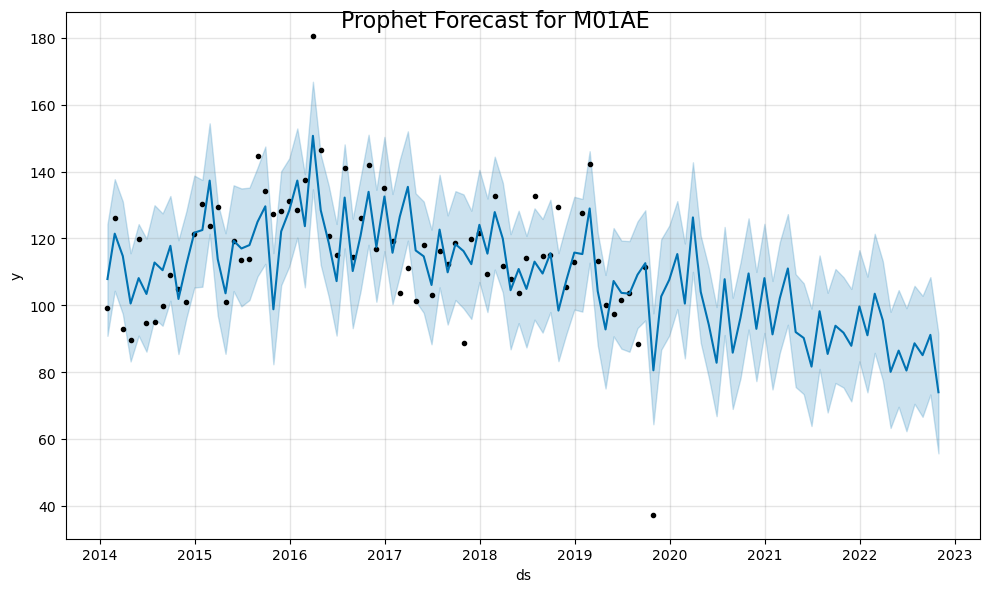

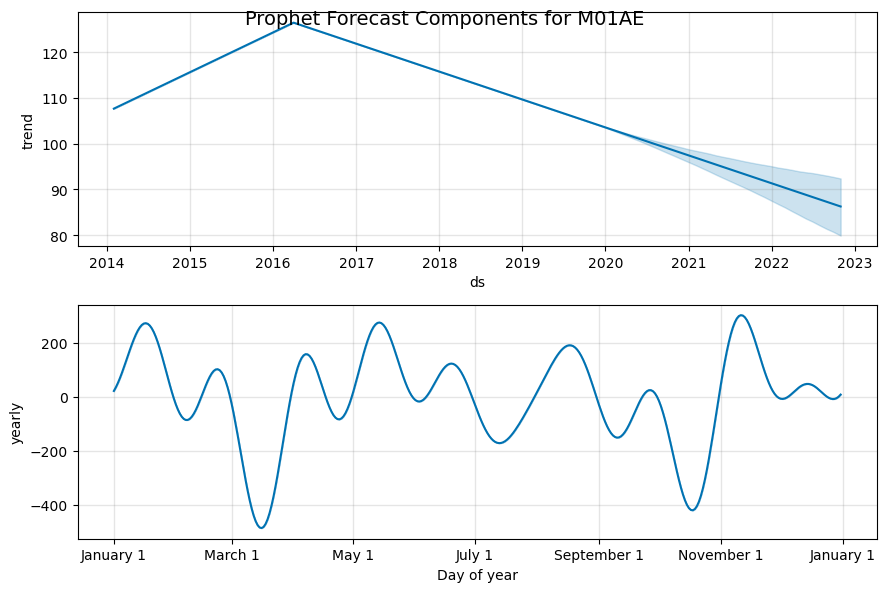

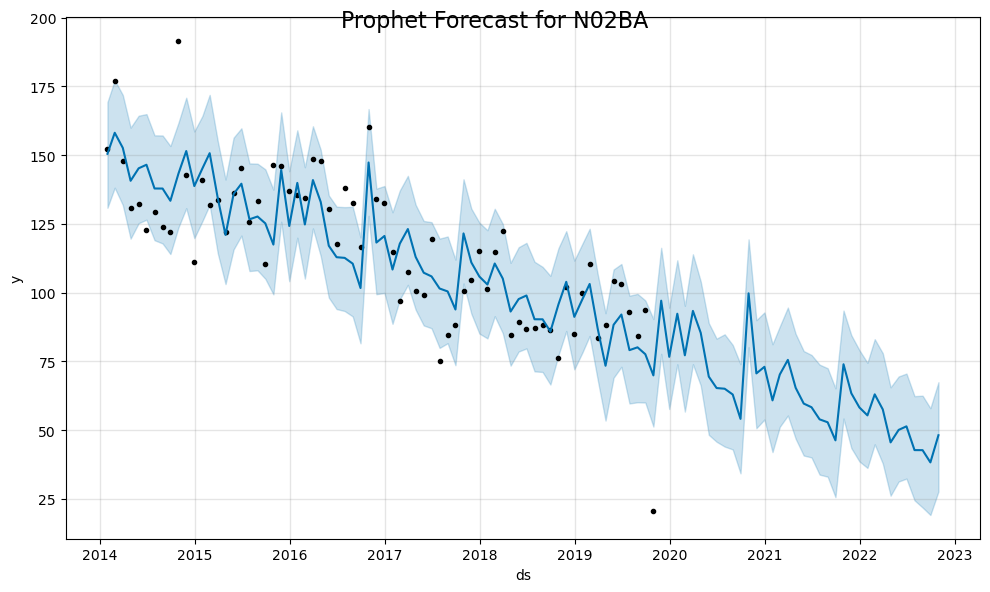

...

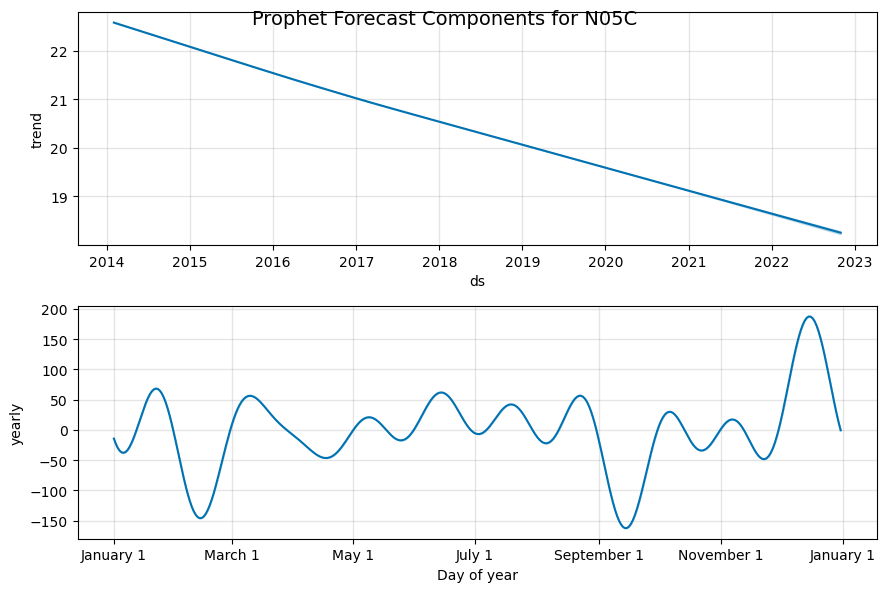

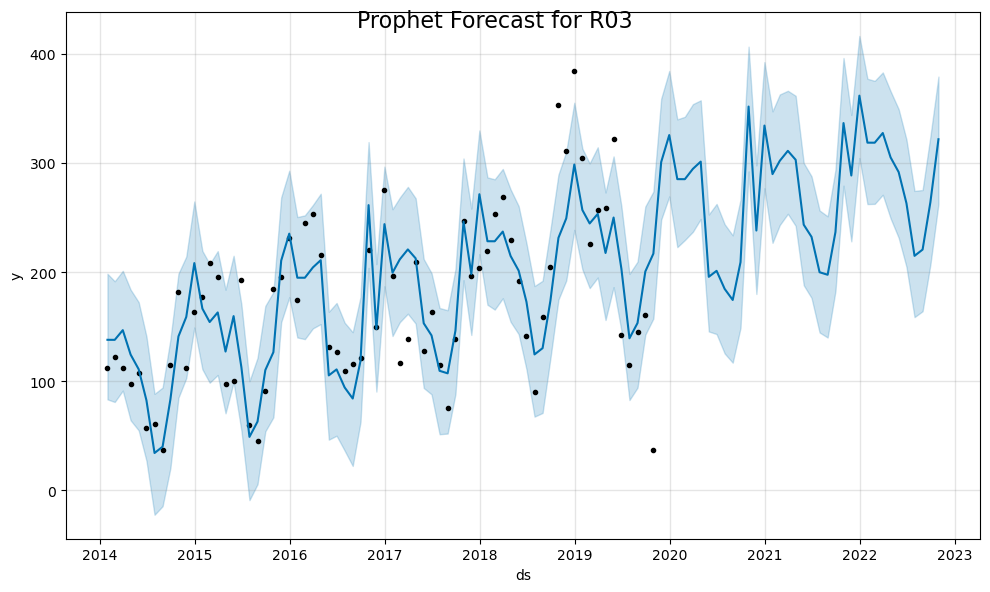

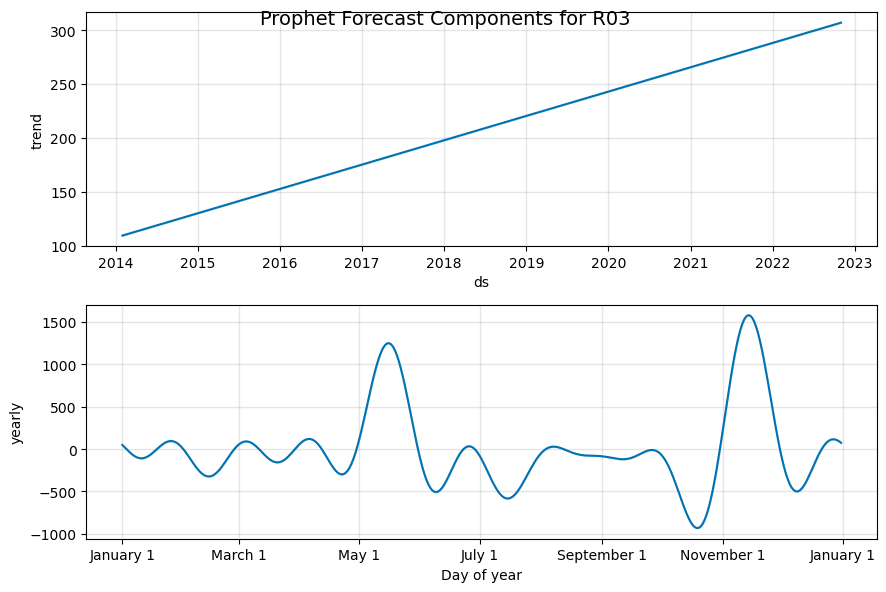

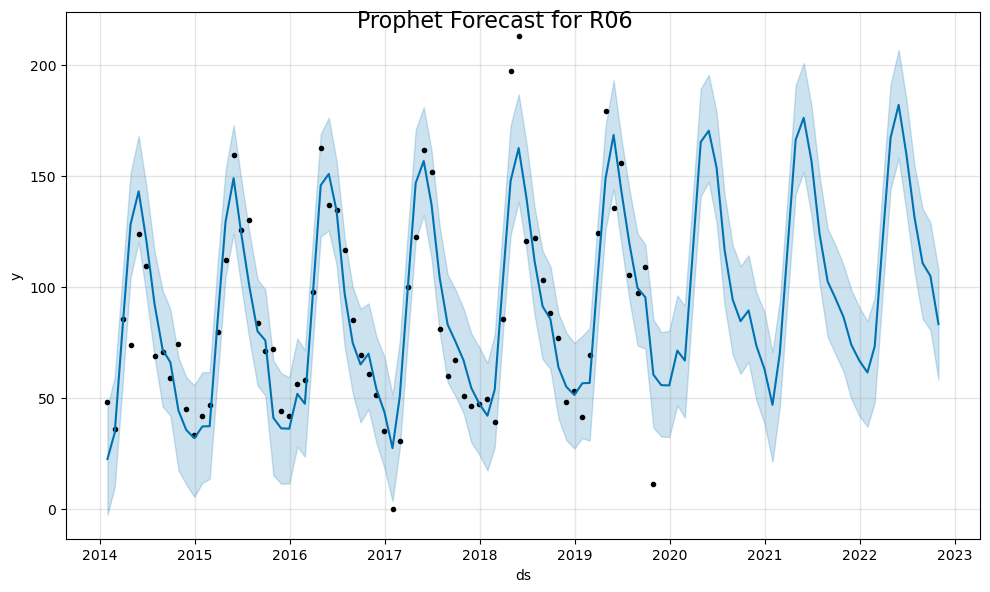

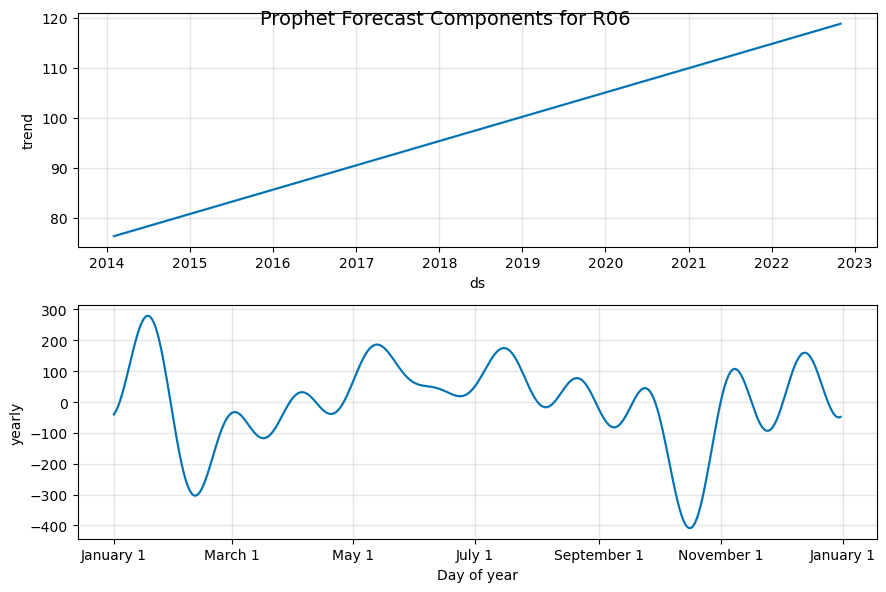

In [22]:
from prophet import Prophet

# Remove outliers from df_salesmonthly for each drug
df_salesmonthly_clean = df_salesmonthly.copy()

for drug, points in outliers.items():
    if not points.empty:
        df_salesmonthly_clean.loc[points.index, drug] = np.nan

# Optionally interpolate missing values
df_salesmonthly_clean.interpolate(method='linear', inplace=True)

# Prepare the dataframe
for drug in drugs_columns:
    df_prophet = df_salesmonthly_clean[['datum', drug]].rename(columns={'datum': 'ds', drug: 'y'})
    
# Initialize and fit the model
    model = Prophet()
    model.fit(df_prophet)

# Create future dataframe
    future = model.make_future_dataframe(periods=36, freq='M')  # Forecast 12 months ahead
    forecast = model.predict(future)

# Plot forecast
    fig1 = model.plot(forecast)
    fig1.suptitle(f"Prophet Forecast for {drug}", fontsize=16)

    fig2 = model.plot_components(forecast)
    fig2.suptitle(f"Prophet Forecast Components for {drug}", fontsize=14)


    figsize = (12, 8)



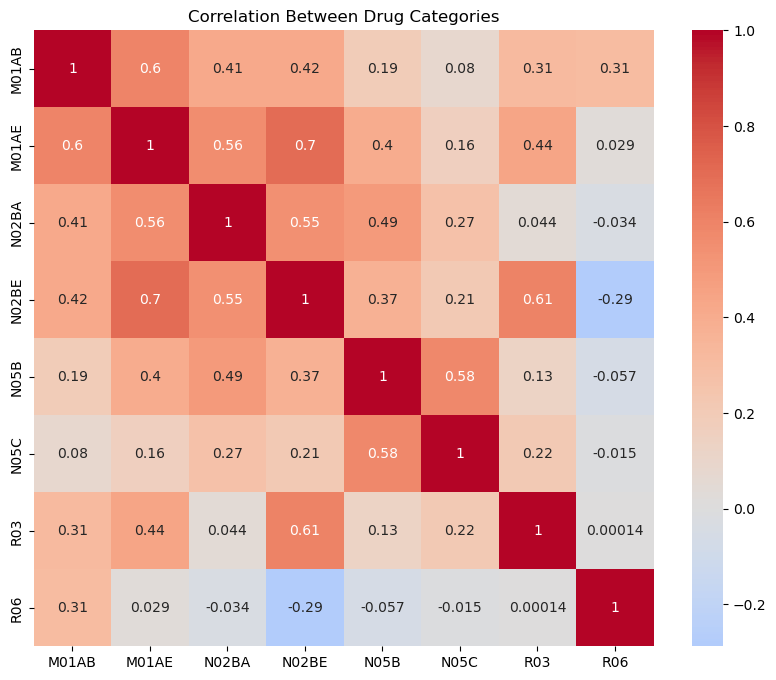

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Only use drug columns
drug_corr = df_salesmonthly[drugs_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(drug_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Between Drug Categories")
plt.show()


In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb

# Rereading our data to make sure we have a clean slate.
df_salesdaily = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Portfolio-Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesdaily.csv")
df_salesdaily.rename(columns={"datum": "date"}, inplace=True)
df_salesdaily['date'] = pd.to_datetime(df_salesdaily['date'])

# Check info and null values
df_salesdaily.info()
df_salesdaily.isnull().sum()  # Checking for null values

# Feature engineering
df_salesdaily['year'] = df_salesdaily['date'].dt.year
df_salesdaily['month'] = df_salesdaily['date'].dt.month
df_salesdaily['day'] = df_salesdaily['date'].dt.day
df_salesdaily['weekday'] = df_salesdaily['date'].dt.weekday

# Drop 'Weekday Name' and 'Hour' to avoid object and irrelevant dtype issues
for col in ['Weekday Name', 'Hour']:
    if col in df_salesdaily.columns:
        df_salesdaily.drop(columns=[col], inplace=True)

# One-hot encoding for weekday (keep all 7 days explicitly)
df_salesdaily = pd.get_dummies(df_salesdaily, columns=['weekday'], prefix='weekday', drop_first=False)

# Create 'Season' feature
season_map = {
    12: 'Winter', 1: 'Winter', 2: 'Winter',
    3: 'Spring', 4: 'Spring', 5: 'Spring',
    6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'
}
df_salesdaily['Season'] = df_salesdaily['month'].map(season_map)

# One-hot encode 'Season' (keep all seasons explicitly)
df_salesdaily = pd.get_dummies(df_salesdaily, columns=['Season'], drop_first=False)

# Create 'Quarter' feature
df_salesdaily['Quarter'] = df_salesdaily['date'].dt.quarter

# Define drug categories to loop through
drug_columns = ['M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06']

# Create lag features for each drug category
for drug in drug_columns:
    df_salesdaily[f'{drug}_t-1'] = df_salesdaily[drug].shift(1)
    df_salesdaily[f'{drug}_t-2'] = df_salesdaily[drug].shift(2)
    df_salesdaily[f'{drug}_t-3'] = df_salesdaily[drug].shift(3)

# Drop NaNs from lags
df_salesdaily.dropna(inplace=True)
df_salesdaily_LSTM = df_salesdaily.copy()

# Create a dictionary to hold feature/target splits per drug
data_splits = {}

for drug in drug_columns:
    X = df_salesdaily.drop(columns=['date'] + drug_columns)
    y = df_salesdaily[drug]

    X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.15, shuffle=False)
    X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.1765, shuffle=False)  # 15% of total

    data_splits[drug] = {
        'X_train': X_train, 'X_val': X_val, 'X_test': X_test,
        'y_train': y_train, 'y_val': y_val, 'y_test': y_test
    }


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2106 entries, 0 to 2105
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          2106 non-null   datetime64[ns]
 1   M01AB         2106 non-null   float64       
 2   M01AE         2106 non-null   float64       
 3   N02BA         2106 non-null   float64       
 4   N02BE         2106 non-null   float64       
 5   N05B          2106 non-null   float64       
 6   N05C          2106 non-null   float64       
 7   R03           2106 non-null   float64       
 8   R06           2106 non-null   float64       
 9   Year          2106 non-null   int64         
 10  Month         2106 non-null   int64         
 11  Hour          2106 non-null   int64         
 12  Weekday Name  2106 non-null   object        
dtypes: datetime64[ns](1), float64(8), int64(3), object(1)
memory usage: 214.0+ KB


Tuning n_estimators.

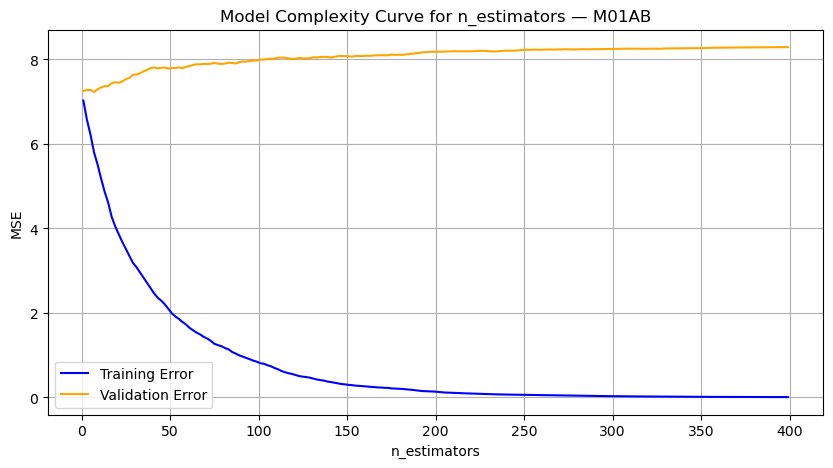

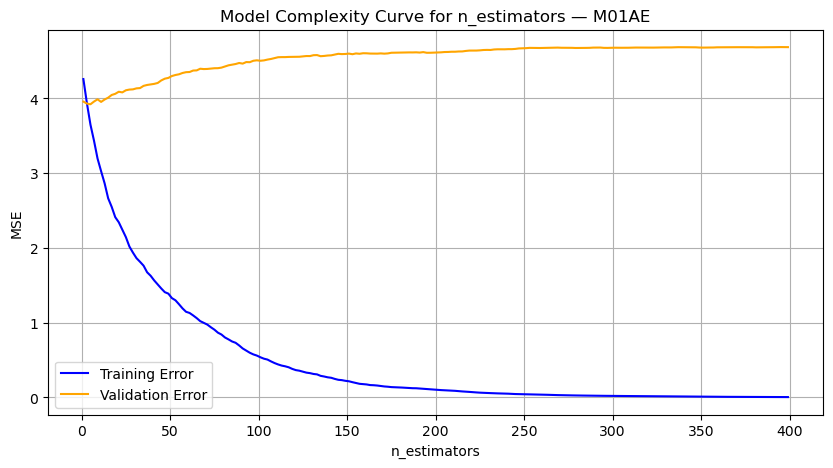

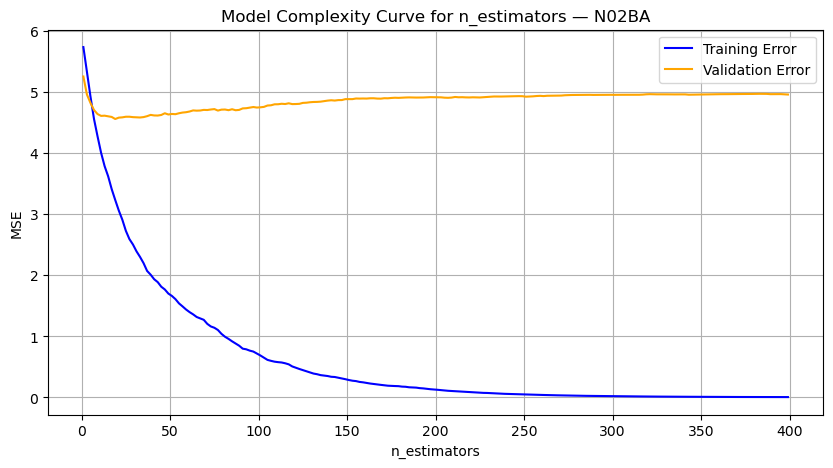

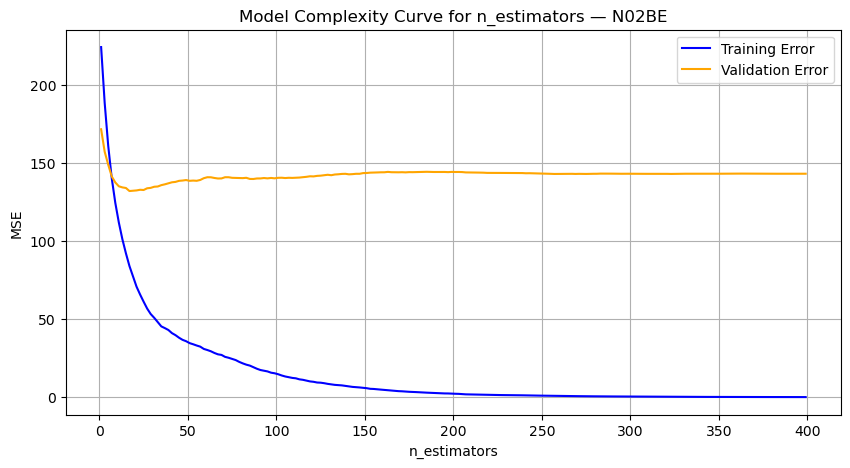

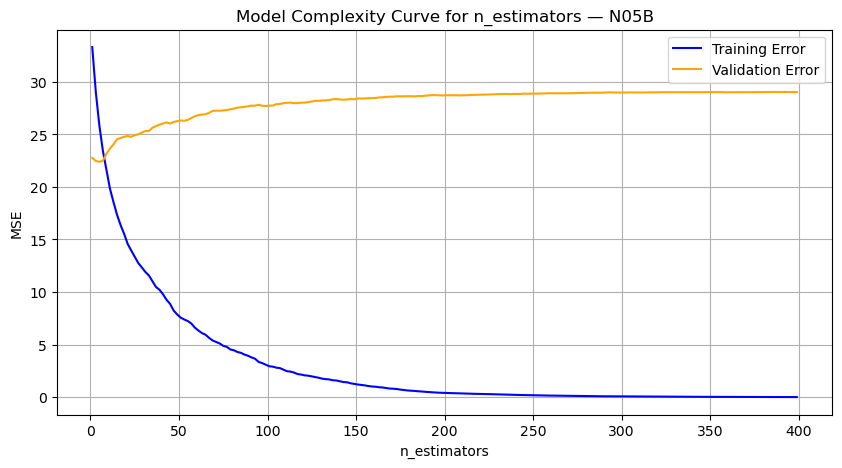

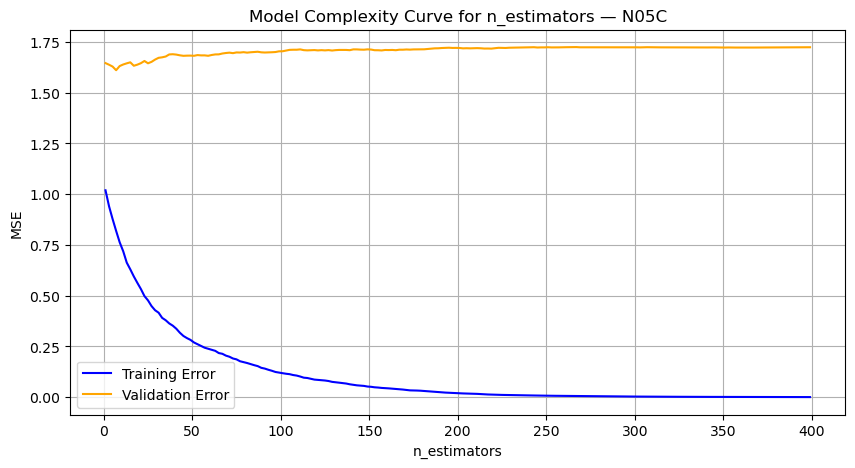

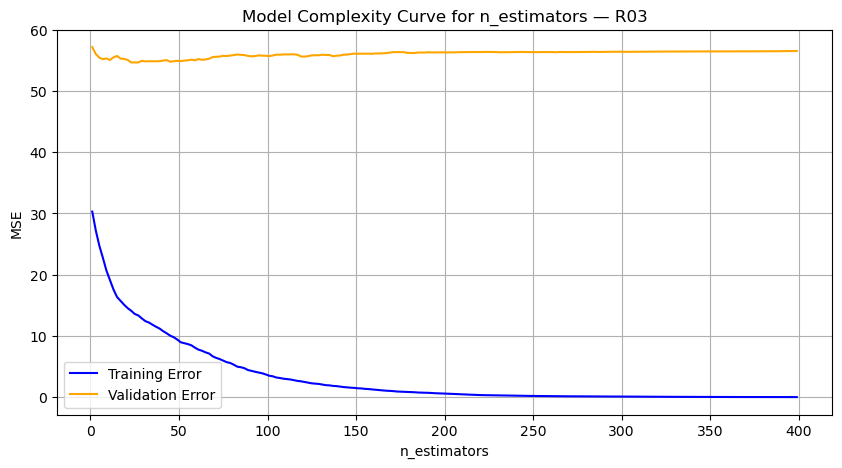

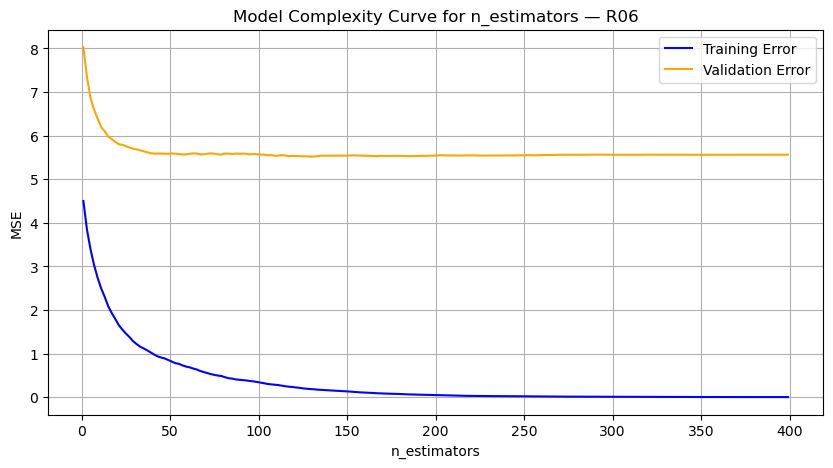

In [25]:
n_estimator_range = range(1, 401, 2)
results_n_estimators = {}

for drug in drug_columns:
    X_train = data_splits[drug]['X_train']
    X_val = data_splits[drug]['X_val']
    y_train = data_splits[drug]['y_train']
    y_val = data_splits[drug]['y_val']

    train_errors = []
    val_errors = []

    for n in n_estimator_range:
        model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=n,
            learning_rate=0.1,
            max_depth=6,
            subsample=1.0,
            colsample_bytree=1.0,
            gamma=0,
            reg_alpha=0,
            reg_lambda=1,
            random_state=42
        )
        model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_val_pred = model.predict(X_val)

        train_errors.append(mean_squared_error(y_train, y_train_pred))
        val_errors.append(mean_squared_error(y_val, y_val_pred))

    results_n_estimators[drug] = {
        'train_errors': train_errors,
        'val_errors': val_errors
    }

    plt.figure(figsize=(10, 5))
    plt.plot(n_estimator_range, train_errors, label='Training Error', color='blue')
    plt.plot(n_estimator_range, val_errors, label='Validation Error', color='orange')
    plt.title(f'Model Complexity Curve for n_estimators — {drug}')
    plt.xlabel('n_estimators')
    plt.ylabel('MSE')
    plt.legend()
    plt.grid(True)
    plt.show()

In [26]:
optimal_n_estimators = {
    'M01AB': 60,
    'M01AE': 40,
    'N02BA': 70,
    'N02BE': 100,
    'N05B': 60,
    'N05C': 50,
    'R03': 60,
    'R06': 100
}

Tuning Max Depth

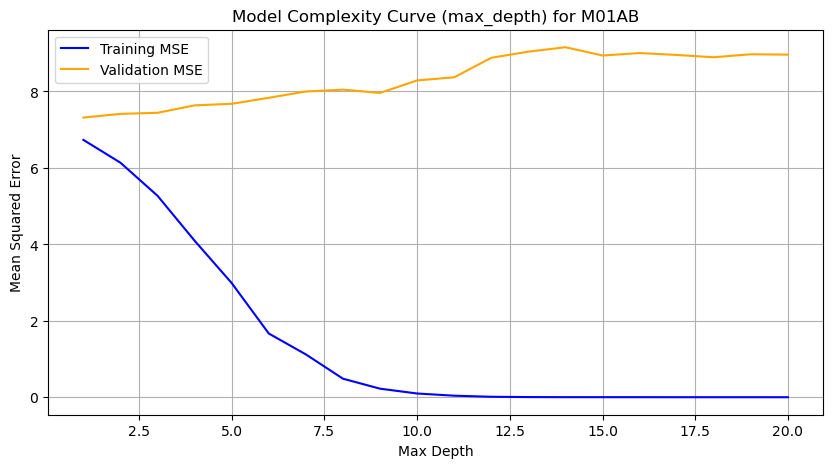

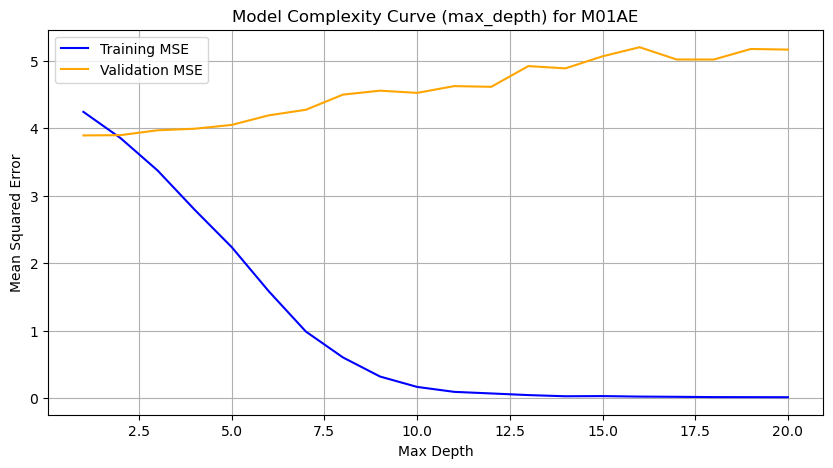

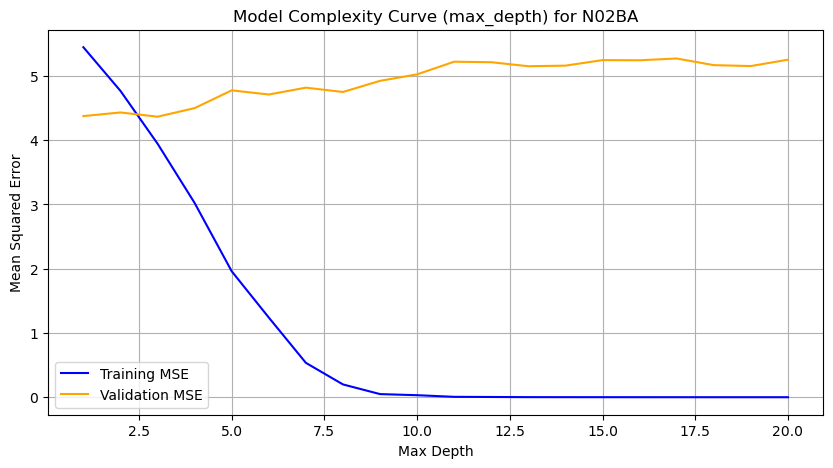

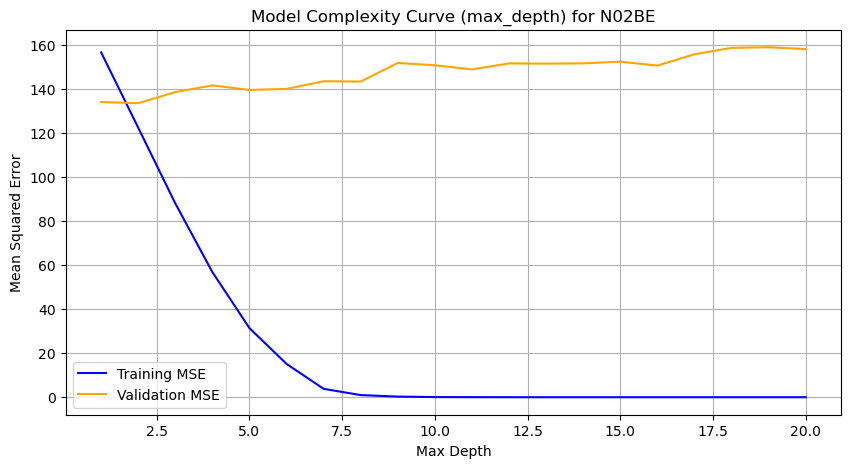

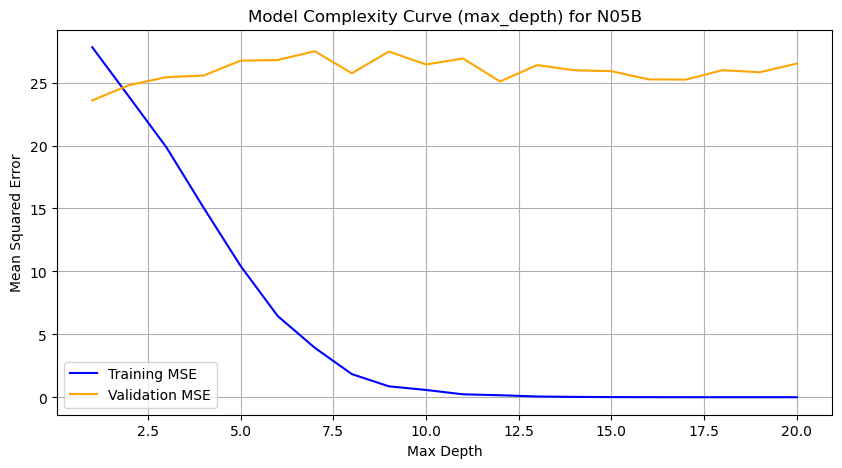

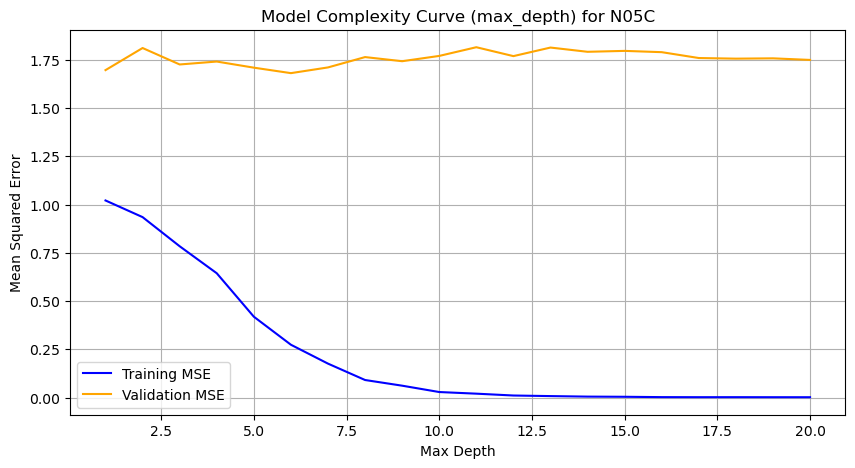

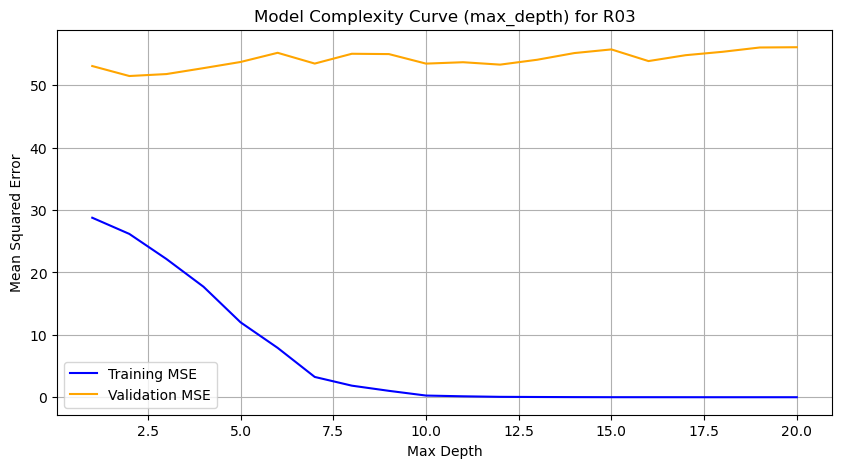

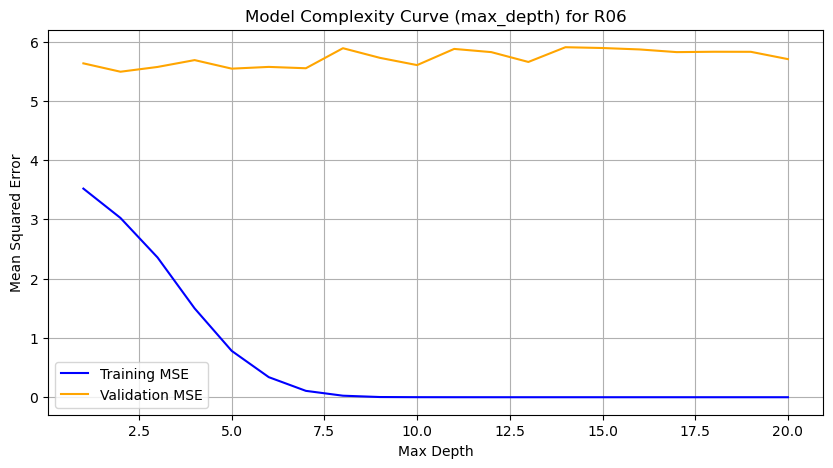

In [27]:
train_errors = {}
val_errors = {}

for drug in drug_columns:
    X_train = data_splits[drug]['X_train']
    y_train = data_splits[drug]['y_train']
    X_val = data_splits[drug]['X_val']
    y_val = data_splits[drug]['y_val']

    train_mse = []
    val_mse = []

    for depth in range(1, 21):
        model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=optimal_n_estimators[drug],
            max_depth=depth,
            learning_rate=0.1,
            subsample=1.0,
            colsample_bytree=1.0,
            gamma=0,
            reg_alpha=0,
            reg_lambda=1,
            random_state=42
        )

        model.fit(X_train, y_train)
        train_pred = model.predict(X_train)
        val_pred = model.predict(X_val)

        train_mse.append(mean_squared_error(y_train, train_pred))
        val_mse.append(mean_squared_error(y_val, val_pred))

    train_errors[drug] = train_mse
    val_errors[drug] = val_mse

    plt.figure(figsize=(10, 5))
    plt.plot(range(1, 21), train_mse, label='Training MSE', color='blue')
    plt.plot(range(1, 21), val_mse, label='Validation MSE', color='orange')
    plt.title(f'Model Complexity Curve (max_depth) for {drug}')
    plt.xlabel('Max Depth')
    plt.ylabel('Mean Squared Error')
    plt.legend()
    plt.grid(True)
    plt.show()


In [28]:
optimal_max_depth = {
    'M01AB': 6,
    'M01AE': 7,
    'N02BA': 6,
    'N02BE': 7,
    'N05B': 8,
    'N05C': 5,
    'R03': 7,
    'R06': 8
}


Tuning Learning Rate:

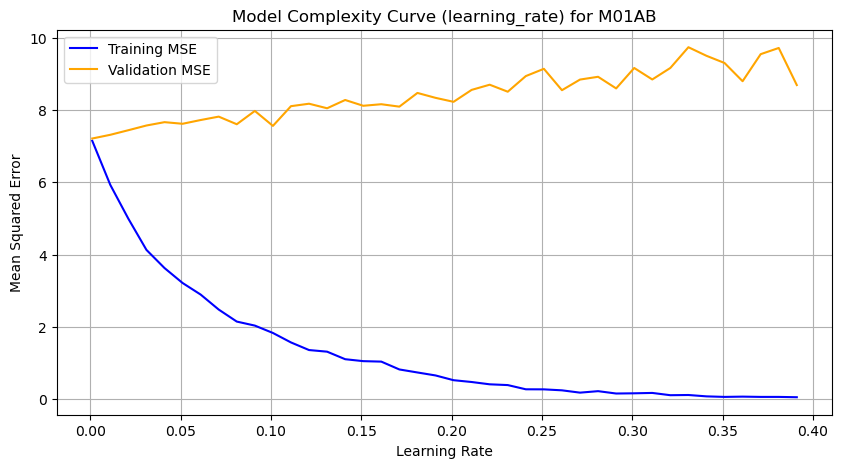

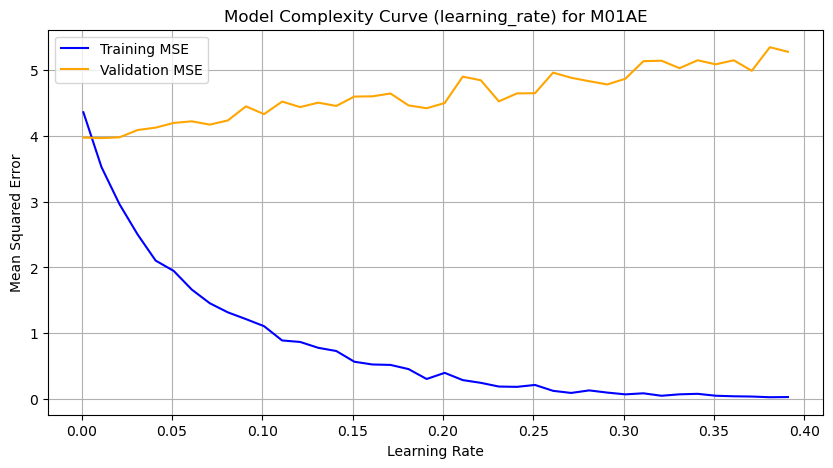

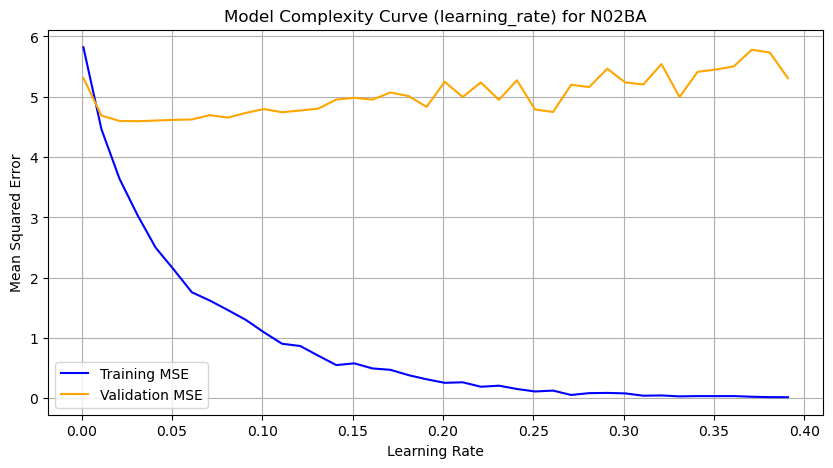

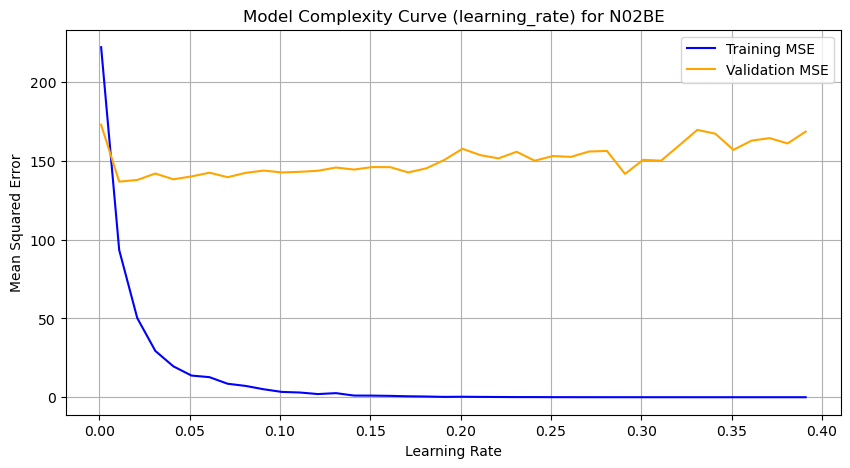

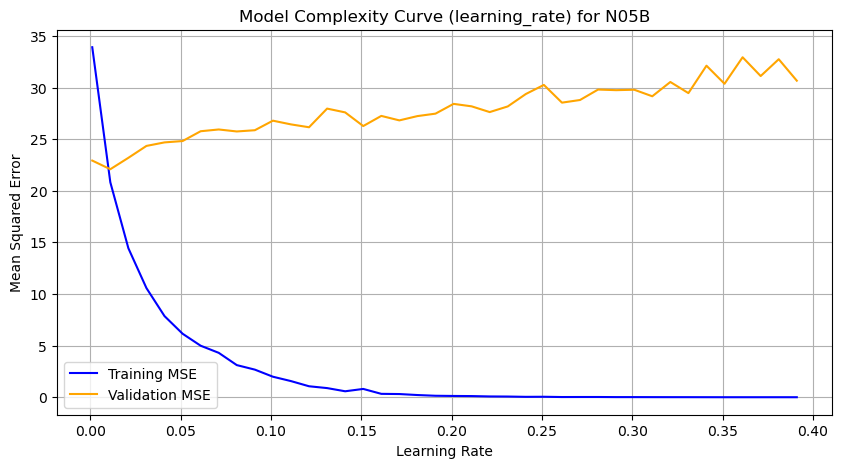

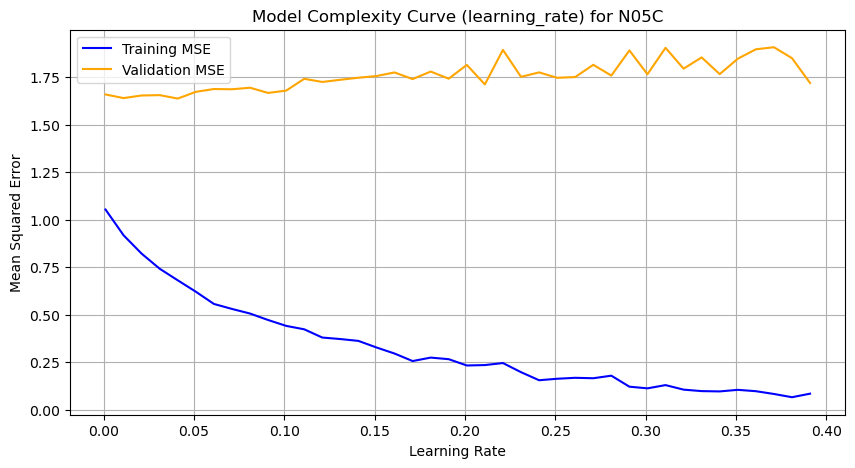

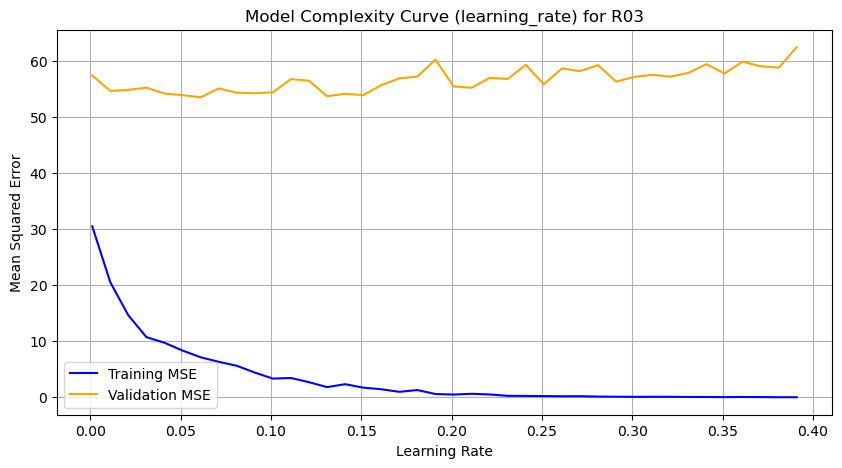

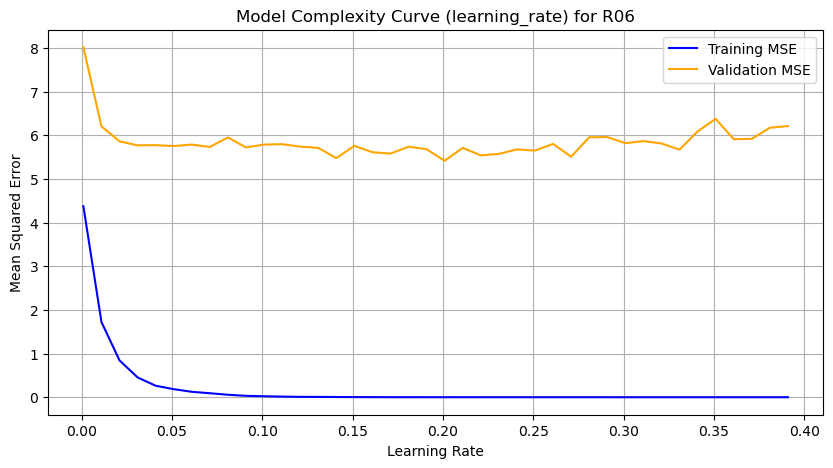

In [29]:
train_errors = {}
val_errors = {}

learning_rates = np.arange(0.001, 0.401, 0.01)

for drug in drug_columns:
    X_train = data_splits[drug]['X_train']
    y_train = data_splits[drug]['y_train']
    X_val = data_splits[drug]['X_val']
    y_val = data_splits[drug]['y_val']

    train_mse = []
    val_mse = []

    for lr in learning_rates:
        model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=optimal_n_estimators[drug],
            max_depth=optimal_max_depth[drug],
            learning_rate=lr,
            subsample=1.0,
            colsample_bytree=1.0,
            gamma=0,
            reg_alpha=0,
            reg_lambda=1,
            random_state=42
        )

        model.fit(X_train, y_train)
        train_pred = model.predict(X_train)
        val_pred = model.predict(X_val)

        train_mse.append(mean_squared_error(y_train, train_pred))
        val_mse.append(mean_squared_error(y_val, val_pred))

    train_errors[drug] = train_mse
    val_errors[drug] = val_mse

    plt.figure(figsize=(10, 5))
    plt.plot(learning_rates, train_mse, label='Training MSE', color='blue')
    plt.plot(learning_rates, val_mse, label='Validation MSE', color='orange')
    plt.title(f'Model Complexity Curve (learning_rate) for {drug}')
    plt.xlabel('Learning Rate')
    plt.ylabel('Mean Squared Error')
    plt.legend()
    plt.grid(True)
    plt.show()


In [30]:
optimal_learning_rate = {
    'M01AB': 0.135,
    'M01AE': 0.080,
    'N02BA': 0.265,
    'N02BE': 0.275,
    'N05B': 0.155,
    'N05C': 0.180,
    'R03': 0.085,
    'R06': 0.20  
}



Subsample

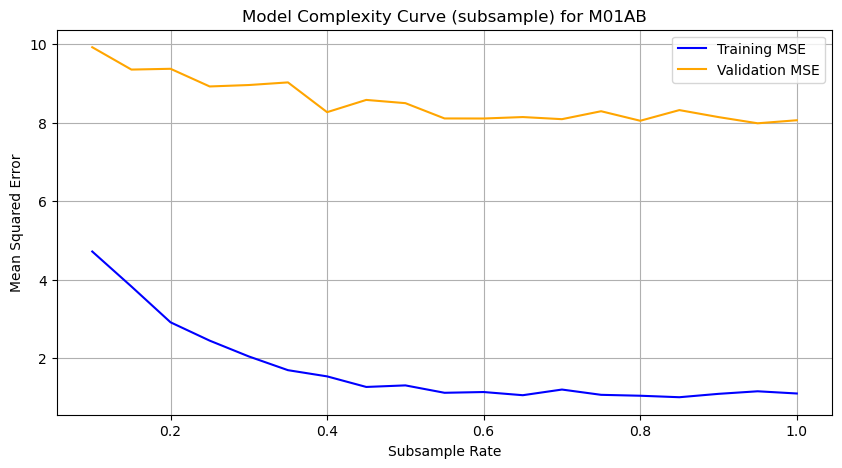

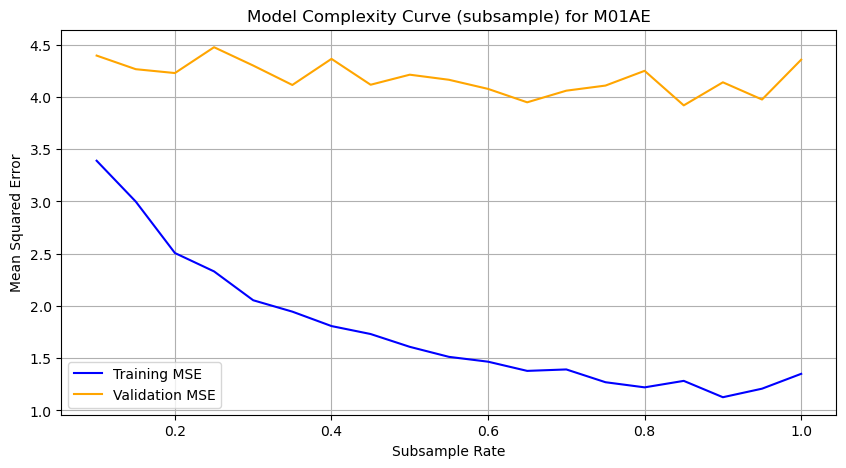

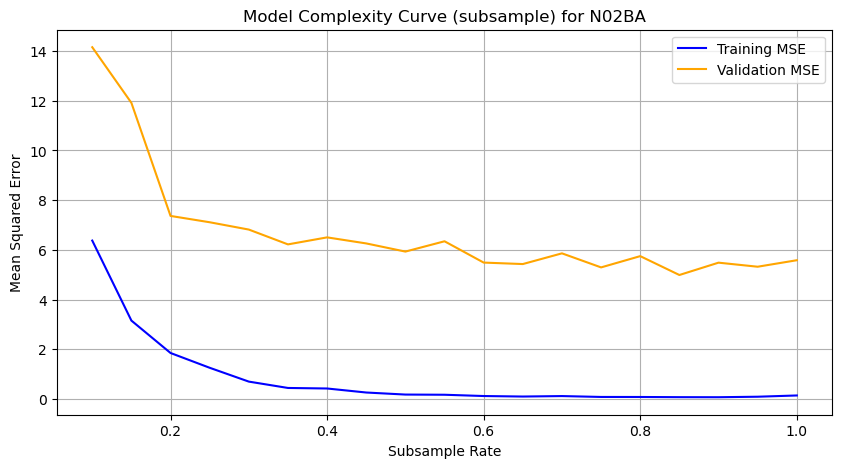

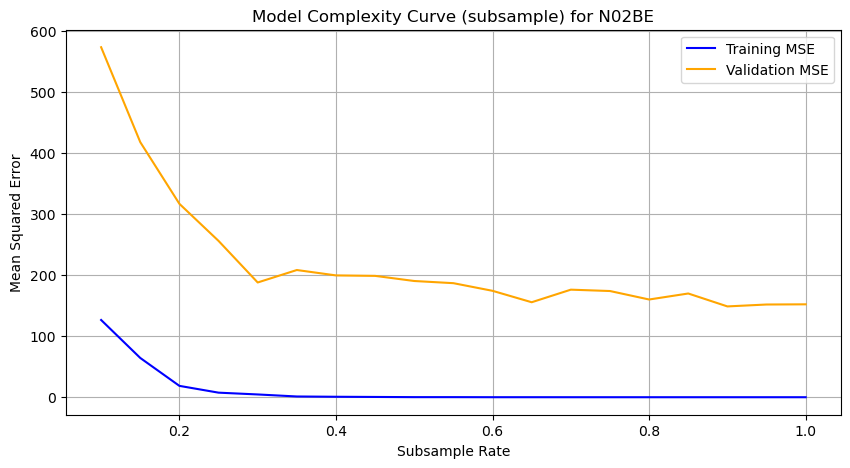

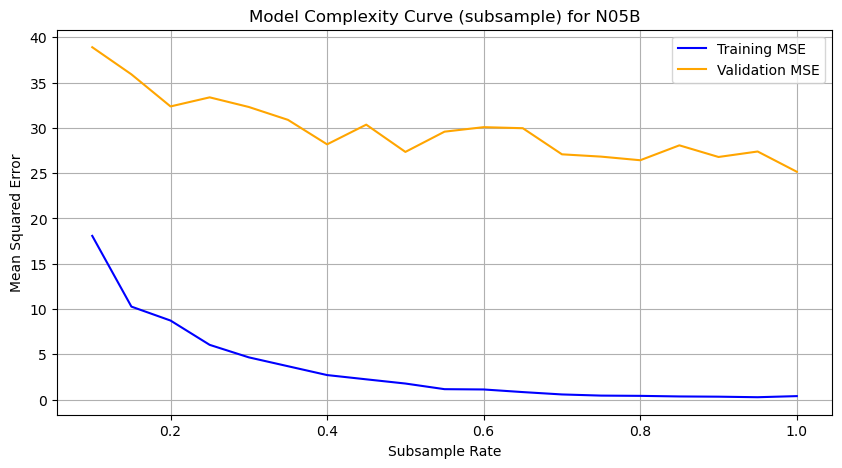

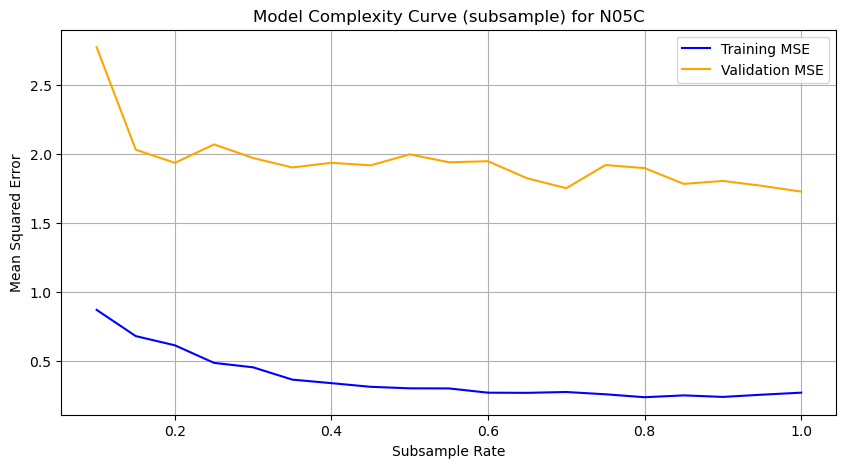

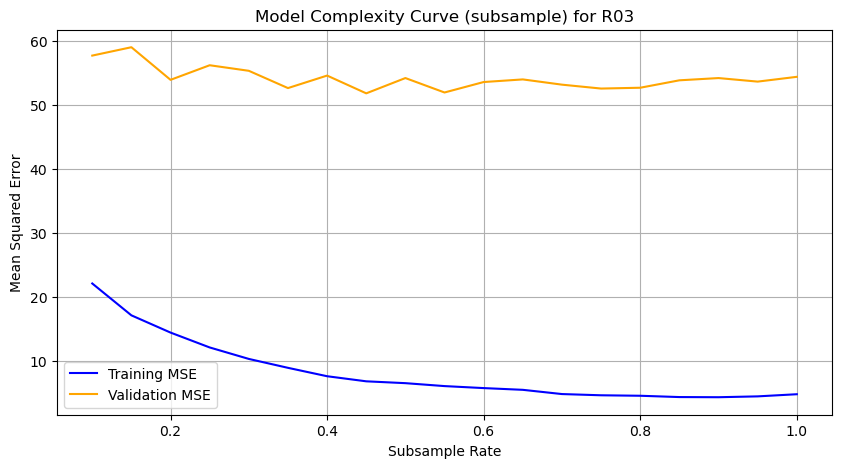

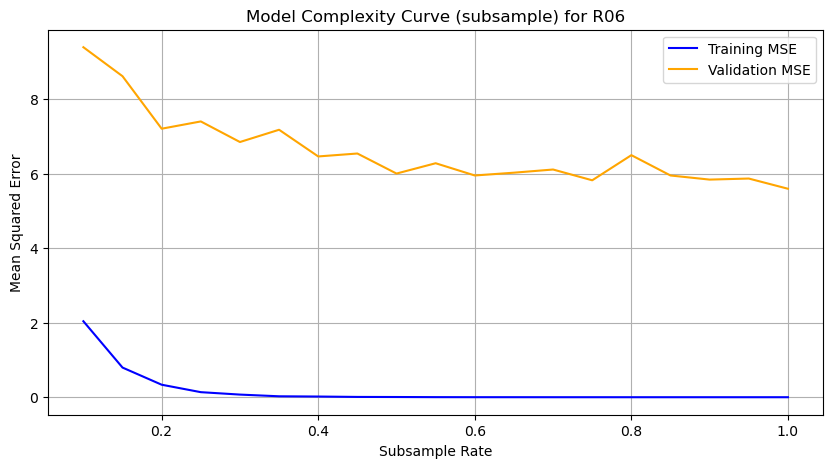

In [31]:
train_errors = {}
val_errors = {}

subsample_rates = np.arange(0.1, 1.01, 0.05)

for drug in drug_columns:
    X_train = data_splits[drug]['X_train']
    y_train = data_splits[drug]['y_train']
    X_val = data_splits[drug]['X_val']
    y_val = data_splits[drug]['y_val']

    train_mse = []
    val_mse = []

    for ss in subsample_rates:
        model = xgb.XGBRegressor(
            objective='reg:squarederror',
            n_estimators=optimal_n_estimators[drug],
            max_depth=optimal_max_depth[drug],
            learning_rate=optimal_learning_rate[drug],
            subsample=ss,
            colsample_bytree=1.0,
            gamma=0,
            reg_alpha=0,
            reg_lambda=1,
            random_state=42
        )

        model.fit(X_train, y_train)
        train_pred = model.predict(X_train)
        val_pred = model.predict(X_val)

        train_mse.append(mean_squared_error(y_train, train_pred))
        val_mse.append(mean_squared_error(y_val, val_pred))

    train_errors[drug] = train_mse
    val_errors[drug] = val_mse

    plt.figure(figsize=(10, 5))
    plt.plot(subsample_rates, train_mse, label='Training MSE', color='blue')
    plt.plot(subsample_rates, val_mse, label='Validation MSE', color='orange')
    plt.title(f'Model Complexity Curve (subsample) for {drug}')
    plt.xlabel('Subsample Rate')
    plt.ylabel('Mean Squared Error')
    plt.legend()
    plt.grid(True)
    plt.show()


In [32]:
optimal_subsample_rate = {
    'M01AB': 0.95,
    'M01AE': 0.85,
    'N02BA': 0.85,
    'N02BE': 0.9,
    'N05B': 1.0,
    'N05C': 1.0,
    'R03': 0.95,
    'R06': 1.0  
}



Training XGBoost model for M01AB...

M01AB — Test MSE: 9.24, RMSE: 3.04, R²: -0.10
Accuracy for M01AB: -0.10


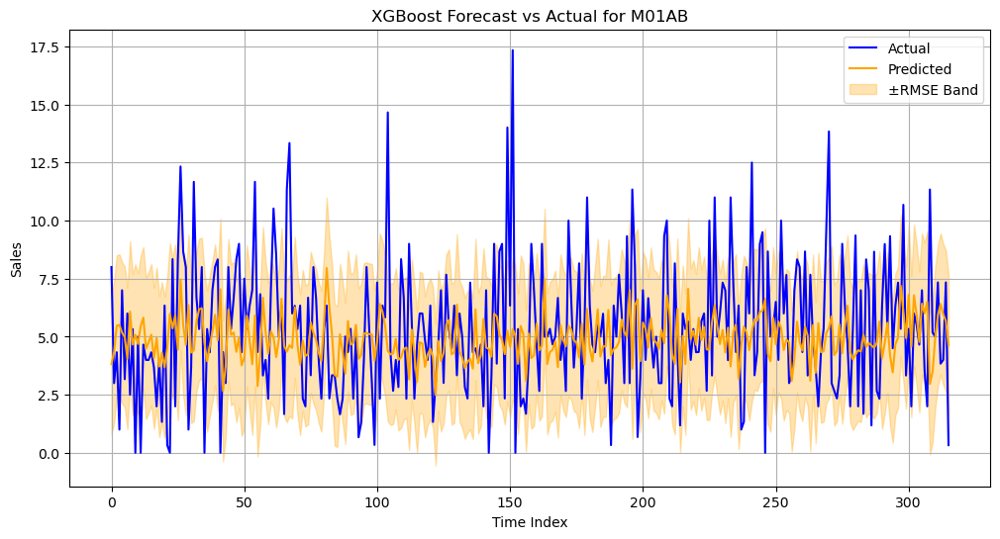


Training XGBoost model for M01AE...

M01AE — Test MSE: 5.09, RMSE: 2.26, R²: 0.08
Accuracy for M01AE: 0.08


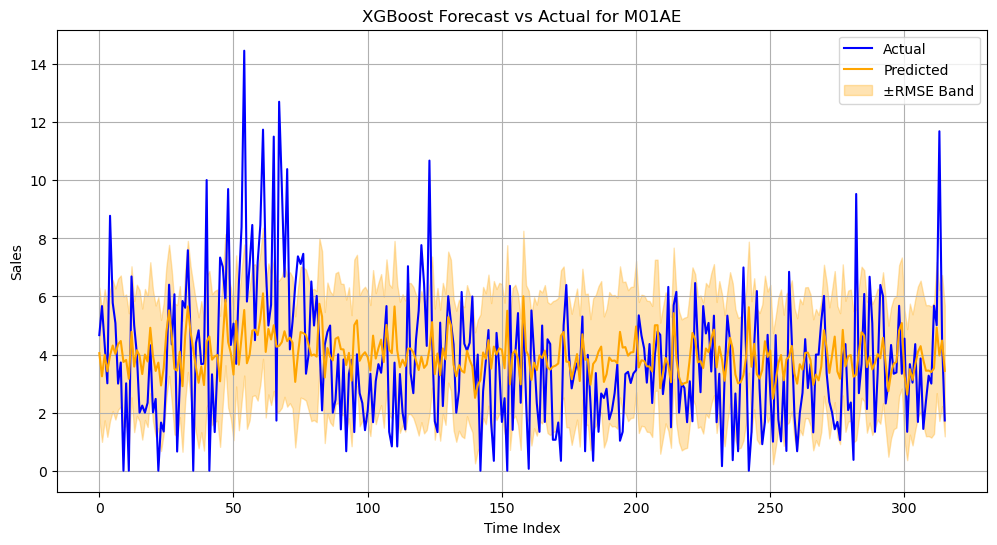


Training XGBoost model for N02BA...

N02BA — Test MSE: 5.30, RMSE: 2.30, R²: -0.37
Accuracy for N02BA: -0.37


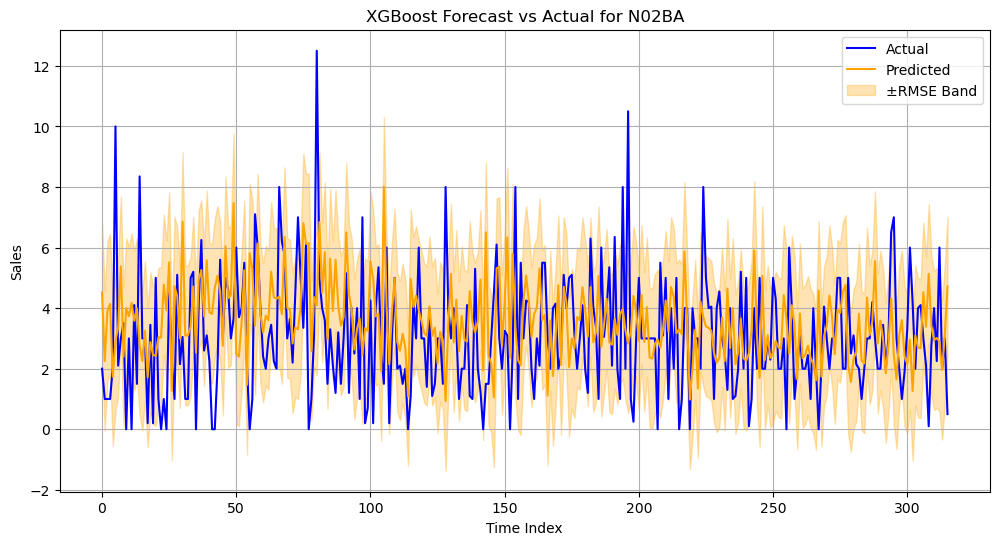


Training XGBoost model for N02BE...

N02BE — Test MSE: 209.96, RMSE: 14.49, R²: 0.25
Accuracy for N02BE: 0.25


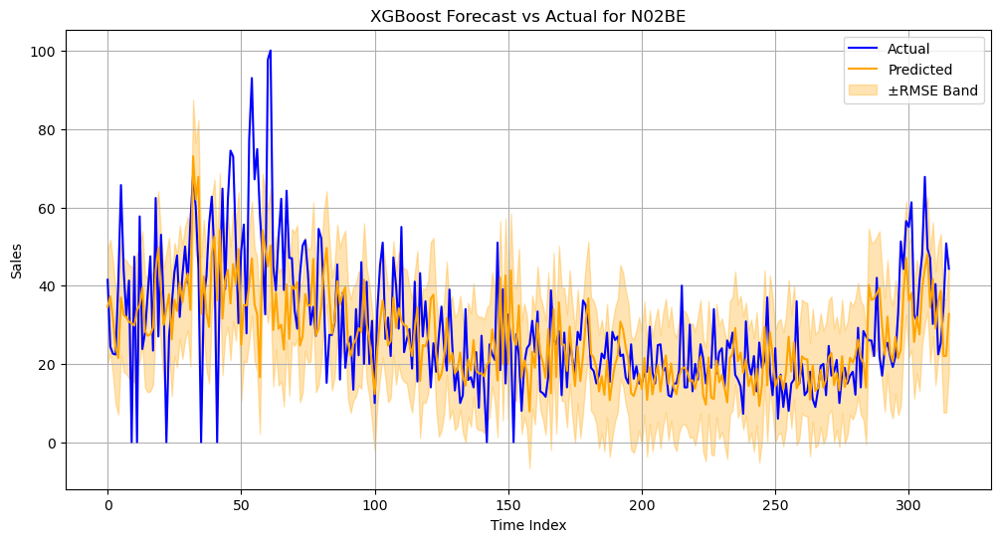


Training XGBoost model for N05B...

N05B — Test MSE: 23.93, RMSE: 4.89, R²: -0.29
Accuracy for N05B: -0.29


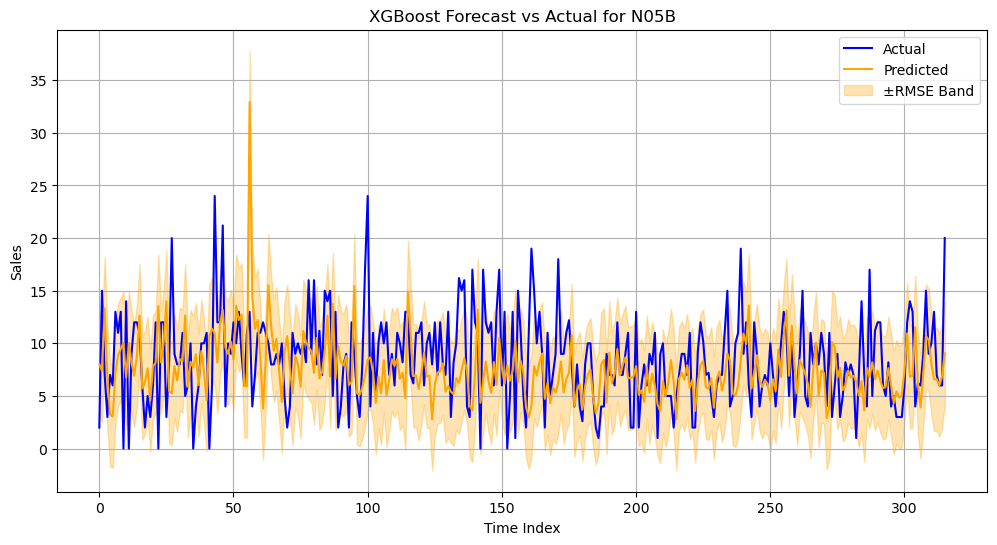


Training XGBoost model for N05C...

N05C — Test MSE: 1.44, RMSE: 1.20, R²: -0.12
Accuracy for N05C: -0.12


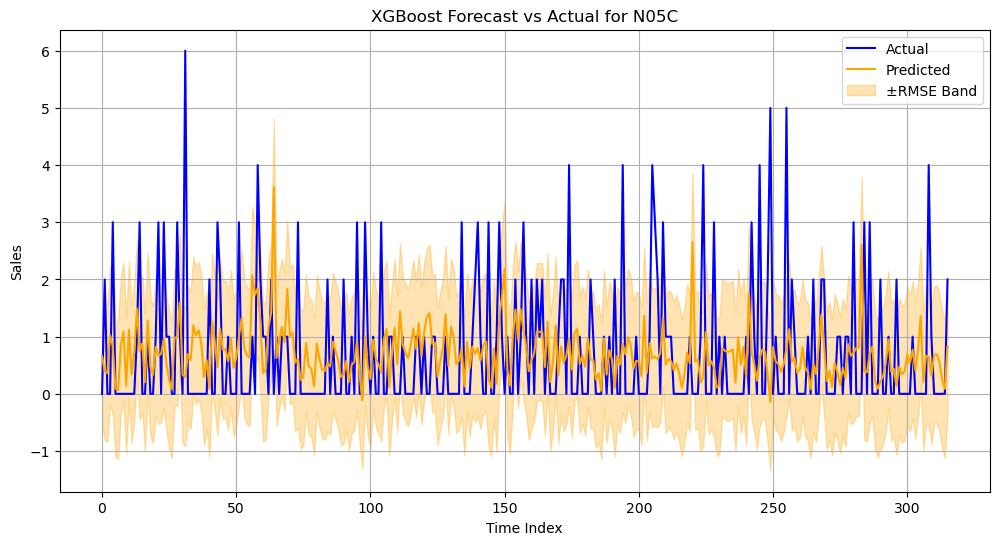


Training XGBoost model for R03...

R03 — Test MSE: 67.30, RMSE: 8.20, R²: -0.02
Accuracy for R03: -0.02


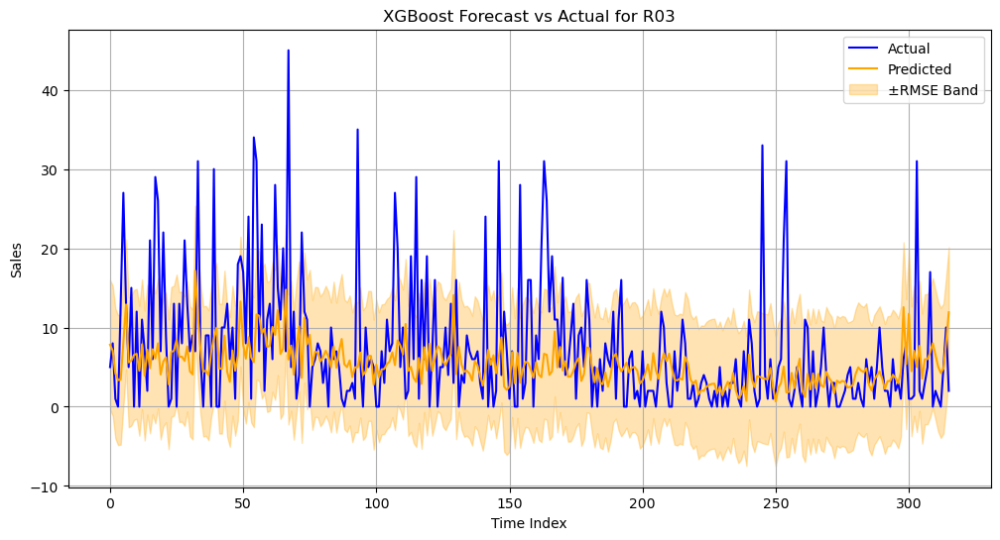


Training XGBoost model for R06...

R06 — Test MSE: 6.57, RMSE: 2.56, R²: 0.08
Accuracy for R06: 0.08


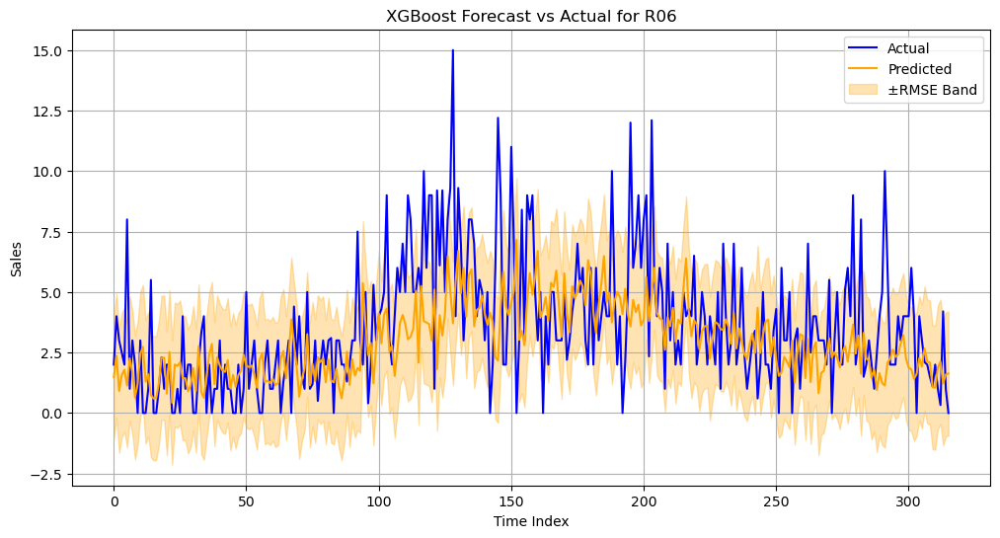

In [33]:
from sklearn.model_selection import train_test_split
from statsmodels.tsa.arima.model import ARIMA
import warnings

# Suppress ARIMA warnings
warnings.filterwarnings("ignore")

# Helper function to generate float ranges
def frange(start, stop, step):
    while start < stop:
        yield round(start, 3)
        start += step

xgb_params = {
    drug: {
        'n_estimators': optimal_n_estimators[drug],
        'max_depth': optimal_max_depth[drug],
        'learning_rate': optimal_learning_rate[drug],
        'subsample': optimal_subsample_rate[drug],
        'colsample_bytree': 1.0,
        'gamma': 0,
        'reg_alpha': 0,
        'reg_lambda': 1
    } for drug in drug_columns
}

# Initialize final models dictionary
final_models = {}

for drug in drug_columns:
    print(f"\nTraining XGBoost model for {drug}...")
    final_model = xgb.XGBRegressor(
        objective='reg:squarederror',
        random_state=42,
        **xgb_params[drug]
    )

    X_train = data_splits[drug]['X_train']
    y_train = data_splits[drug]['y_train']
    X_test = data_splits[drug]['X_test']
    y_test = data_splits[drug]['y_test']

    final_model.fit(X_train, y_train)
    final_models[drug] = final_model

    y_pred = final_model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)
    accuracy = final_model.score(X_test, y_test)

    print(f"\n{drug} — Test MSE: {mse:.2f}, RMSE: {rmse:.2f}, R²: {r2:.2f}")
    print(f"Accuracy for {drug}: {accuracy:.2f}")

    plt.figure(figsize=(12, 6))
    plt.plot(y_test.values, label='Actual', color='blue')
    plt.plot(y_pred, label='Predicted', color='orange')
    plt.fill_between(range(len(y_pred)), y_pred - rmse, y_pred + rmse, color='orange', alpha=0.3, label='±RMSE Band')
    plt.title(f'XGBoost Forecast vs Actual for {drug}')
    plt.xlabel('Time Index')
    plt.ylabel('Sales')
    plt.legend()
    plt.grid(True)
    plt.show()



Training XGBoost model with GridSearch for M01AB...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

M01AB — Test MSE: 8.59, RMSE: 2.93, R²: -0.02


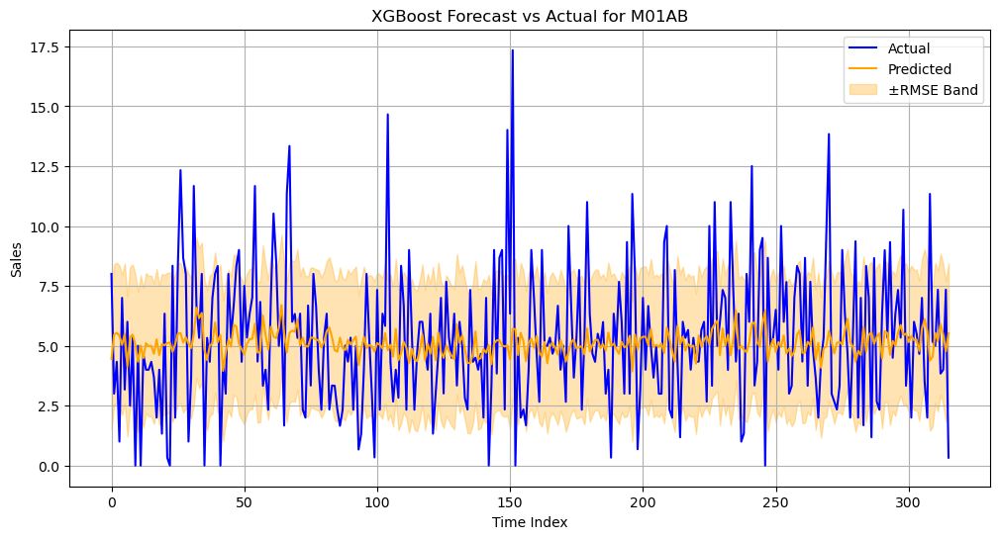


Training XGBoost model with GridSearch for M01AE...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

M01AE — Test MSE: 5.23, RMSE: 2.29, R²: 0.05


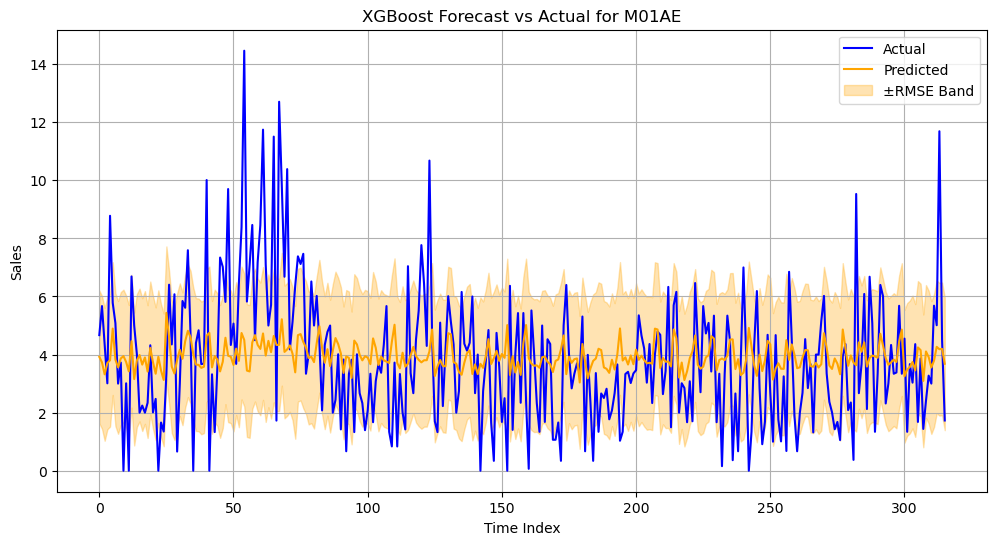


Training XGBoost model with GridSearch for N02BA...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

N02BA — Test MSE: 4.29, RMSE: 2.07, R²: -0.11


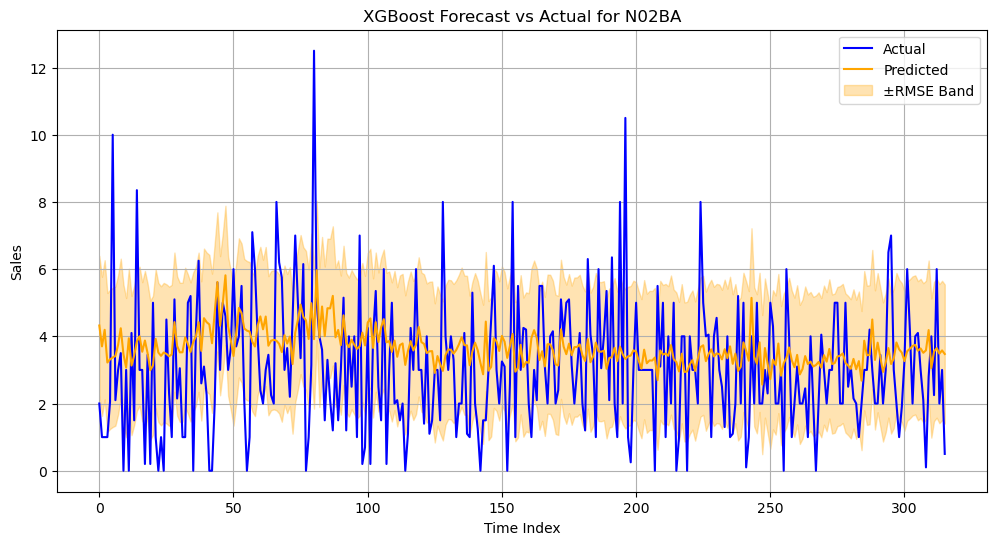


Training XGBoost model with GridSearch for N02BE...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

N02BE — Test MSE: 183.29, RMSE: 13.54, R²: 0.34


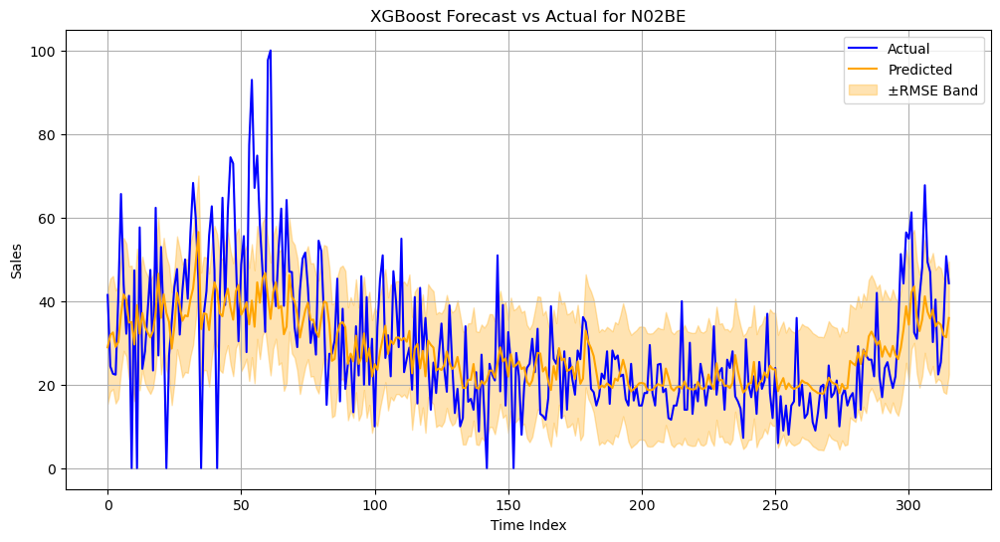


Training XGBoost model with GridSearch for N05B...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

N05B — Test MSE: 19.86, RMSE: 4.46, R²: -0.07


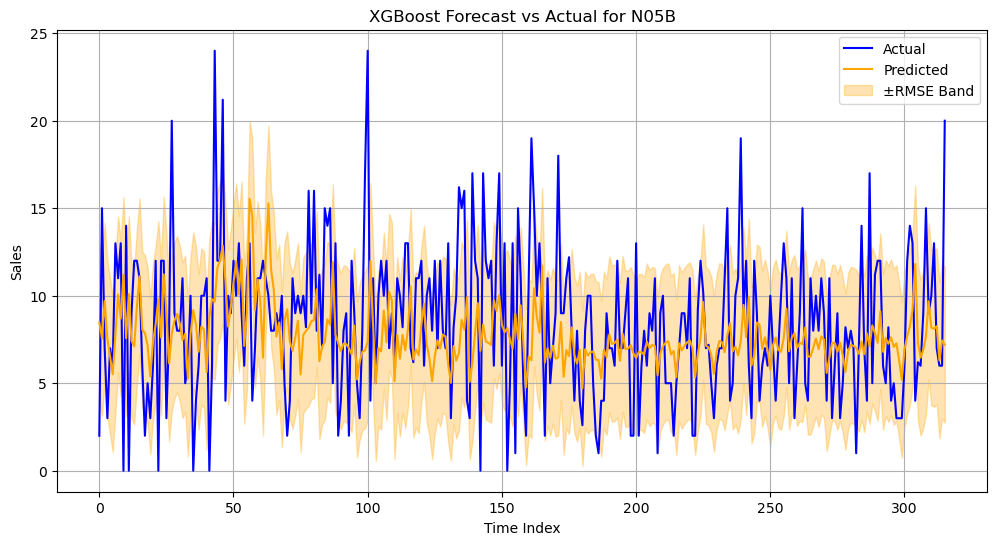


Training XGBoost model with GridSearch for N05C...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

N05C — Test MSE: 1.33, RMSE: 1.15, R²: -0.03


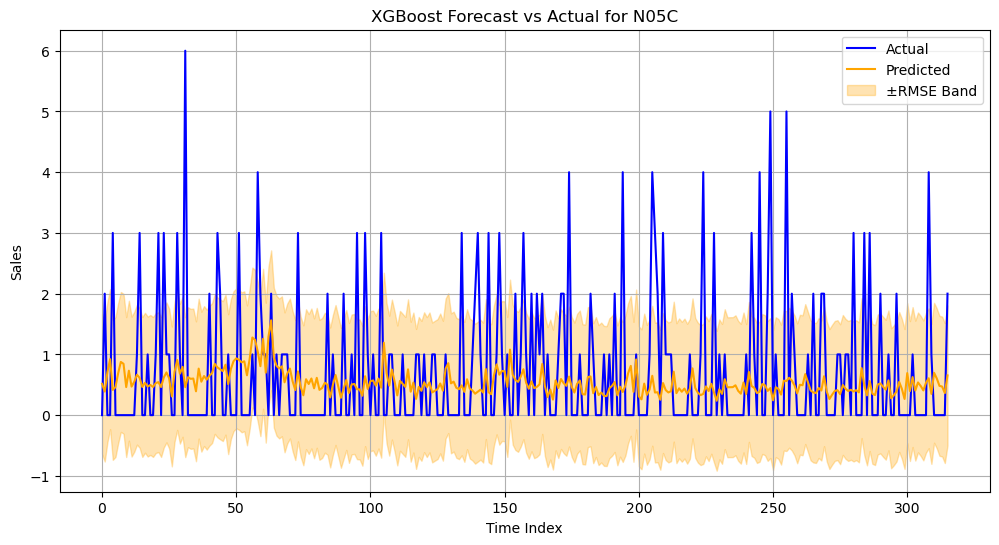


Training XGBoost model with GridSearch for R03...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

R03 — Test MSE: 67.55, RMSE: 8.22, R²: -0.03


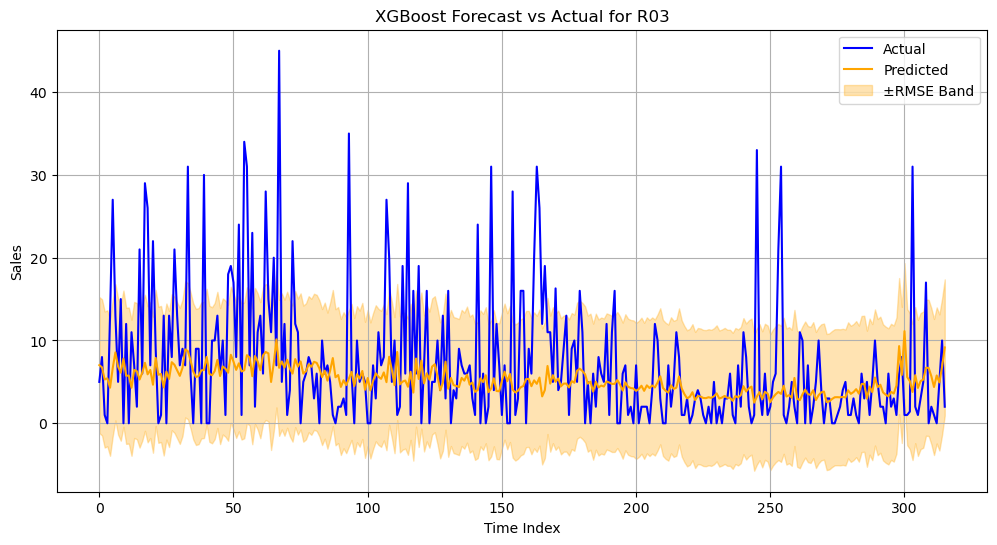


Training XGBoost model with GridSearch for R06...
Fitting 3 folds for each of 1944 candidates, totalling 5832 fits

R06 — Test MSE: 6.00, RMSE: 2.45, R²: 0.16


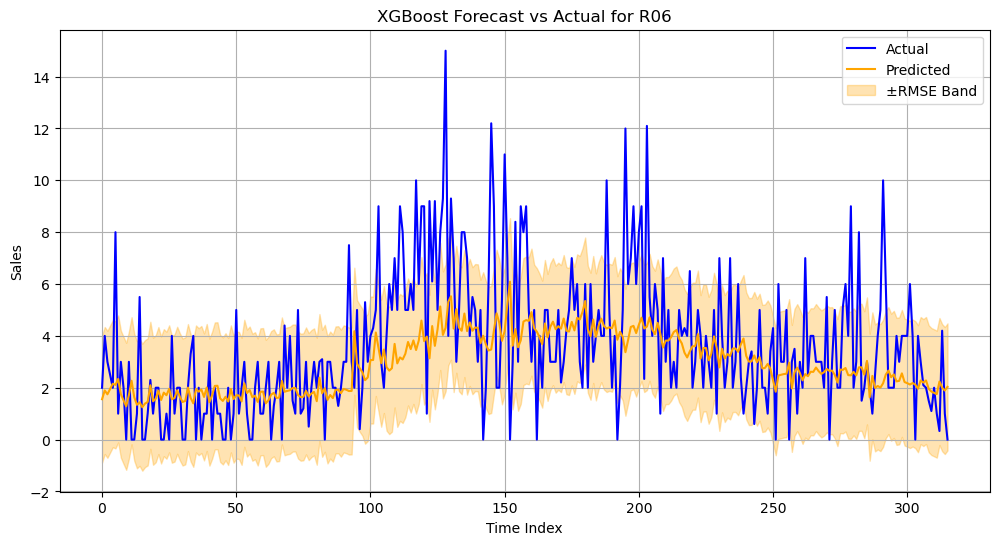

In [34]:
from sklearn.model_selection import train_test_split, GridSearchCV
from statsmodels.tsa.arima.model import ARIMA
import warnings

# Suppress ARIMA warnings
warnings.filterwarnings("ignore")

final_models = {}

for drug in drug_columns:
    print(f"\nTraining XGBoost model with GridSearch for {drug}...")

    xgb_param_grid = {
        'n_estimators': [50, 100, 150],
        'max_depth': [4, 6, 8],
        'learning_rate': [0.05, 0.1, 0.2],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.7, 0.8, 0.9],
        'gamma': [0, 0.2],
        'reg_alpha': [0, 0.2],
        'reg_lambda': [0.6, 1.0]
    }

    model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)

    X_train = data_splits[drug]['X_train']
    y_train = data_splits[drug]['y_train']
    X_test = data_splits[drug]['X_test']
    y_test = data_splits[drug]['y_test']

    grid_search = GridSearchCV(
        model,
        param_grid=xgb_param_grid,
        cv=3,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)
    final_model = grid_search.best_estimator_
    final_models[drug] = final_model

    y_pred = final_model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    r2 = r2_score(y_test, y_pred)

    print(f"\n{drug} — Test MSE: {mse:.2f}, RMSE: {rmse:.2f}, R²: {r2:.2f}")

    plt.figure(figsize=(12, 6))
    plt.plot(y_test.values, label='Actual', color='blue')
    plt.plot(y_pred, label='Predicted', color='orange')
    plt.fill_between(range(len(y_pred)), y_pred - rmse, y_pred + rmse, color='orange', alpha=0.3, label='±RMSE Band')
    plt.title(f'XGBoost Forecast vs Actual for {drug}')
    plt.xlabel('Time Index')
    plt.ylabel('Sales')
    plt.legend()
    plt.grid(True)
    plt.show()


In [35]:
# Epochs defined per drug
#optimal_epochs = {
 #   'M01AB': 276,
  #  'M01AE': 323,
   # 'N02BA': 303,
    #'N02BE': 398,
    #'N05B': 399,
   # 'N05C': 370,
   # 'R03': 195,
   # 'R06': 169
#}
# Epochs defined per drug
optimal_epochs = {
    'M01AB': 3,
    'M01AE': 19,
    'N02BA': 125,
    'N02BE': 17,
    'N05B': 33,
    'N05C': 95,
    'R03': 89,
    'R06': 92
}


             M01AB        M01AE        N02BA        N02BE         N05B  \
count  2103.000000  2103.000000  2103.000000  2103.000000  2103.000000   
mean      5.036109     3.897265     3.879177    29.890895     8.850565   
std       2.735765     2.133916     2.384976    15.579887     5.607235   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       3.000000     2.340000     2.000000    19.000000     5.000000   
50%       4.990000     3.670000     3.500000    26.800000     8.000000   
75%       6.670000     5.140000     5.200000    38.300000    12.000000   
max      17.340000    14.463000    16.000000   161.000000    54.833333   

              N05C          R03          R06         Year        Month  ...  \
count  2103.000000  2103.000000  2103.000000  2103.000000  2103.000000  ...   
mean      0.594369     5.506335     2.901007  2016.404660     6.351878  ...   
std       1.093538     6.423979     2.416985     1.663773     3.383343  ...   
min       0.00000

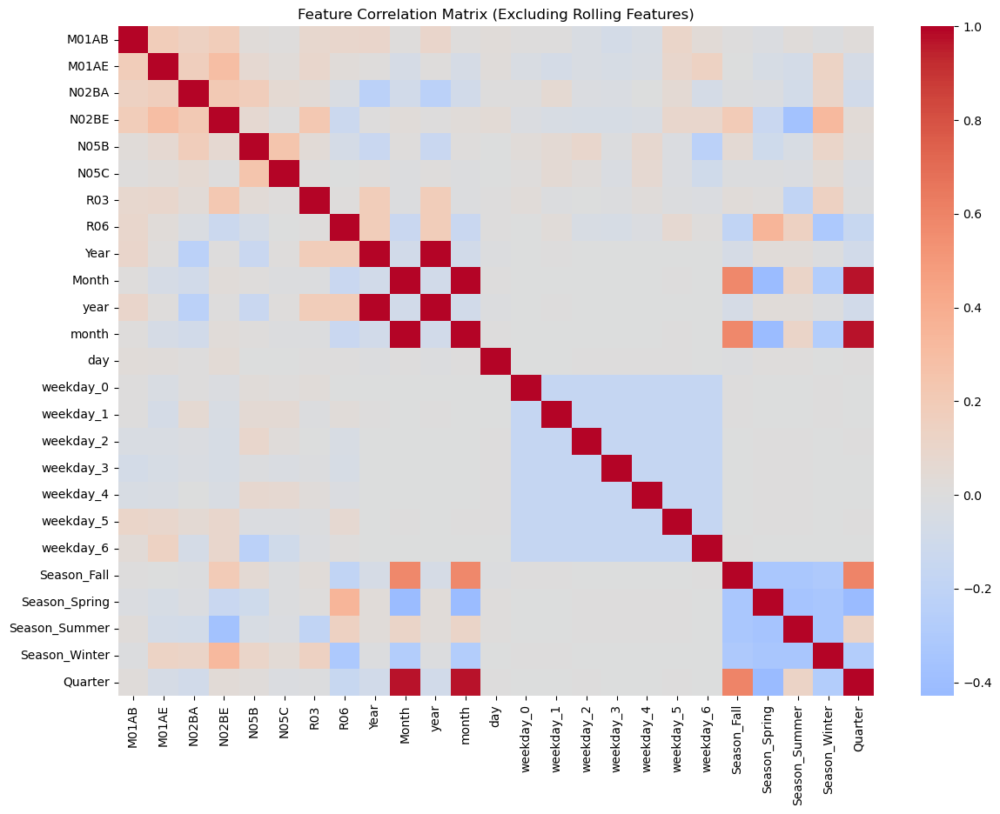

Epoch 1, M01AB Train Loss: 0.0409, Val Loss: 0.0250
Epoch 2, M01AB Train Loss: 0.0286, Val Loss: 0.0281
Epoch 3, M01AB Train Loss: 0.0279, Val Loss: 0.0256


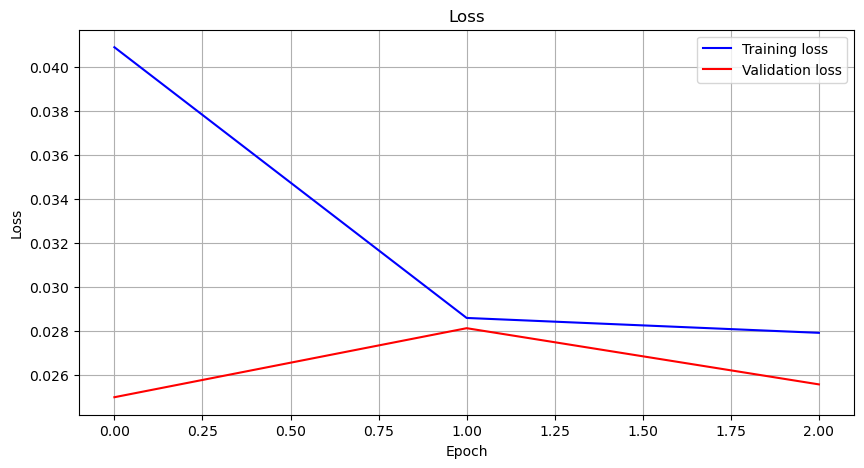

M01AB RMSE: 2.9297
M01AB R² Score: -0.0184
M01AB MAE: 2.3172
M01AB MAPE: inf%


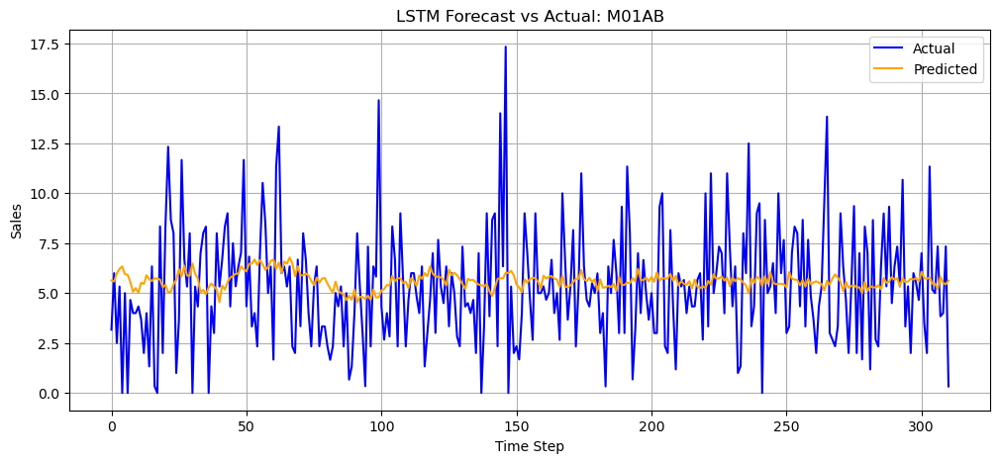

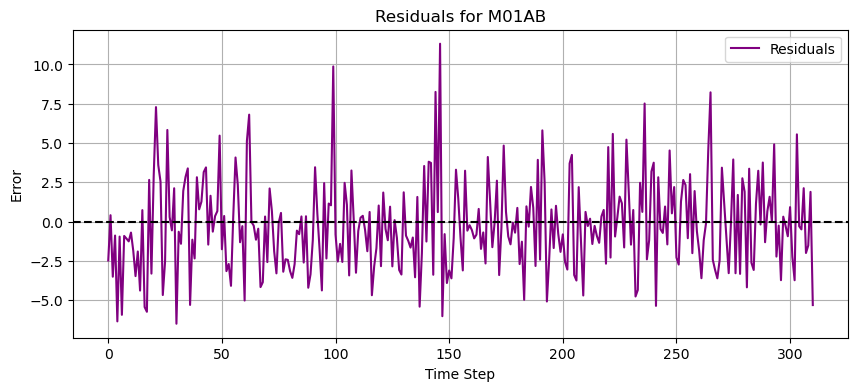

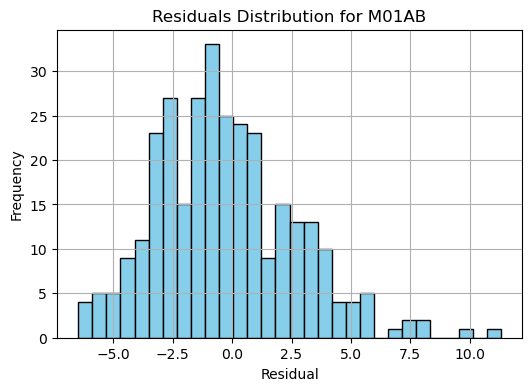

Epoch 1, M01AE Train Loss: 0.0230, Val Loss: 0.0203
Epoch 2, M01AE Train Loss: 0.0223, Val Loss: 0.0188
Epoch 3, M01AE Train Loss: 0.0233, Val Loss: 0.0196
Epoch 4, M01AE Train Loss: 0.0227, Val Loss: 0.0187
Epoch 5, M01AE Train Loss: 0.0211, Val Loss: 0.0186
Epoch 6, M01AE Train Loss: 0.0210, Val Loss: 0.0187
Epoch 7, M01AE Train Loss: 0.0210, Val Loss: 0.0187
Epoch 8, M01AE Train Loss: 0.0210, Val Loss: 0.0187
Epoch 9, M01AE Train Loss: 0.0209, Val Loss: 0.0187
Epoch 10, M01AE Train Loss: 0.0209, Val Loss: 0.0186
Epoch 11, M01AE Train Loss: 0.0208, Val Loss: 0.0186
Epoch 12, M01AE Train Loss: 0.0208, Val Loss: 0.0186
Epoch 13, M01AE Train Loss: 0.0207, Val Loss: 0.0186
Epoch 14, M01AE Train Loss: 0.0207, Val Loss: 0.0186
Epoch 15, M01AE Train Loss: 0.0206, Val Loss: 0.0185
Epoch 16, M01AE Train Loss: 0.0205, Val Loss: 0.0185
Epoch 17, M01AE Train Loss: 0.0204, Val Loss: 0.0185
Epoch 18, M01AE Train Loss: 0.0203, Val Loss: 0.0185
Epoch 19, M01AE Train Loss: 0.0201, Val Loss: 0.0187


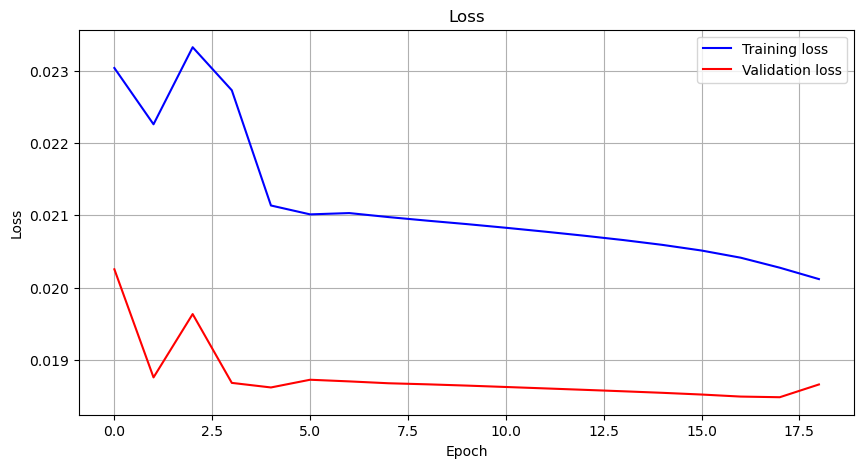

M01AE RMSE: 2.1394
M01AE R² Score: 0.1702
M01AE MAE: 1.6105
M01AE MAPE: inf%


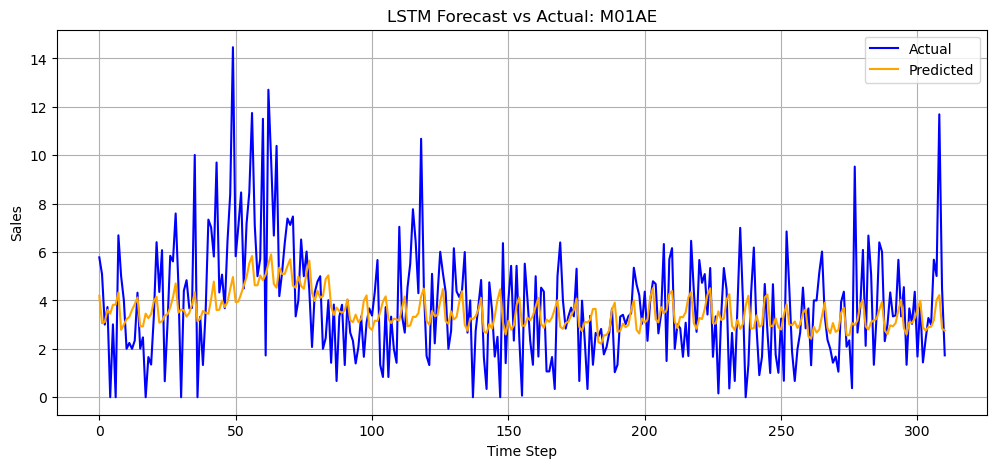

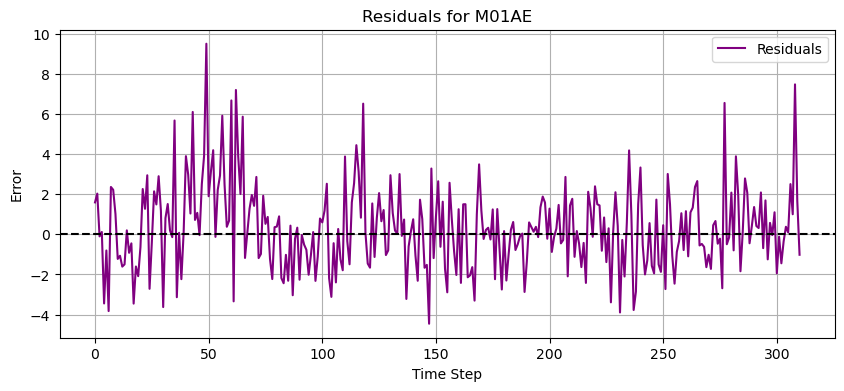

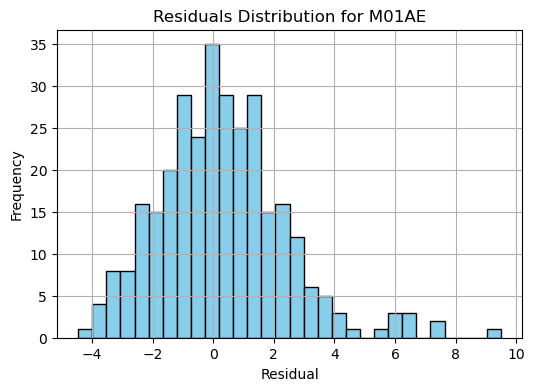

Epoch 1, N02BA Train Loss: 0.0278, Val Loss: 0.0170
Epoch 2, N02BA Train Loss: 0.0241, Val Loss: 0.0180
Epoch 3, N02BA Train Loss: 0.0232, Val Loss: 0.0185
Epoch 4, N02BA Train Loss: 0.0227, Val Loss: 0.0180
Epoch 5, N02BA Train Loss: 0.0220, Val Loss: 0.0177
Epoch 6, N02BA Train Loss: 0.0217, Val Loss: 0.0177
Epoch 7, N02BA Train Loss: 0.0217, Val Loss: 0.0177
Epoch 8, N02BA Train Loss: 0.0217, Val Loss: 0.0178
Epoch 9, N02BA Train Loss: 0.0217, Val Loss: 0.0178
Epoch 10, N02BA Train Loss: 0.0216, Val Loss: 0.0177
Epoch 11, N02BA Train Loss: 0.0214, Val Loss: 0.0176
Epoch 12, N02BA Train Loss: 0.0213, Val Loss: 0.0176
Epoch 13, N02BA Train Loss: 0.0212, Val Loss: 0.0176
Epoch 14, N02BA Train Loss: 0.0212, Val Loss: 0.0176
Epoch 15, N02BA Train Loss: 0.0211, Val Loss: 0.0176
Epoch 16, N02BA Train Loss: 0.0210, Val Loss: 0.0176
Epoch 17, N02BA Train Loss: 0.0209, Val Loss: 0.0176
Epoch 18, N02BA Train Loss: 0.0208, Val Loss: 0.0176
Epoch 19, N02BA Train Loss: 0.0207, Val Loss: 0.0176
Ep

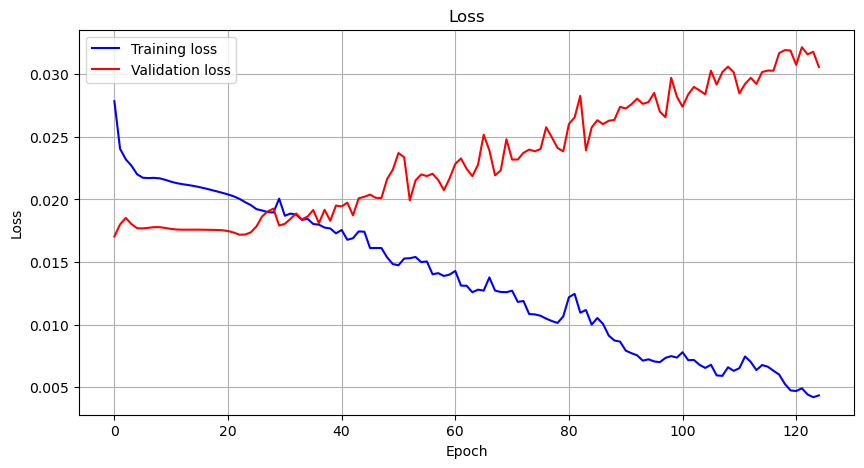

N02BA RMSE: 2.7144
N02BA R² Score: -0.8971
N02BA MAE: 2.1254
N02BA MAPE: inf%


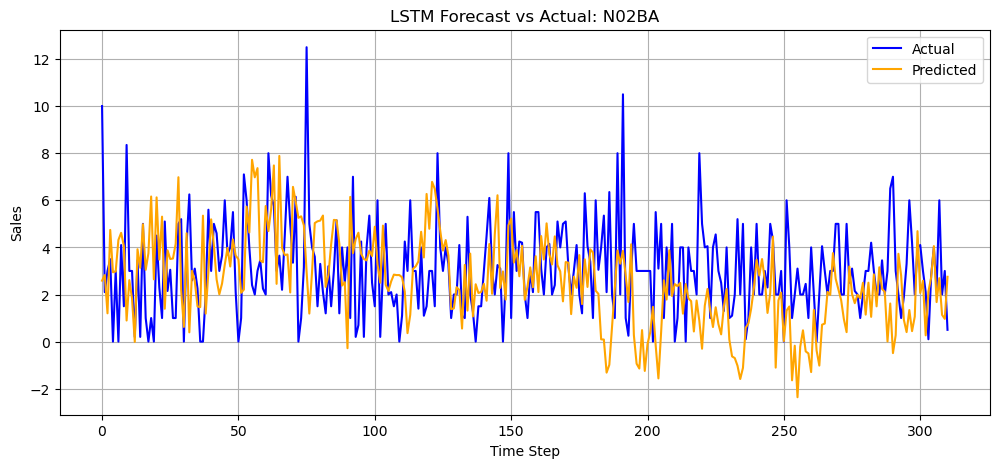

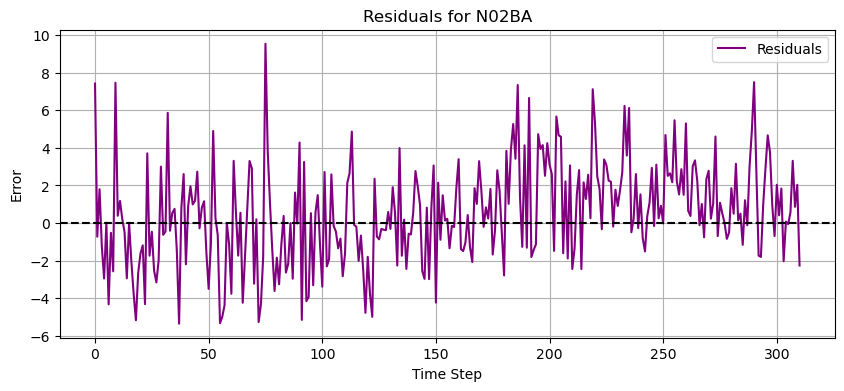

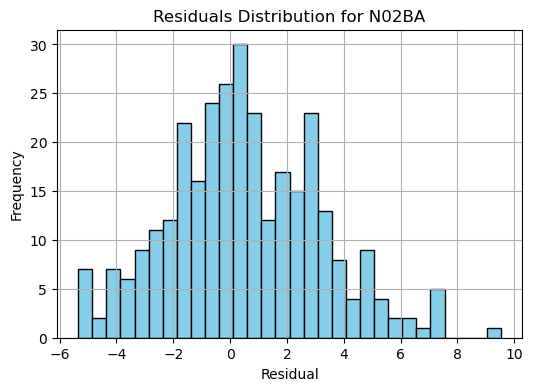

Epoch 1, N02BE Train Loss: 0.0094, Val Loss: 0.0059
Epoch 2, N02BE Train Loss: 0.0084, Val Loss: 0.0059
Epoch 3, N02BE Train Loss: 0.0099, Val Loss: 0.0050
Epoch 4, N02BE Train Loss: 0.0105, Val Loss: 0.0049
Epoch 5, N02BE Train Loss: 0.0087, Val Loss: 0.0047
Epoch 6, N02BE Train Loss: 0.0075, Val Loss: 0.0046
Epoch 7, N02BE Train Loss: 0.0075, Val Loss: 0.0047
Epoch 8, N02BE Train Loss: 0.0075, Val Loss: 0.0047
Epoch 9, N02BE Train Loss: 0.0075, Val Loss: 0.0047
Epoch 10, N02BE Train Loss: 0.0074, Val Loss: 0.0047
Epoch 11, N02BE Train Loss: 0.0074, Val Loss: 0.0047
Epoch 12, N02BE Train Loss: 0.0073, Val Loss: 0.0047
Epoch 13, N02BE Train Loss: 0.0073, Val Loss: 0.0047
Epoch 14, N02BE Train Loss: 0.0072, Val Loss: 0.0048
Epoch 15, N02BE Train Loss: 0.0071, Val Loss: 0.0048
Epoch 16, N02BE Train Loss: 0.0071, Val Loss: 0.0048
Epoch 17, N02BE Train Loss: 0.0070, Val Loss: 0.0049


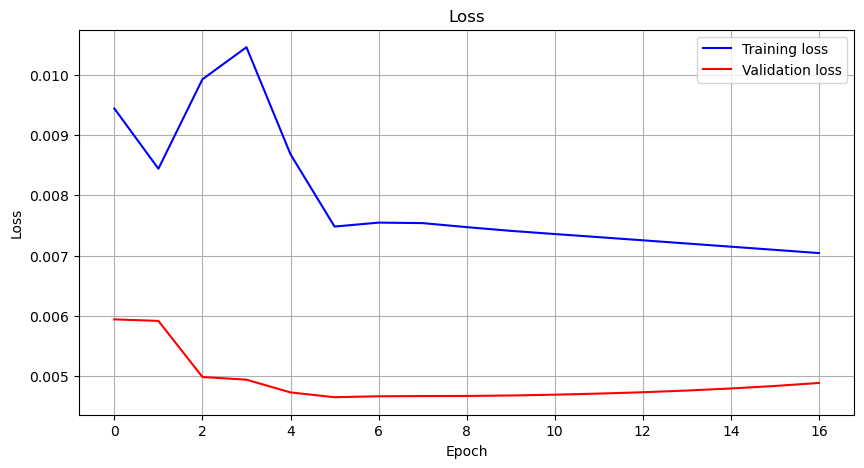

N02BE RMSE: 13.0845
N02BE R² Score: 0.3915
N02BE MAE: 9.5153
N02BE MAPE: inf%


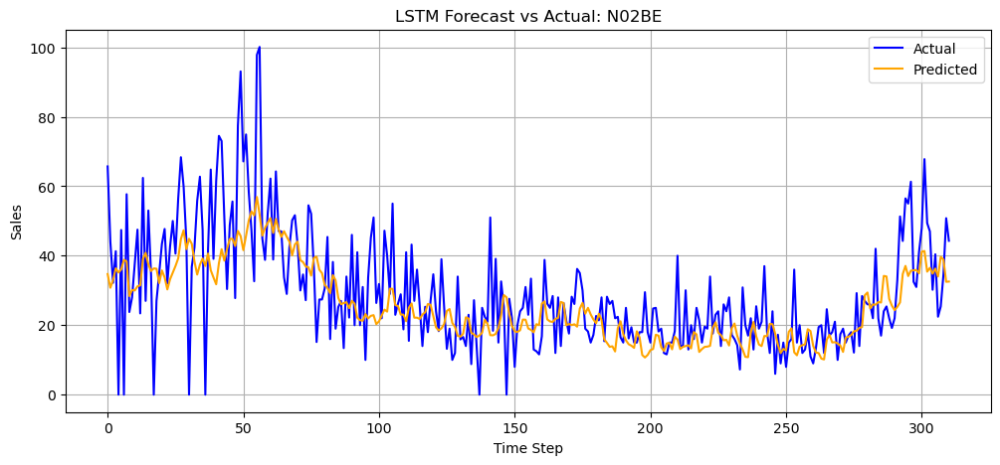

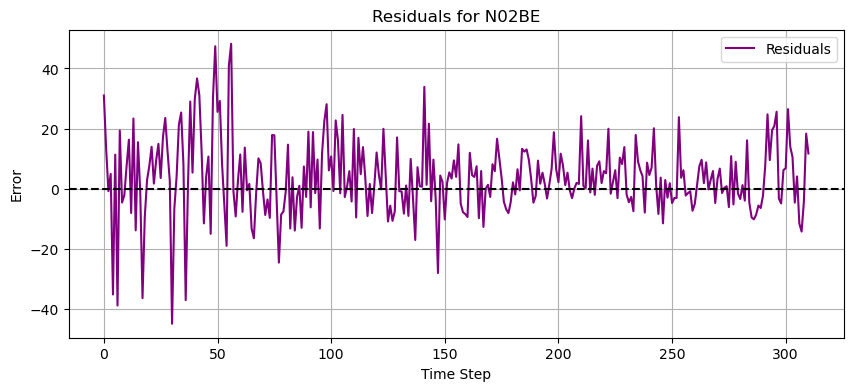

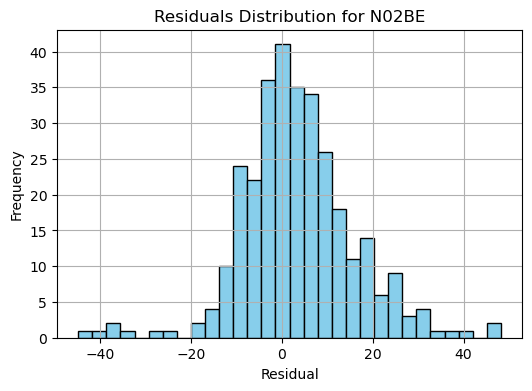

Epoch 1, N05B Train Loss: 0.0173, Val Loss: 0.0184
Epoch 2, N05B Train Loss: 0.0119, Val Loss: 0.0115
Epoch 3, N05B Train Loss: 0.0107, Val Loss: 0.0117
Epoch 4, N05B Train Loss: 0.0103, Val Loss: 0.0123
Epoch 5, N05B Train Loss: 0.0102, Val Loss: 0.0121
Epoch 6, N05B Train Loss: 0.0101, Val Loss: 0.0117
Epoch 7, N05B Train Loss: 0.0100, Val Loss: 0.0114
Epoch 8, N05B Train Loss: 0.0099, Val Loss: 0.0111
Epoch 9, N05B Train Loss: 0.0098, Val Loss: 0.0108
Epoch 10, N05B Train Loss: 0.0097, Val Loss: 0.0105
Epoch 11, N05B Train Loss: 0.0097, Val Loss: 0.0102
Epoch 12, N05B Train Loss: 0.0096, Val Loss: 0.0100
Epoch 13, N05B Train Loss: 0.0095, Val Loss: 0.0097
Epoch 14, N05B Train Loss: 0.0095, Val Loss: 0.0095
Epoch 15, N05B Train Loss: 0.0094, Val Loss: 0.0094
Epoch 16, N05B Train Loss: 0.0093, Val Loss: 0.0092
Epoch 17, N05B Train Loss: 0.0093, Val Loss: 0.0091
Epoch 18, N05B Train Loss: 0.0092, Val Loss: 0.0091
Epoch 19, N05B Train Loss: 0.0092, Val Loss: 0.0090
Epoch 20, N05B Train 

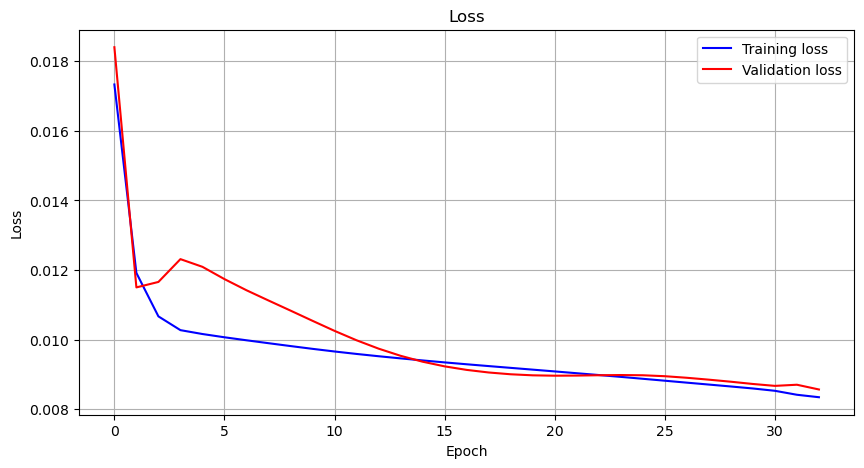

N05B RMSE: 4.4260
N05B R² Score: -0.0571
N05B MAE: 3.4303
N05B MAPE: inf%


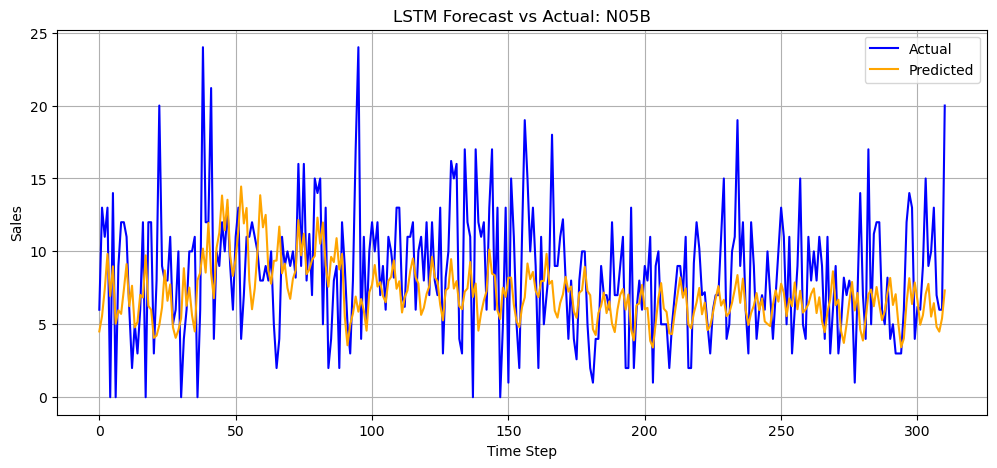

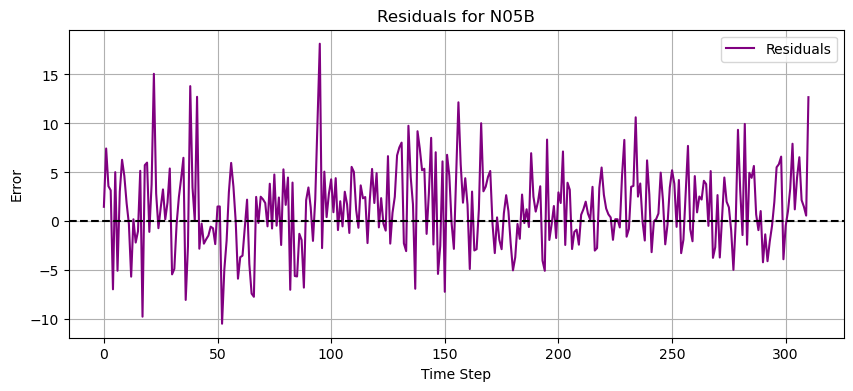

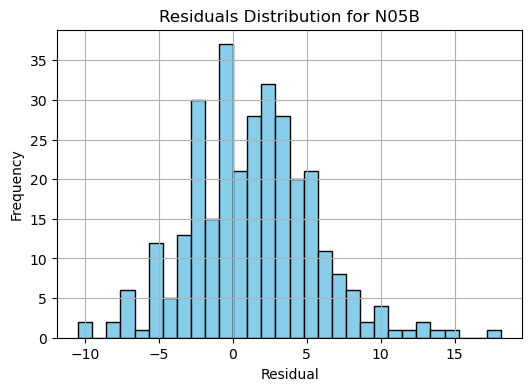

Epoch 1, N05C Train Loss: 0.0146, Val Loss: 0.0212
Epoch 2, N05C Train Loss: 0.0131, Val Loss: 0.0215
Epoch 3, N05C Train Loss: 0.0129, Val Loss: 0.0211
Epoch 4, N05C Train Loss: 0.0129, Val Loss: 0.0210
Epoch 5, N05C Train Loss: 0.0128, Val Loss: 0.0210
Epoch 6, N05C Train Loss: 0.0128, Val Loss: 0.0211
Epoch 7, N05C Train Loss: 0.0127, Val Loss: 0.0212
Epoch 8, N05C Train Loss: 0.0127, Val Loss: 0.0213
Epoch 9, N05C Train Loss: 0.0126, Val Loss: 0.0213
Epoch 10, N05C Train Loss: 0.0126, Val Loss: 0.0213
Epoch 11, N05C Train Loss: 0.0125, Val Loss: 0.0212
Epoch 12, N05C Train Loss: 0.0125, Val Loss: 0.0212
Epoch 13, N05C Train Loss: 0.0125, Val Loss: 0.0212
Epoch 14, N05C Train Loss: 0.0124, Val Loss: 0.0211
Epoch 15, N05C Train Loss: 0.0124, Val Loss: 0.0211
Epoch 16, N05C Train Loss: 0.0124, Val Loss: 0.0212
Epoch 17, N05C Train Loss: 0.0123, Val Loss: 0.0212
Epoch 18, N05C Train Loss: 0.0123, Val Loss: 0.0212
Epoch 19, N05C Train Loss: 0.0122, Val Loss: 0.0212
Epoch 20, N05C Train 

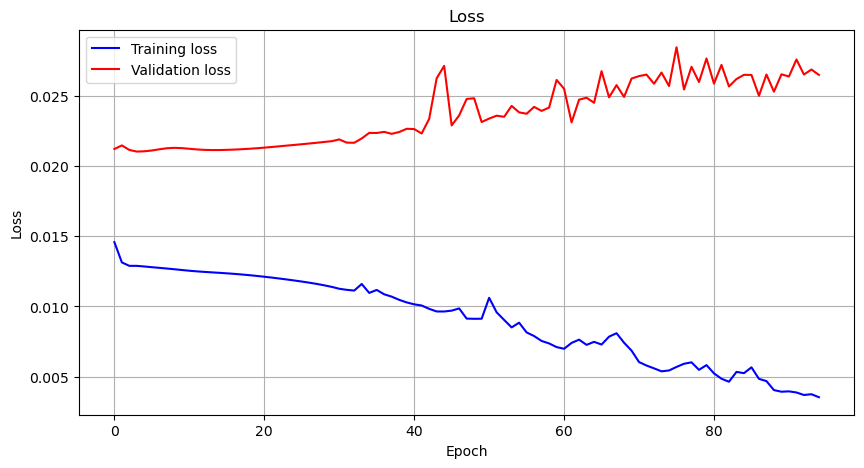

N05C RMSE: 1.5126
N05C R² Score: -0.7860
N05C MAE: 1.0953
N05C MAPE: inf%


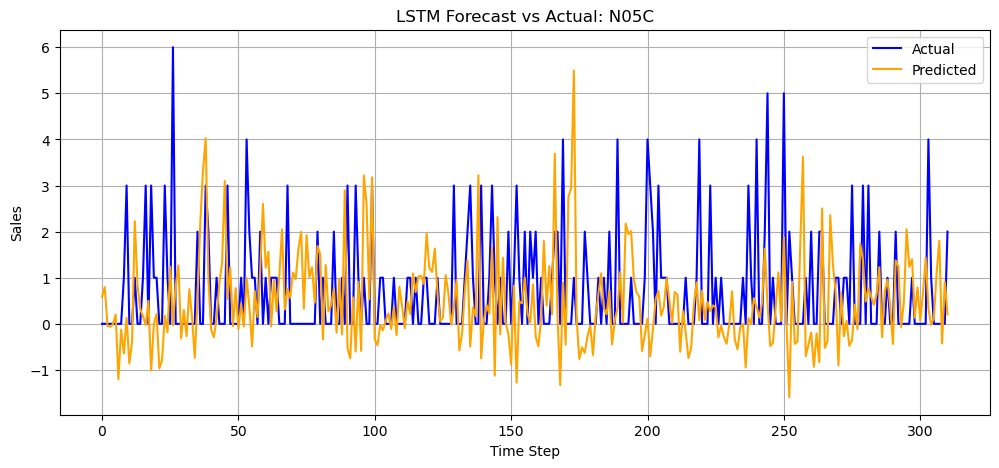

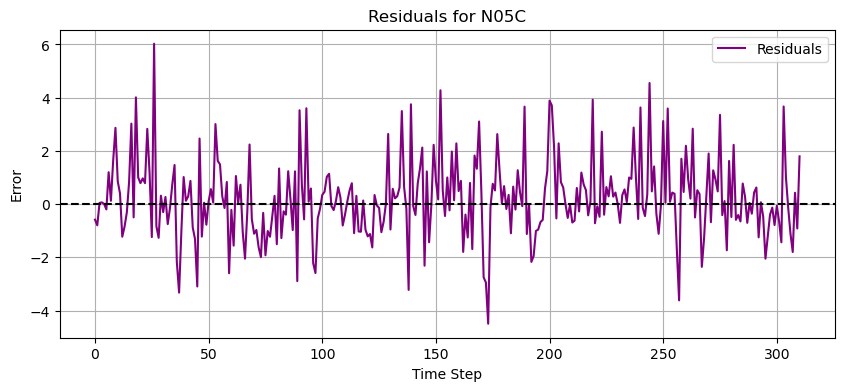

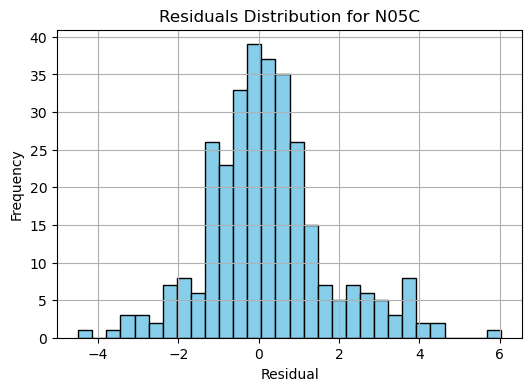

Epoch 1, R03 Train Loss: 0.0167, Val Loss: 0.0274
Epoch 2, R03 Train Loss: 0.0163, Val Loss: 0.0243
Epoch 3, R03 Train Loss: 0.0166, Val Loss: 0.0237
Epoch 4, R03 Train Loss: 0.0166, Val Loss: 0.0239
Epoch 5, R03 Train Loss: 0.0159, Val Loss: 0.0241
Epoch 6, R03 Train Loss: 0.0154, Val Loss: 0.0239
Epoch 7, R03 Train Loss: 0.0153, Val Loss: 0.0239
Epoch 8, R03 Train Loss: 0.0153, Val Loss: 0.0239
Epoch 9, R03 Train Loss: 0.0153, Val Loss: 0.0238
Epoch 10, R03 Train Loss: 0.0153, Val Loss: 0.0238
Epoch 11, R03 Train Loss: 0.0152, Val Loss: 0.0238
Epoch 12, R03 Train Loss: 0.0151, Val Loss: 0.0238
Epoch 13, R03 Train Loss: 0.0151, Val Loss: 0.0239
Epoch 14, R03 Train Loss: 0.0150, Val Loss: 0.0240
Epoch 15, R03 Train Loss: 0.0149, Val Loss: 0.0241
Epoch 16, R03 Train Loss: 0.0148, Val Loss: 0.0242
Epoch 17, R03 Train Loss: 0.0147, Val Loss: 0.0242
Epoch 18, R03 Train Loss: 0.0146, Val Loss: 0.0242
Epoch 19, R03 Train Loss: 0.0145, Val Loss: 0.0242
Epoch 20, R03 Train Loss: 0.0144, Val Lo

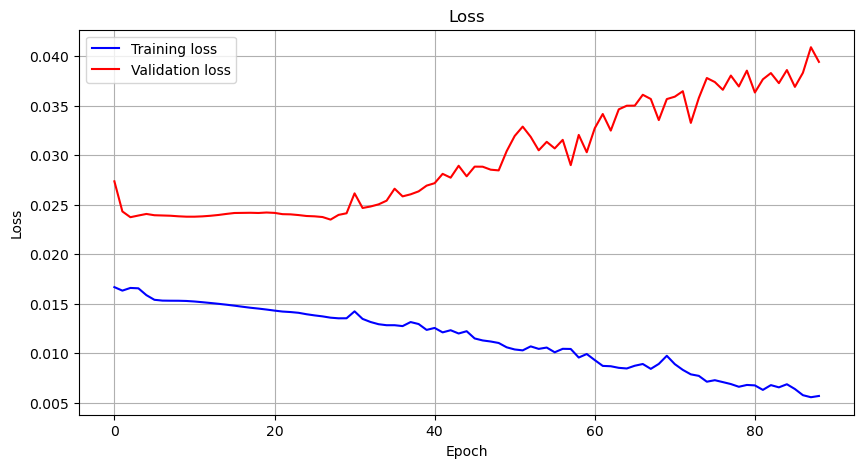

R03 RMSE: 9.2097
R03 R² Score: -0.2785
R03 MAE: 6.5929
R03 MAPE: inf%


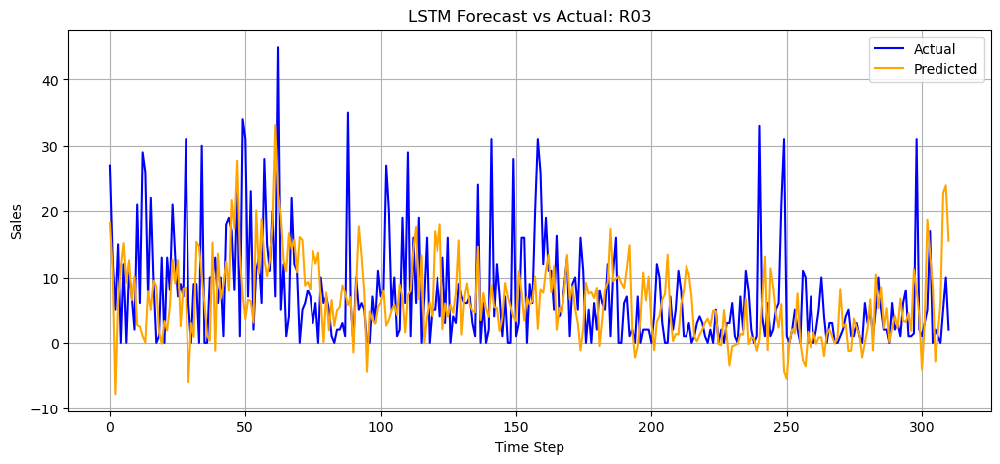

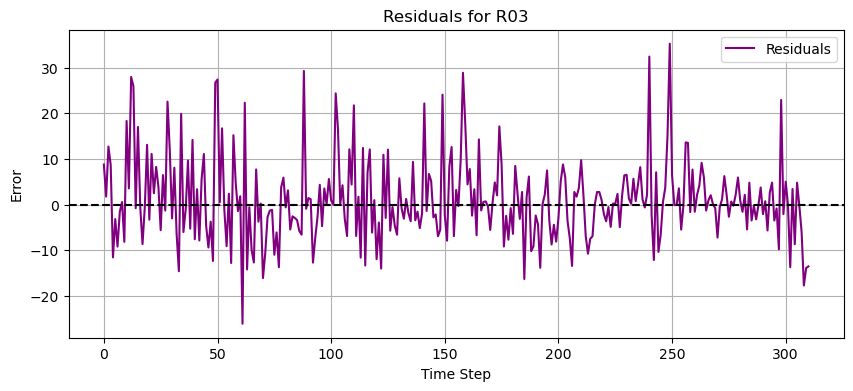

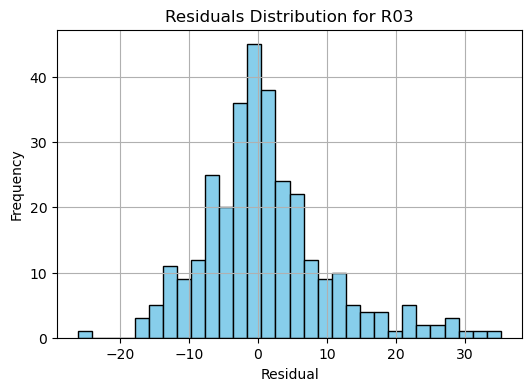

Epoch 1, R06 Train Loss: 0.0288, Val Loss: 0.0360
Epoch 2, R06 Train Loss: 0.0181, Val Loss: 0.0253
Epoch 3, R06 Train Loss: 0.0176, Val Loss: 0.0241
Epoch 4, R06 Train Loss: 0.0177, Val Loss: 0.0238
Epoch 5, R06 Train Loss: 0.0175, Val Loss: 0.0235
Epoch 6, R06 Train Loss: 0.0173, Val Loss: 0.0233
Epoch 7, R06 Train Loss: 0.0171, Val Loss: 0.0232
Epoch 8, R06 Train Loss: 0.0168, Val Loss: 0.0230
Epoch 9, R06 Train Loss: 0.0166, Val Loss: 0.0229
Epoch 10, R06 Train Loss: 0.0163, Val Loss: 0.0229
Epoch 11, R06 Train Loss: 0.0161, Val Loss: 0.0232
Epoch 12, R06 Train Loss: 0.0158, Val Loss: 0.0232
Epoch 13, R06 Train Loss: 0.0156, Val Loss: 0.0232
Epoch 14, R06 Train Loss: 0.0155, Val Loss: 0.0232
Epoch 15, R06 Train Loss: 0.0153, Val Loss: 0.0233
Epoch 16, R06 Train Loss: 0.0152, Val Loss: 0.0233
Epoch 17, R06 Train Loss: 0.0151, Val Loss: 0.0235
Epoch 18, R06 Train Loss: 0.0150, Val Loss: 0.0238
Epoch 19, R06 Train Loss: 0.0149, Val Loss: 0.0247
Epoch 20, R06 Train Loss: 0.0149, Val Lo

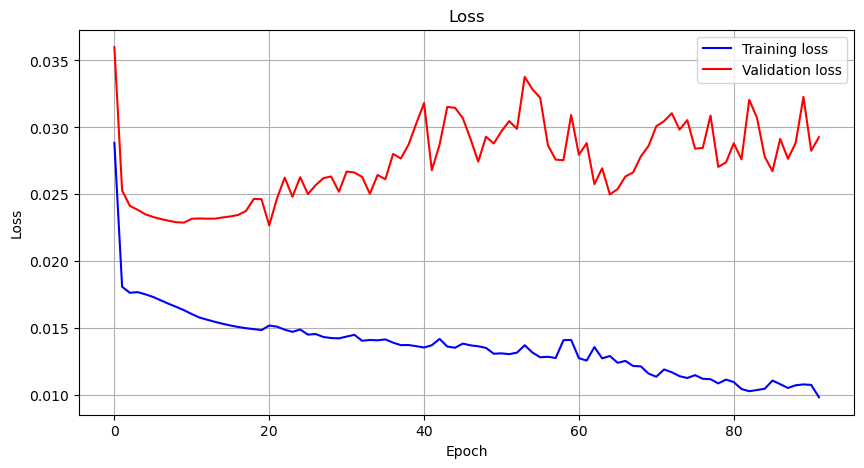

R06 RMSE: 2.6083
R06 R² Score: 0.0597
R06 MAE: 1.9778
R06 MAPE: inf%


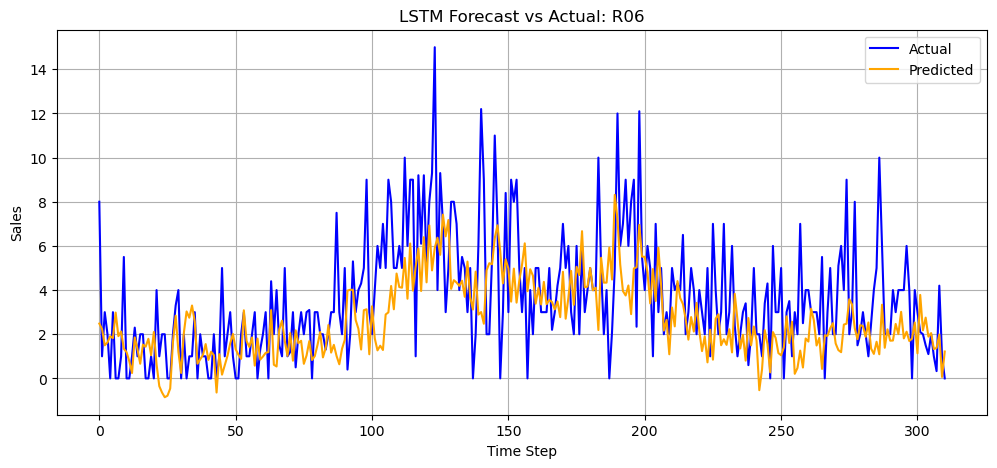

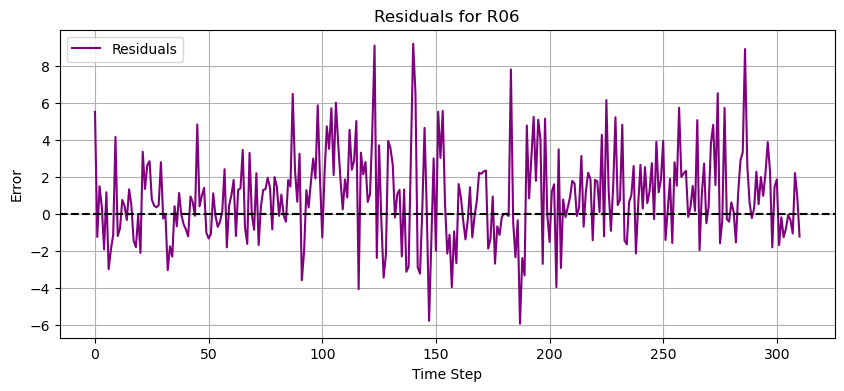

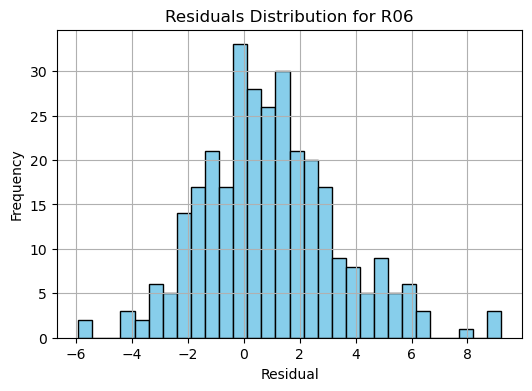

In [36]:
# Load and preprocess data
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

df = df_salesdaily_LSTM.copy()
# Load and preprocess data
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

# View basic statistics
print(df.describe())

# Plot correlation heatmap using explicit whitelist of features
included_columns = [
    'M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06',
    'Year', 'Month', 'year', 'month', 'day',
    'weekday_0', 'weekday_1', 'weekday_2', 'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6',
    'Season_Fall', 'Season_Spring', 'Season_Summer', 'Season_Winter', 'Quarter'
]
corr = df[included_columns].corr()
plt.figure(figsize=(14, 10))
sns.heatmap(corr, annot=False, cmap='coolwarm', fmt='.2f', center=0)
plt.title("Feature Correlation Matrix (Excluding Rolling Features)")
plt.show()

# Define parameters
SEQ_LENGTH = 30
BATCH_SIZE = 64
LEARNING_RATE = 0.001
HIDDEN_SIZE = 64
PATIENCE = None  # Removed early stopping

# Explicit list of drug columns
drug_columns = list(optimal_epochs.keys())

# Input features include all engineered features (seasonality, day of week, etc.)
# Forecast only for drugs, so we exclude drugs from input features
input_features = [col for col in df.columns if col not in drug_columns and col != 'date']

# Define Dataset class
class TimeSeriesDataset(Dataset):
    def __init__(self, sequences, targets):
        self.sequences = sequences
        self.targets = targets

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.targets[idx]

# Define LSTM model
class LSTMModel(nn.Module):
    def __init__(self, input_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=HIDDEN_SIZE, batch_first=True)
        self.fc = nn.Linear(HIDDEN_SIZE, 1)

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        output = self.fc(lstm_out[:, -1, :])
        return output

# Training loop
def train_model(model, train_loader, val_loader, drug, epochs):
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
    loss_fn = nn.MSELoss()
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        train_loss = 0
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            output = model(batch_x)
            loss = loss_fn(output, batch_y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_losses.append(train_loss / len(train_loader))

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for batch_x, batch_y in val_loader:
                output = model(batch_x)
                loss = loss_fn(output, batch_y)
                val_loss += loss.item()
        val_losses.append(val_loss / len(val_loader))

        print(f"Epoch {epoch+1}, {drug} Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}")

    # Plot training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training loss', color='blue')
    plt.plot(val_losses, label='Validation loss', color='red')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    return model

# Loop over drugs
for drug in drug_columns:
    data = df[input_features + [drug]].dropna()
    target = data[[drug]]
    features = data[input_features]

    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    data_scaled = scaler_X.fit_transform(features)
    target_scaled = scaler_y.fit_transform(target)

    sequences, targets = [], []
    for i in range(len(data_scaled) - SEQ_LENGTH):
        sequences.append(data_scaled[i:i+SEQ_LENGTH])
        targets.append(target_scaled[i+SEQ_LENGTH])

    sequences = torch.tensor(sequences, dtype=torch.float32)
    targets = torch.tensor(targets, dtype=torch.float32)

    # 70% train, 15% validation, 15% test
    total_len = len(sequences)
    train_end = int(0.7 * total_len)
    val_end = int(0.85 * total_len)

    X_train, y_train = sequences[:train_end], targets[:train_end]
    X_val, y_val = sequences[train_end:val_end], targets[train_end:val_end]
    X_test, y_test = sequences[val_end:], targets[val_end:]

    train_loader = DataLoader(TimeSeriesDataset(X_train, y_train), batch_size=BATCH_SIZE, shuffle=False)
    val_loader = DataLoader(TimeSeriesDataset(X_val, y_val), batch_size=BATCH_SIZE, shuffle=False)

    model = LSTMModel(input_size=data_scaled.shape[1])
    trained_model = train_model(model, train_loader, val_loader, drug, optimal_epochs[drug])

    # Predict
    model.eval()
    with torch.no_grad():
        predictions = model(X_test).numpy()
    actual = scaler_y.inverse_transform(y_test.numpy())
    predicted = scaler_y.inverse_transform(predictions)

    # Evaluate performance
    rmse = mean_squared_error(actual, predicted, squared=False)
    r2 = r2_score(actual, predicted)
    mae = np.mean(np.abs(actual - predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100

    print(f"{drug} RMSE: {rmse:.4f}")
    print(f"{drug} R² Score: {r2:.4f}")
    print(f"{drug} MAE: {mae:.4f}")
    print(f"{drug} MAPE: {mape:.2f}%")

    # Plot
    plt.figure(figsize=(12, 5))
    plt.plot(actual, label='Actual', color='blue')
    plt.plot(predicted, label='Predicted', color='orange')
    plt.title(f"LSTM Forecast vs Actual: {drug}")
    plt.xlabel("Time Step")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot residuals
    residuals = actual - predicted
    plt.figure(figsize=(10, 4))
    plt.plot(residuals, label='Residuals', color='purple')
    plt.axhline(0, color='black', linestyle='--')
    plt.title(f"Residuals for {drug}")
    plt.xlabel("Time Step")
    plt.ylabel("Error")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot residuals histogram
    plt.figure(figsize=(6, 4))
    plt.hist(residuals, bins=30, color='skyblue', edgecolor='black')
    plt.title(f"Residuals Distribution for {drug}")
    plt.xlabel("Residual")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()



In [37]:
# Epochs defined per drug
optimal_epochs = {
    'M01AB': 3,
    'M01AE': 19,
    'N02BA': 125,
    'N02BE': 17,
    'N05B': 33,
    'N05C': 95,
    'R03': 89,
    'R06': 92
}


             M01AB        M01AE        N02BA        N02BE         N05B  \
count  2103.000000  2103.000000  2103.000000  2103.000000  2103.000000   
mean      5.036109     3.897265     3.879177    29.890895     8.850565   
std       2.735765     2.133916     2.384976    15.579887     5.607235   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       3.000000     2.340000     2.000000    19.000000     5.000000   
50%       4.990000     3.670000     3.500000    26.800000     8.000000   
75%       6.670000     5.140000     5.200000    38.300000    12.000000   
max      17.340000    14.463000    16.000000   161.000000    54.833333   

              N05C          R03          R06         Year        Month  ...  \
count  2103.000000  2103.000000  2103.000000  2103.000000  2103.000000  ...   
mean      0.594369     5.506335     2.901007  2016.404660     6.351878  ...   
std       1.093538     6.423979     2.416985     1.663773     3.383343  ...   
min       0.00000

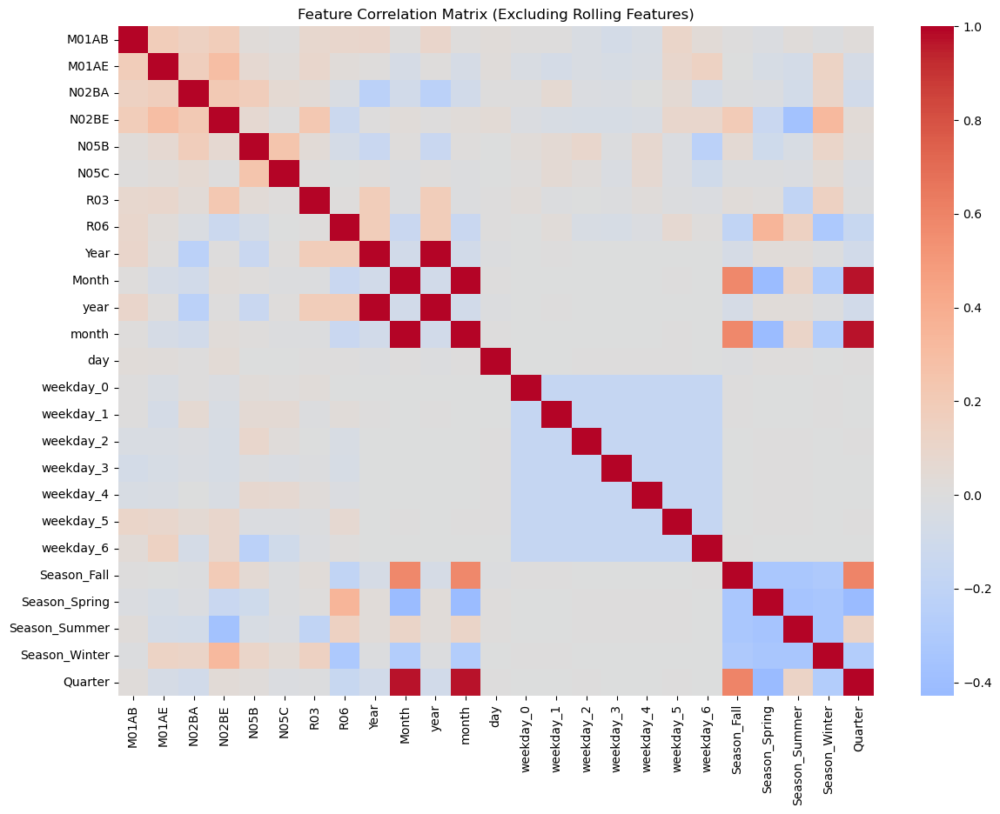

Epoch 1, M01AB Train Loss: 0.4403, Val Loss: 0.0607
Epoch 2, M01AB Train Loss: 0.0296, Val Loss: 0.0240
Epoch 3, M01AB Train Loss: 0.0331, Val Loss: 0.0252
Epoch 4, M01AB Train Loss: 0.0360, Val Loss: 0.0249
Epoch 5, M01AB Train Loss: 0.0361, Val Loss: 0.0241
Epoch 6, M01AB Train Loss: 0.0356, Val Loss: 0.0242
Epoch 7, M01AB Train Loss: 0.0337, Val Loss: 0.0242
Epoch 8, M01AB Train Loss: 0.0333, Val Loss: 0.0242
Epoch 9, M01AB Train Loss: 0.0334, Val Loss: 0.0244
Epoch 10, M01AB Train Loss: 0.0355, Val Loss: 0.0252
Epoch 11, M01AB Train Loss: 0.0365, Val Loss: 0.0270
Epoch 12, M01AB Train Loss: 0.0375, Val Loss: 0.0286
Epoch 13, M01AB Train Loss: 0.0395, Val Loss: 0.0519
Epoch 14, M01AB Train Loss: 0.0447, Val Loss: 0.0439
Epoch 15, M01AB Train Loss: 0.0425, Val Loss: 0.0291
Epoch 16, M01AB Train Loss: 0.0498, Val Loss: 0.0281
Epoch 17, M01AB Train Loss: 0.0396, Val Loss: 0.0268
Epoch 18, M01AB Train Loss: 0.0324, Val Loss: 0.0263
Epoch 19, M01AB Train Loss: 0.0266, Val Loss: 0.0248
Ep

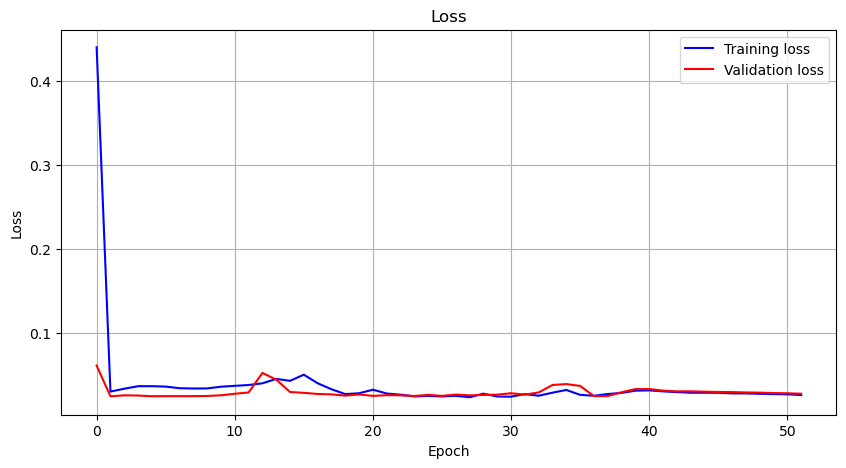

M01AB RMSE: 2.9103
M01AB R² Score: -0.0049
M01AB MAE: 2.2785
M01AB MAPE: inf%


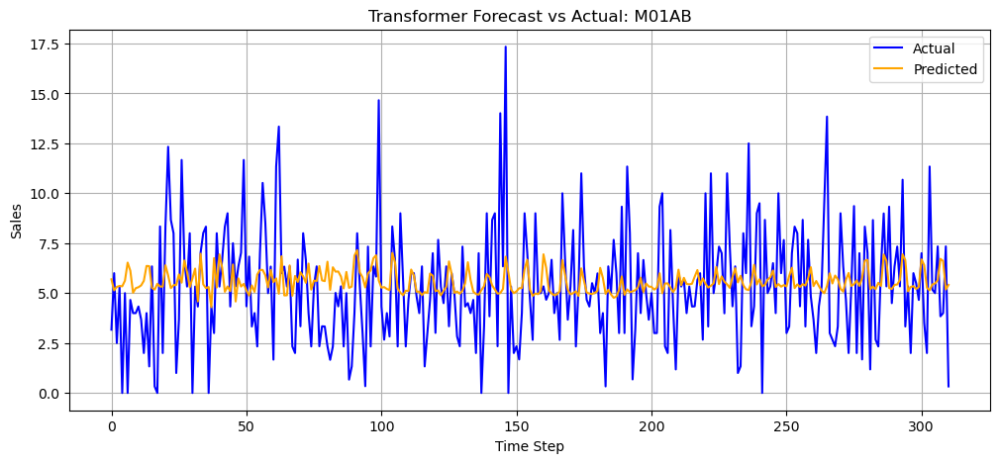

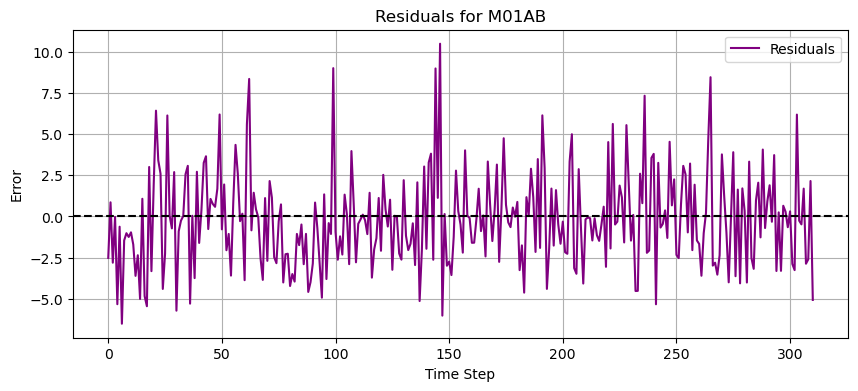

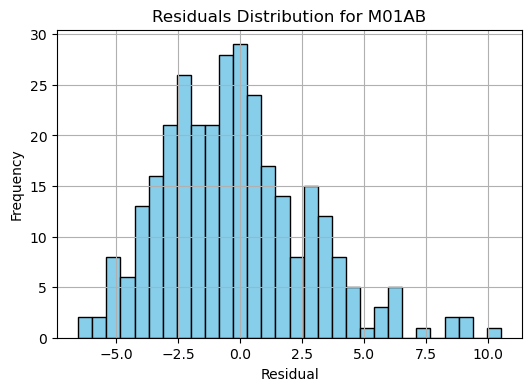

Epoch 1, M01AE Train Loss: 0.5353, Val Loss: 0.0499
Epoch 2, M01AE Train Loss: 0.0434, Val Loss: 0.0303
Epoch 3, M01AE Train Loss: 0.0306, Val Loss: 0.0222
Epoch 4, M01AE Train Loss: 0.0295, Val Loss: 0.0263
Epoch 5, M01AE Train Loss: 0.0297, Val Loss: 0.0242
Epoch 6, M01AE Train Loss: 0.0274, Val Loss: 0.0243
Epoch 7, M01AE Train Loss: 0.0272, Val Loss: 0.0215
Epoch 8, M01AE Train Loss: 0.0266, Val Loss: 0.0235
Epoch 9, M01AE Train Loss: 0.0263, Val Loss: 0.0244
Epoch 10, M01AE Train Loss: 0.0241, Val Loss: 0.0226
Epoch 11, M01AE Train Loss: 0.0248, Val Loss: 0.0222
Epoch 12, M01AE Train Loss: 0.0245, Val Loss: 0.0206
Epoch 13, M01AE Train Loss: 0.0238, Val Loss: 0.0215
Epoch 14, M01AE Train Loss: 0.0234, Val Loss: 0.0210
Epoch 15, M01AE Train Loss: 0.0231, Val Loss: 0.0218
Epoch 16, M01AE Train Loss: 0.0231, Val Loss: 0.0211
Epoch 17, M01AE Train Loss: 0.0225, Val Loss: 0.0207
Epoch 18, M01AE Train Loss: 0.0225, Val Loss: 0.0225
Epoch 19, M01AE Train Loss: 0.0214, Val Loss: 0.0203
Ep

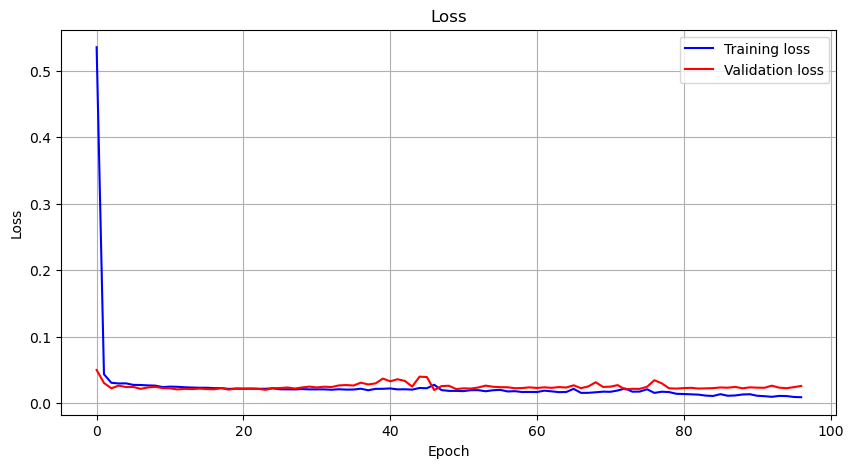

M01AE RMSE: 2.5790
M01AE R² Score: -0.2058
M01AE MAE: 1.9452
M01AE MAPE: inf%


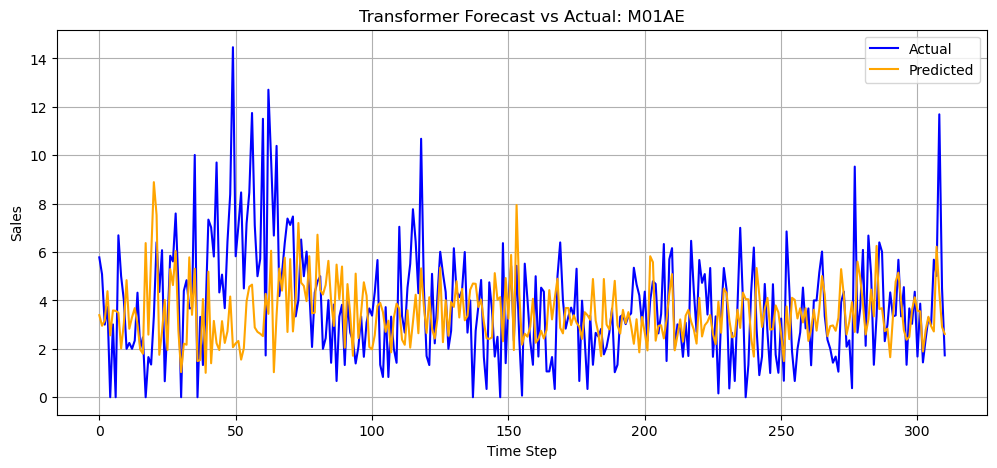

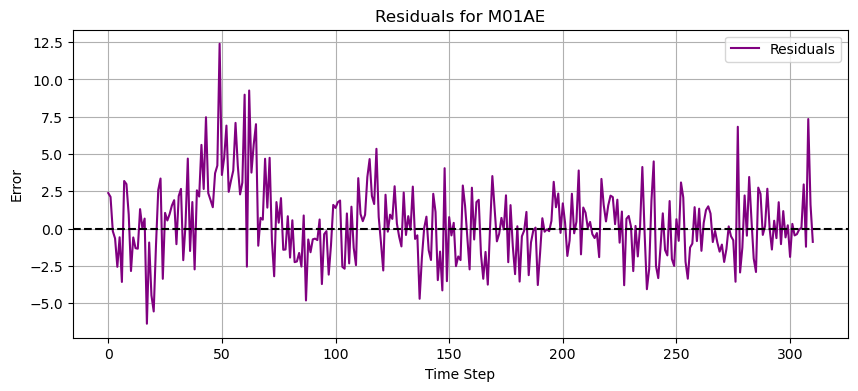

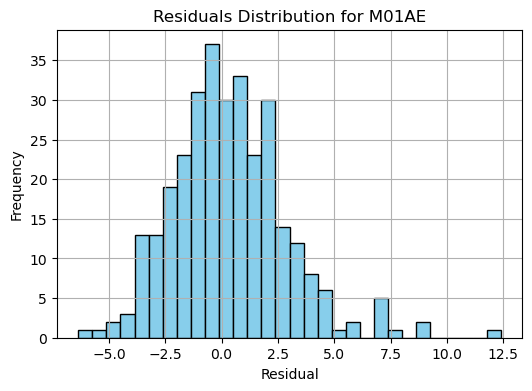

Epoch 1, N02BA Train Loss: 0.5085, Val Loss: 0.0417
Epoch 2, N02BA Train Loss: 0.0347, Val Loss: 0.0177
Epoch 3, N02BA Train Loss: 0.0282, Val Loss: 0.0168
Epoch 4, N02BA Train Loss: 0.0281, Val Loss: 0.0169
Epoch 5, N02BA Train Loss: 0.0268, Val Loss: 0.0171
Epoch 6, N02BA Train Loss: 0.0264, Val Loss: 0.0171
Epoch 7, N02BA Train Loss: 0.0249, Val Loss: 0.0166
Epoch 8, N02BA Train Loss: 0.0243, Val Loss: 0.0168
Epoch 9, N02BA Train Loss: 0.0242, Val Loss: 0.0168
Epoch 10, N02BA Train Loss: 0.0235, Val Loss: 0.0172
Epoch 11, N02BA Train Loss: 0.0234, Val Loss: 0.0180
Epoch 12, N02BA Train Loss: 0.0231, Val Loss: 0.0199
Epoch 13, N02BA Train Loss: 0.0225, Val Loss: 0.0184
Epoch 14, N02BA Train Loss: 0.0229, Val Loss: 0.0198
Epoch 15, N02BA Train Loss: 0.0223, Val Loss: 0.0196
Epoch 16, N02BA Train Loss: 0.0222, Val Loss: 0.0210
Epoch 17, N02BA Train Loss: 0.0221, Val Loss: 0.0193
Epoch 18, N02BA Train Loss: 0.0232, Val Loss: 0.0208
Epoch 19, N02BA Train Loss: 0.0217, Val Loss: 0.0208
Ep

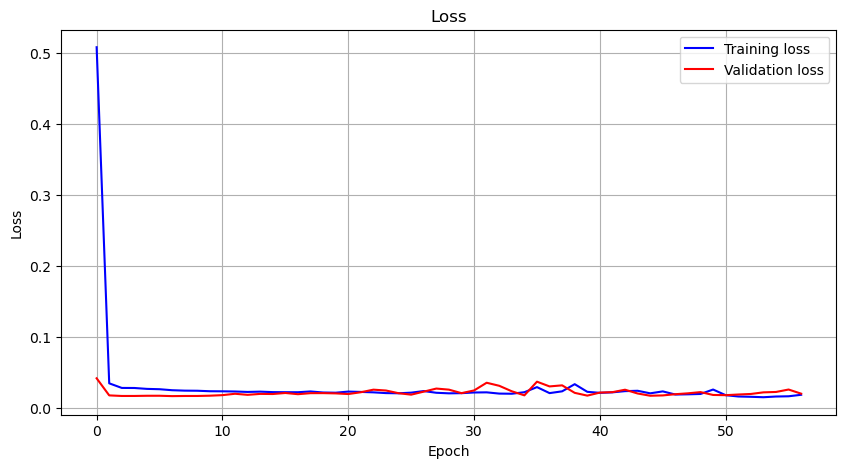

N02BA RMSE: 2.1992
N02BA R² Score: -0.2453
N02BA MAE: 1.6759
N02BA MAPE: inf%


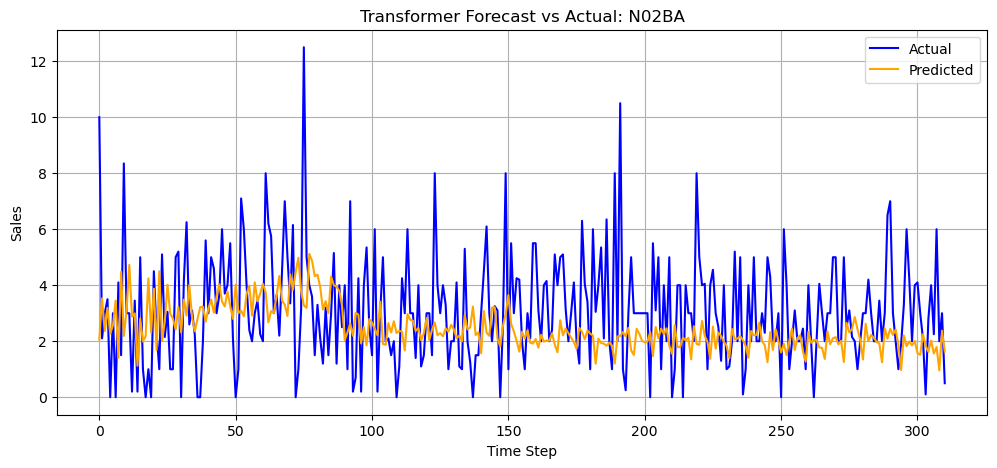

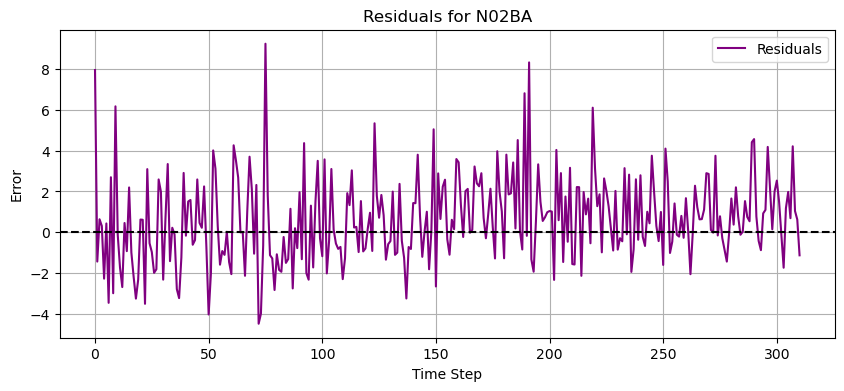

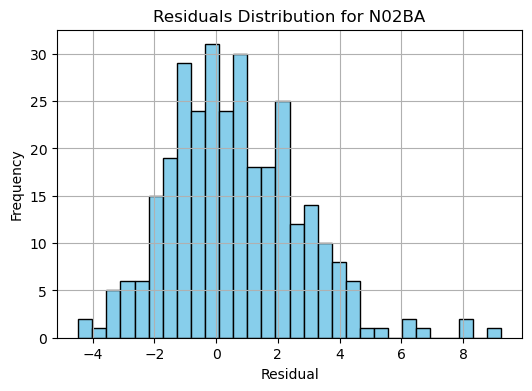

Epoch 1, N02BE Train Loss: 0.7696, Val Loss: 0.0880
Epoch 2, N02BE Train Loss: 0.0238, Val Loss: 0.0120
Epoch 3, N02BE Train Loss: 0.0169, Val Loss: 0.0068
Epoch 4, N02BE Train Loss: 0.0154, Val Loss: 0.0074
Epoch 5, N02BE Train Loss: 0.0157, Val Loss: 0.0090
Epoch 6, N02BE Train Loss: 0.0139, Val Loss: 0.0123
Epoch 7, N02BE Train Loss: 0.0137, Val Loss: 0.0140
Epoch 8, N02BE Train Loss: 0.0128, Val Loss: 0.0150
Epoch 9, N02BE Train Loss: 0.0118, Val Loss: 0.0163
Epoch 10, N02BE Train Loss: 0.0109, Val Loss: 0.0174
Epoch 11, N02BE Train Loss: 0.0108, Val Loss: 0.0206
Epoch 12, N02BE Train Loss: 0.0116, Val Loss: 0.0223
Epoch 13, N02BE Train Loss: 0.0118, Val Loss: 0.0240
Epoch 14, N02BE Train Loss: 0.0104, Val Loss: 0.0227
Epoch 15, N02BE Train Loss: 0.0117, Val Loss: 0.0249
Epoch 16, N02BE Train Loss: 0.0112, Val Loss: 0.0275
Epoch 17, N02BE Train Loss: 0.0111, Val Loss: 0.0304
Epoch 18, N02BE Train Loss: 0.0113, Val Loss: 0.0279
Epoch 19, N02BE Train Loss: 0.0121, Val Loss: 0.0371
Ep

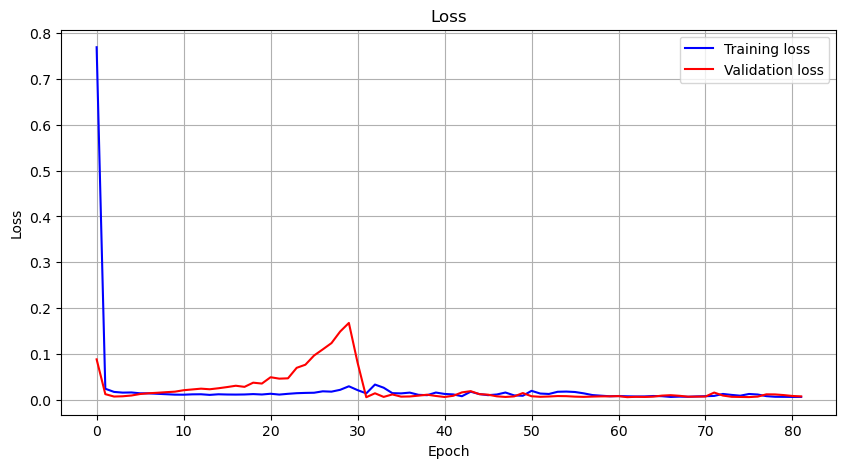

N02BE RMSE: 15.3709
N02BE R² Score: 0.1602
N02BE MAE: 10.7374
N02BE MAPE: inf%


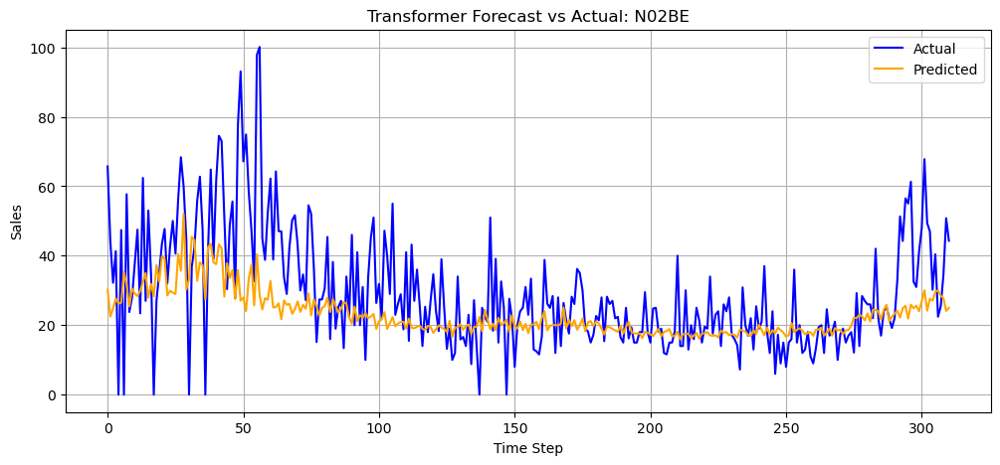

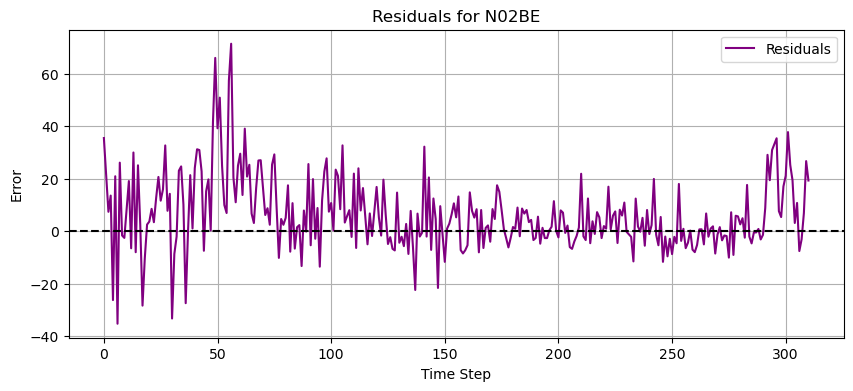

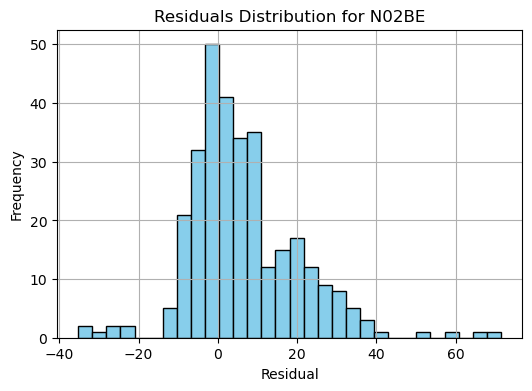

Epoch 1, N05B Train Loss: 0.5512, Val Loss: 0.0371
Epoch 2, N05B Train Loss: 0.0283, Val Loss: 0.0172
Epoch 3, N05B Train Loss: 0.0208, Val Loss: 0.0134
Epoch 4, N05B Train Loss: 0.0185, Val Loss: 0.0112
Epoch 5, N05B Train Loss: 0.0179, Val Loss: 0.0095
Epoch 6, N05B Train Loss: 0.0167, Val Loss: 0.0088
Epoch 7, N05B Train Loss: 0.0168, Val Loss: 0.0080
Epoch 8, N05B Train Loss: 0.0160, Val Loss: 0.0080
Epoch 9, N05B Train Loss: 0.0157, Val Loss: 0.0080
Epoch 10, N05B Train Loss: 0.0151, Val Loss: 0.0078
Epoch 11, N05B Train Loss: 0.0141, Val Loss: 0.0080
Epoch 12, N05B Train Loss: 0.0142, Val Loss: 0.0079
Epoch 13, N05B Train Loss: 0.0142, Val Loss: 0.0078
Epoch 14, N05B Train Loss: 0.0137, Val Loss: 0.0078
Epoch 15, N05B Train Loss: 0.0136, Val Loss: 0.0081
Epoch 16, N05B Train Loss: 0.0137, Val Loss: 0.0078
Epoch 17, N05B Train Loss: 0.0139, Val Loss: 0.0078
Epoch 18, N05B Train Loss: 0.0131, Val Loss: 0.0082
Epoch 19, N05B Train Loss: 0.0128, Val Loss: 0.0083
Epoch 20, N05B Train 

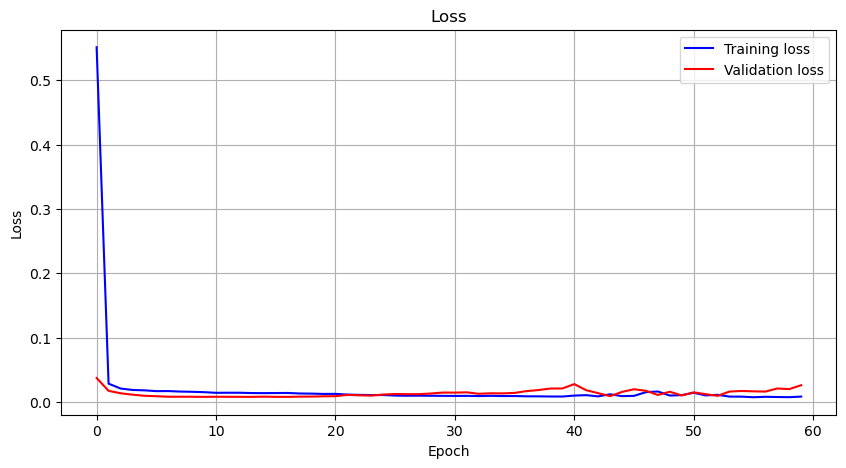

N05B RMSE: 10.9153
N05B R² Score: -5.4293
N05B MAE: 9.7701
N05B MAPE: inf%


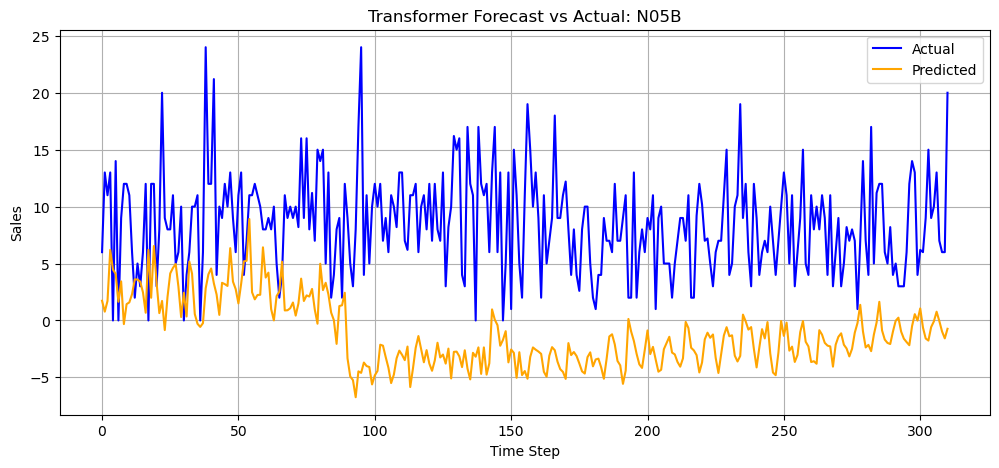

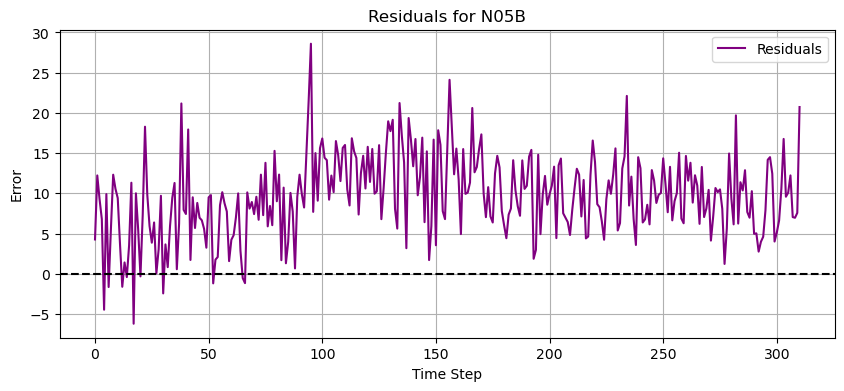

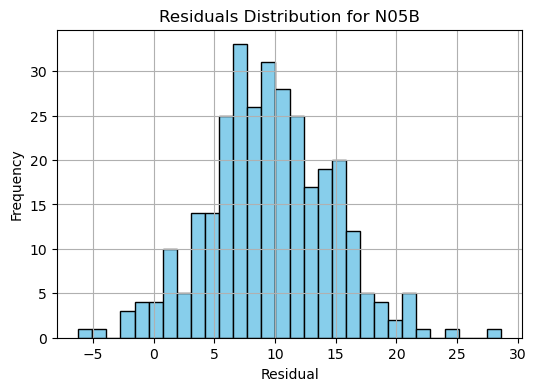

Epoch 1, N05C Train Loss: 0.6533, Val Loss: 0.0909
Epoch 2, N05C Train Loss: 0.0295, Val Loss: 0.0264
Epoch 3, N05C Train Loss: 0.0182, Val Loss: 0.0212
Epoch 4, N05C Train Loss: 0.0181, Val Loss: 0.0211
Epoch 5, N05C Train Loss: 0.0175, Val Loss: 0.0210
Epoch 6, N05C Train Loss: 0.0165, Val Loss: 0.0211
Epoch 7, N05C Train Loss: 0.0153, Val Loss: 0.0212
Epoch 8, N05C Train Loss: 0.0162, Val Loss: 0.0215
Epoch 9, N05C Train Loss: 0.0161, Val Loss: 0.0215
Epoch 10, N05C Train Loss: 0.0155, Val Loss: 0.0217
Epoch 11, N05C Train Loss: 0.0154, Val Loss: 0.0229
Epoch 12, N05C Train Loss: 0.0146, Val Loss: 0.0229
Epoch 13, N05C Train Loss: 0.0144, Val Loss: 0.0228
Epoch 14, N05C Train Loss: 0.0143, Val Loss: 0.0229
Epoch 15, N05C Train Loss: 0.0144, Val Loss: 0.0231
Epoch 16, N05C Train Loss: 0.0140, Val Loss: 0.0229
Epoch 17, N05C Train Loss: 0.0145, Val Loss: 0.0230
Epoch 18, N05C Train Loss: 0.0138, Val Loss: 0.0229
Epoch 19, N05C Train Loss: 0.0138, Val Loss: 0.0233
Epoch 20, N05C Train 

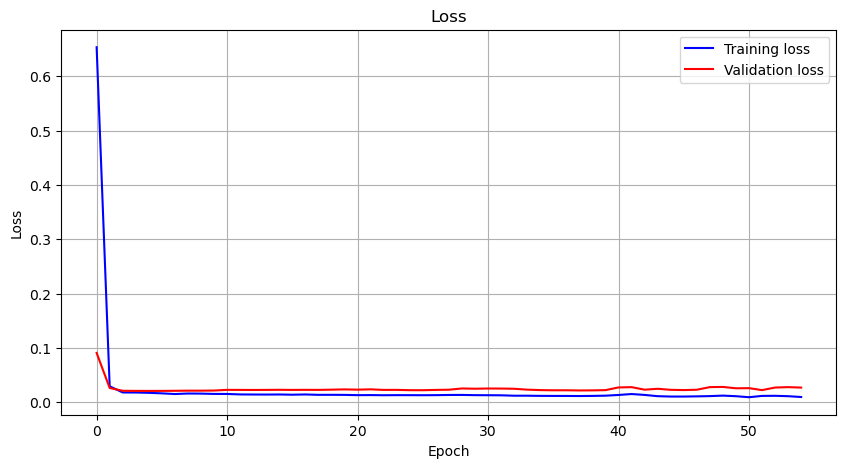

N05C RMSE: 1.6264
N05C R² Score: -1.0650
N05C MAE: 1.1574
N05C MAPE: inf%


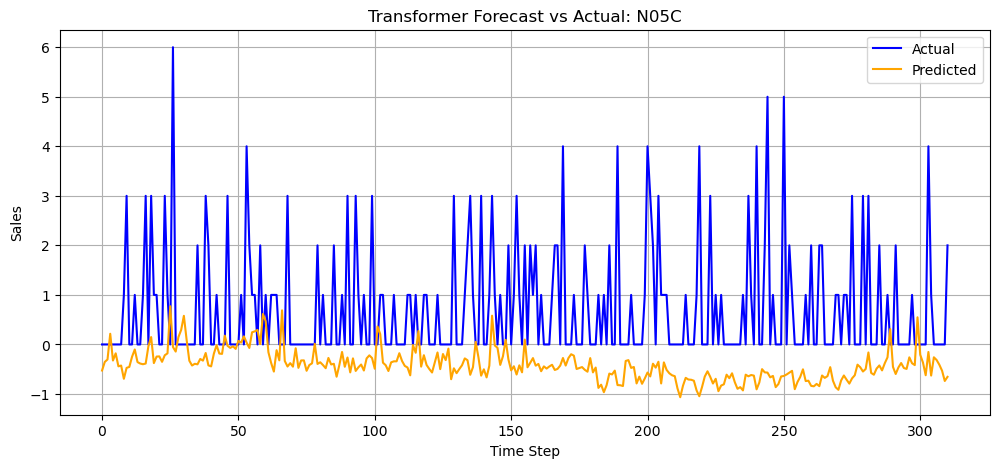

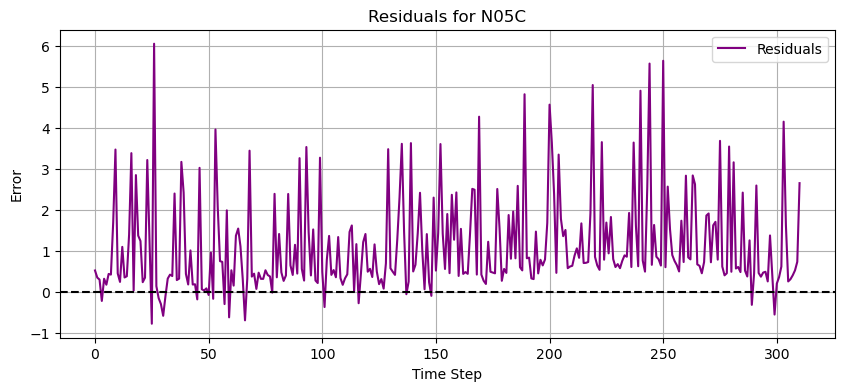

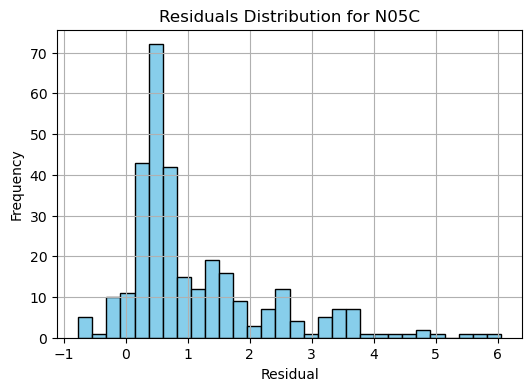

Epoch 1, R03 Train Loss: 0.5592, Val Loss: 0.0376
Epoch 2, R03 Train Loss: 0.0363, Val Loss: 0.0258
Epoch 3, R03 Train Loss: 0.0287, Val Loss: 0.0248
Epoch 4, R03 Train Loss: 0.0248, Val Loss: 0.0252
Epoch 5, R03 Train Loss: 0.0245, Val Loss: 0.0265
Epoch 6, R03 Train Loss: 0.0231, Val Loss: 0.0275
Epoch 7, R03 Train Loss: 0.0221, Val Loss: 0.0264
Epoch 8, R03 Train Loss: 0.0223, Val Loss: 0.0264
Epoch 9, R03 Train Loss: 0.0211, Val Loss: 0.0273
Epoch 10, R03 Train Loss: 0.0207, Val Loss: 0.0280
Epoch 11, R03 Train Loss: 0.0203, Val Loss: 0.0258
Epoch 12, R03 Train Loss: 0.0209, Val Loss: 0.0263
Epoch 13, R03 Train Loss: 0.0201, Val Loss: 0.0264
Epoch 14, R03 Train Loss: 0.0191, Val Loss: 0.0259
Epoch 15, R03 Train Loss: 0.0185, Val Loss: 0.0254
Epoch 16, R03 Train Loss: 0.0182, Val Loss: 0.0256
Epoch 17, R03 Train Loss: 0.0173, Val Loss: 0.0246
Epoch 18, R03 Train Loss: 0.0181, Val Loss: 0.0252
Epoch 19, R03 Train Loss: 0.0175, Val Loss: 0.0241
Epoch 20, R03 Train Loss: 0.0177, Val Lo

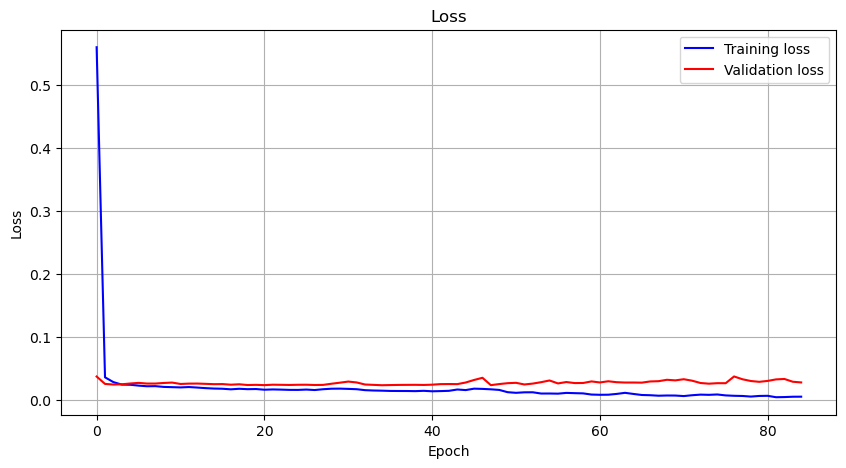

R03 RMSE: 9.1672
R03 R² Score: -0.2667
R03 MAE: 6.1448
R03 MAPE: inf%


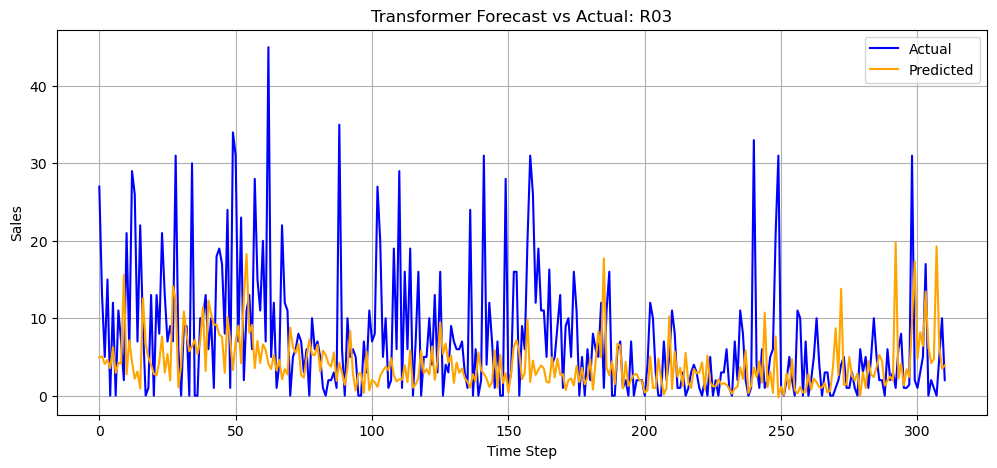

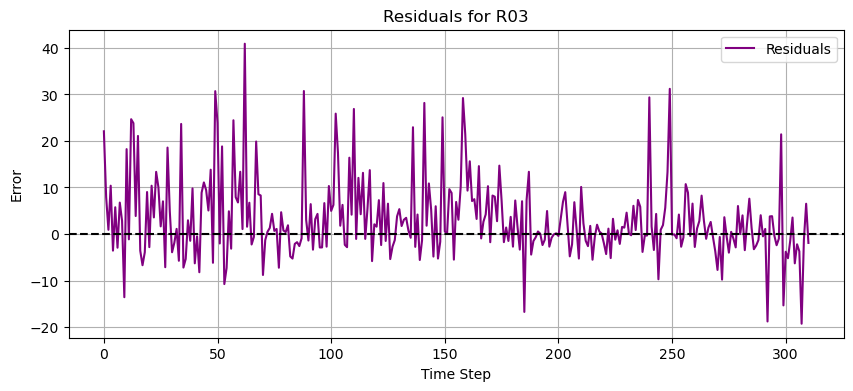

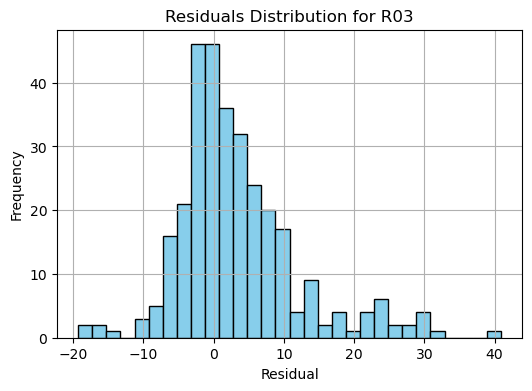

Epoch 1, R06 Train Loss: 0.5166, Val Loss: 0.0359
Epoch 2, R06 Train Loss: 0.0378, Val Loss: 0.0295
Epoch 3, R06 Train Loss: 0.0279, Val Loss: 0.0291
Epoch 4, R06 Train Loss: 0.0248, Val Loss: 0.0324
Epoch 5, R06 Train Loss: 0.0238, Val Loss: 0.0338
Epoch 6, R06 Train Loss: 0.0246, Val Loss: 0.0376
Epoch 7, R06 Train Loss: 0.0227, Val Loss: 0.0353
Epoch 8, R06 Train Loss: 0.0238, Val Loss: 0.0377
Epoch 9, R06 Train Loss: 0.0223, Val Loss: 0.0386
Epoch 10, R06 Train Loss: 0.0225, Val Loss: 0.0395
Epoch 11, R06 Train Loss: 0.0222, Val Loss: 0.0389
Epoch 12, R06 Train Loss: 0.0220, Val Loss: 0.0381
Epoch 13, R06 Train Loss: 0.0228, Val Loss: 0.0402
Epoch 14, R06 Train Loss: 0.0213, Val Loss: 0.0380
Epoch 15, R06 Train Loss: 0.0218, Val Loss: 0.0369
Epoch 16, R06 Train Loss: 0.0210, Val Loss: 0.0363
Epoch 17, R06 Train Loss: 0.0207, Val Loss: 0.0386
Epoch 18, R06 Train Loss: 0.0200, Val Loss: 0.0359
Epoch 19, R06 Train Loss: 0.0205, Val Loss: 0.0399
Epoch 20, R06 Train Loss: 0.0189, Val Lo

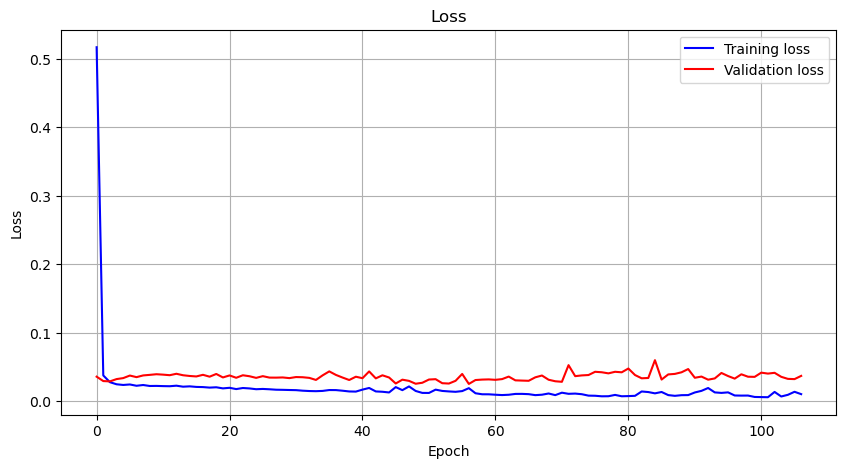

R06 RMSE: 3.1782
R06 R² Score: -0.3960
R06 MAE: 2.3947
R06 MAPE: inf%


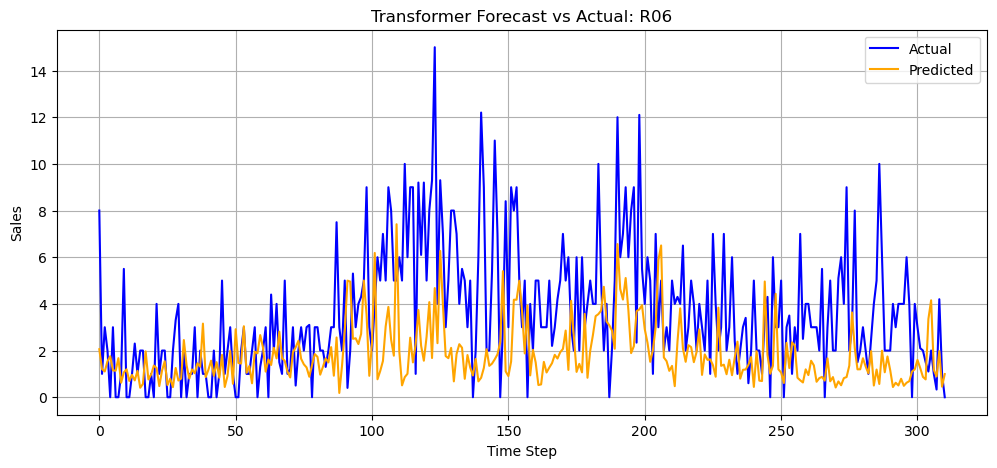

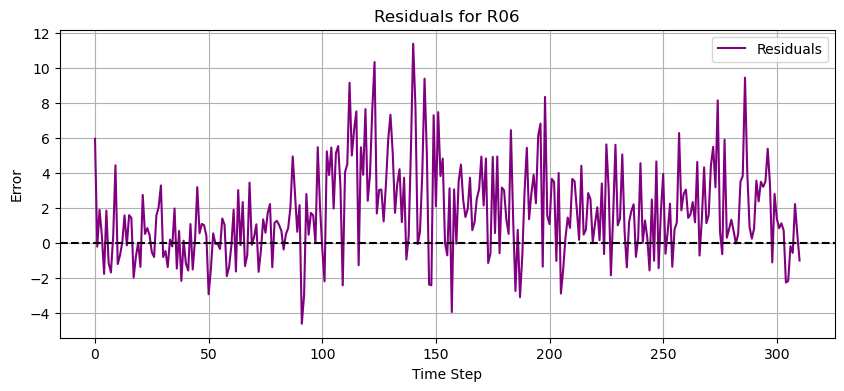

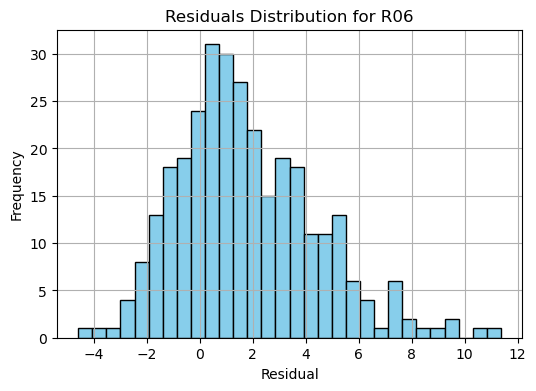

In [38]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load and preprocess data
df = df_salesdaily_LSTM.copy()
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

# View basic statistics
print(df.describe())

# Plot correlation heatmap using explicit whitelist of features
included_columns = [
    'M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06',
    'Year', 'Month', 'year', 'month', 'day',
    'weekday_0', 'weekday_1', 'weekday_2', 'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6',
    'Season_Fall', 'Season_Spring', 'Season_Summer', 'Season_Winter', 'Quarter'
]
corr = df[included_columns].corr()
plt.figure(figsize=(14, 10))
sns.heatmap(corr, annot=False, cmap='coolwarm', fmt='.2f', center=0)
plt.title("Feature Correlation Matrix (Excluding Rolling Features)")
plt.show()

# Define parameters
SEQ_LENGTH = 30
BATCH_SIZE = 64
LEARNING_RATE = 0.001
HIDDEN_SIZE = 64

# Explicit list of drug columns
drug_columns = [
    'M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06'
]

# Input features include all engineered features (seasonality, day of week, etc.)
# Forecast only for drugs, so we exclude drugs from input features
input_features = [col for col in df.columns if col not in drug_columns and col != 'date']

# Define Dataset class
class TimeSeriesDataset(Dataset):
    def __init__(self, sequences, targets):
        self.sequences = sequences
        self.targets = targets

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.targets[idx]

# Define Autoformer-like Transformer model
class TransformerModel(nn.Module):
    def __init__(self, input_size, seq_len):
        super(TransformerModel, self).__init__()
        self.input_projection = nn.Linear(input_size, HIDDEN_SIZE)
        encoder_layer = nn.TransformerEncoderLayer(d_model=HIDDEN_SIZE, nhead=4)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=2)
        self.decoder = nn.Linear(HIDDEN_SIZE, 1)
        self.seq_len = seq_len

    def forward(self, x):
        # x shape: (batch_size, seq_len, input_size)
        x = self.input_projection(x)
        x = x.permute(1, 0, 2)  # transformer expects: (seq_len, batch_size, hidden_size)
        x = self.transformer_encoder(x)
        x = x[-1, :, :]  # use the last time step output
        out = self.decoder(x)
        return out

# Training loop with early stopping
def train_model(model, train_loader, val_loader, drug, max_epochs=1000, patience=50):
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
    loss_fn = nn.MSELoss()
    train_losses, val_losses = [], []
    best_val_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(max_epochs):
        model.train()
        train_loss = 0
        for batch_x, batch_y in train_loader:
            optimizer.zero_grad()
            output = model(batch_x)
            loss = loss_fn(output, batch_y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_losses.append(train_loss / len(train_loader))

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for batch_x, batch_y in val_loader:
                output = model(batch_x)
                loss = loss_fn(output, batch_y)
                val_loss += loss.item()
        val_losses.append(val_loss / len(val_loader))

        print(f"Epoch {epoch+1}, {drug} Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}")

        if val_losses[-1] < best_val_loss:
            best_val_loss = val_losses[-1]
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs.")
            break

    # Plot training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training loss', color='blue')
    plt.plot(val_losses, label='Validation loss', color='red')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    return model


# Loop over drugs
for drug in drug_columns:
    data = df[input_features + [drug]].dropna()
    target = data[[drug]]
    features = data[input_features]

    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    data_scaled = scaler_X.fit_transform(features)
    target_scaled = scaler_y.fit_transform(target)

    sequences, targets = [], []
    for i in range(len(data_scaled) - SEQ_LENGTH):
        sequences.append(data_scaled[i:i+SEQ_LENGTH])
        targets.append(target_scaled[i+SEQ_LENGTH])

    sequences = torch.tensor(sequences, dtype=torch.float32)
    targets = torch.tensor(targets, dtype=torch.float32)

    # 70% train, 15% validation, 15% test
    total_len = len(sequences)
    train_end = int(0.7 * total_len)
    val_end = int(0.85 * total_len)

    X_train, y_train = sequences[:train_end], targets[:train_end]
    X_val, y_val = sequences[train_end:val_end], targets[train_end:val_end]
    X_test, y_test = sequences[val_end:], targets[val_end:]

    train_loader = DataLoader(TimeSeriesDataset(X_train, y_train), batch_size=BATCH_SIZE, shuffle=False)
    val_loader = DataLoader(TimeSeriesDataset(X_val, y_val), batch_size=BATCH_SIZE, shuffle=False)

    model = TransformerModel(input_size=data_scaled.shape[1], seq_len=SEQ_LENGTH)
    trained_model = train_model(model, train_loader, val_loader, drug)

    # Predict
    model.eval()
    with torch.no_grad():
        predictions = model(X_test).numpy()
    actual = scaler_y.inverse_transform(y_test.numpy())
    predicted = scaler_y.inverse_transform(predictions)

    # Evaluate performance
    rmse = mean_squared_error(actual, predicted, squared=False)
    r2 = r2_score(actual, predicted)
    mae = np.mean(np.abs(actual - predicted))
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100

    print(f"{drug} RMSE: {rmse:.4f}")
    print(f"{drug} R² Score: {r2:.4f}")
    print(f"{drug} MAE: {mae:.4f}")
    print(f"{drug} MAPE: {mape:.2f}%")

    # Plot forecast
    plt.figure(figsize=(12, 5))
    plt.plot(actual, label='Actual', color='blue')
    plt.plot(predicted, label='Predicted', color='orange')
    plt.title(f"Transformer Forecast vs Actual: {drug}")
    plt.xlabel("Time Step")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot residuals
    residuals = actual - predicted
    plt.figure(figsize=(10, 4))
    plt.plot(residuals, label='Residuals', color='purple')
    plt.axhline(0, color='black', linestyle='--')
    plt.title(f"Residuals for {drug}")
    plt.xlabel("Time Step")
    plt.ylabel("Error")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot residuals histogram
    plt.figure(figsize=(6, 4))
    plt.hist(residuals, bins=30, color='skyblue', edgecolor='black')
    plt.title(f"Residuals Distribution for {drug}")
    plt.xlabel("Residual")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()


M01AB - RMSE: 2.92, R^2 Score: -0.0155


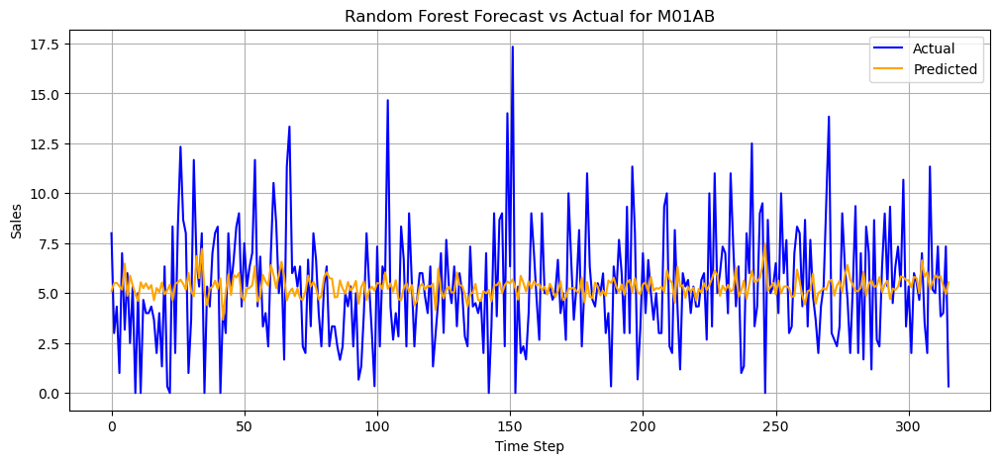

M01AE - RMSE: 2.23, R^2 Score: 0.1006


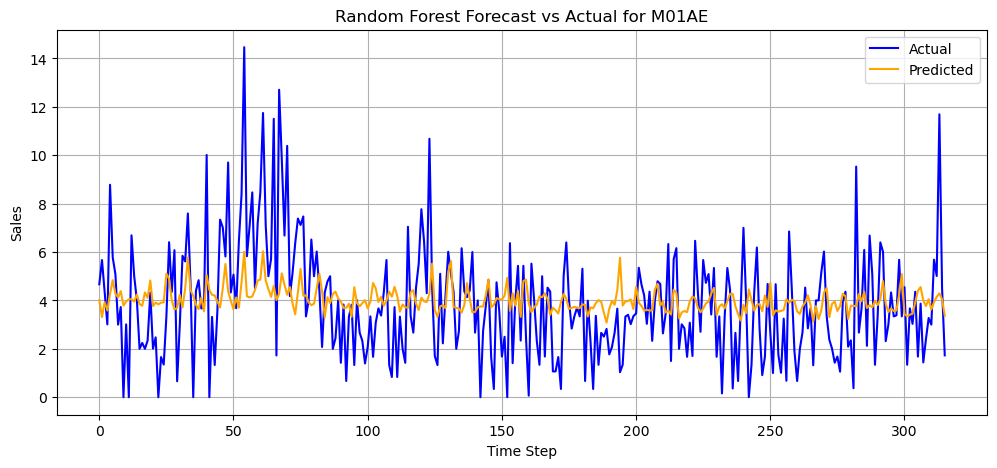

N02BA - RMSE: 2.08, R^2 Score: -0.1208


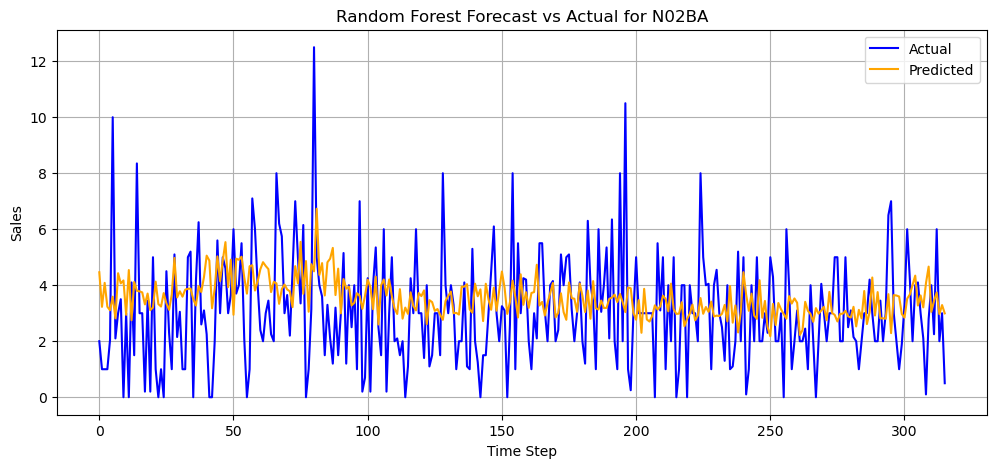

N02BE - RMSE: 13.06, R^2 Score: 0.3868


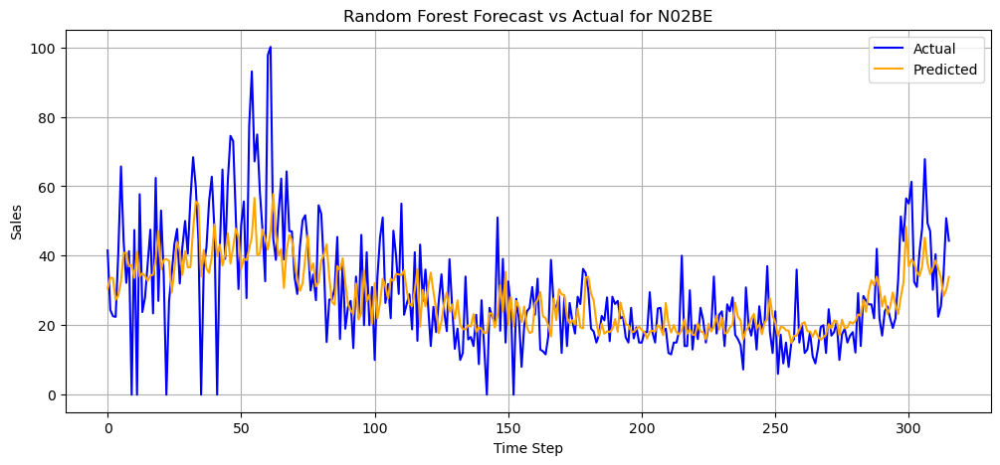

N05B - RMSE: 4.52, R^2 Score: -0.0973


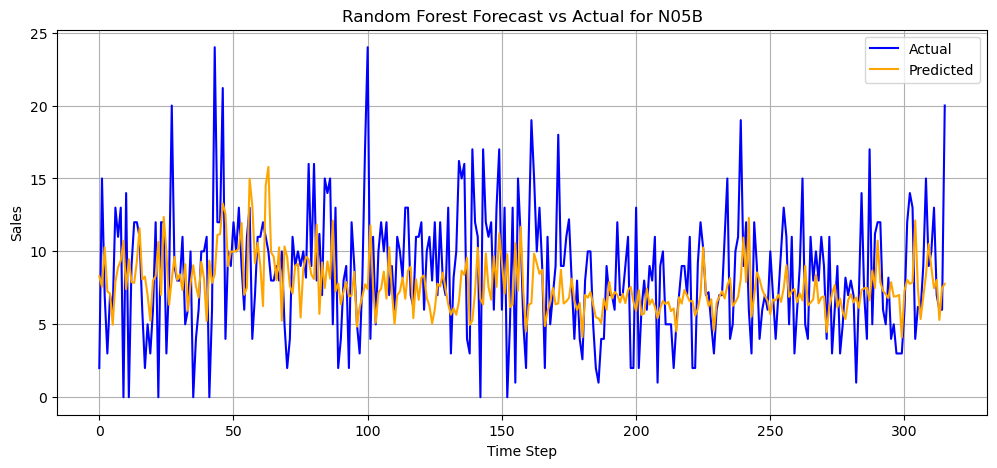

N05C - RMSE: 1.17, R^2 Score: -0.0561


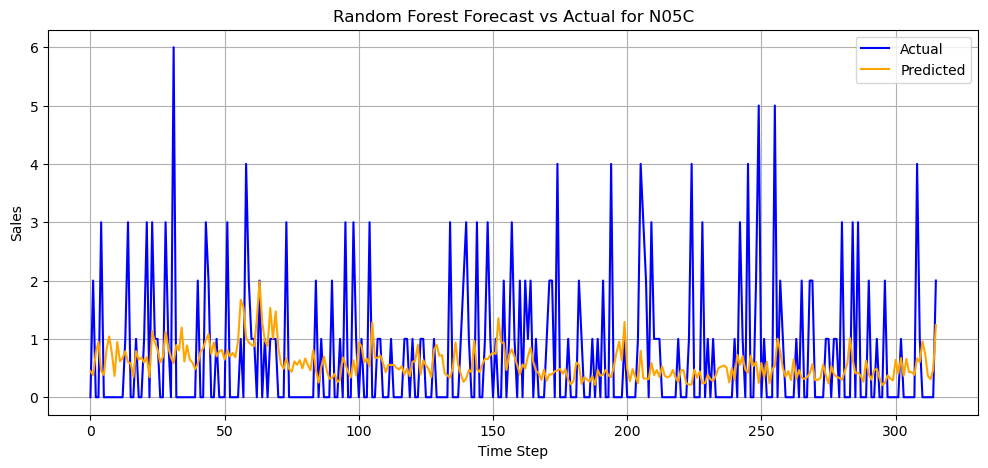

R03 - RMSE: 8.02, R^2 Score: 0.0201


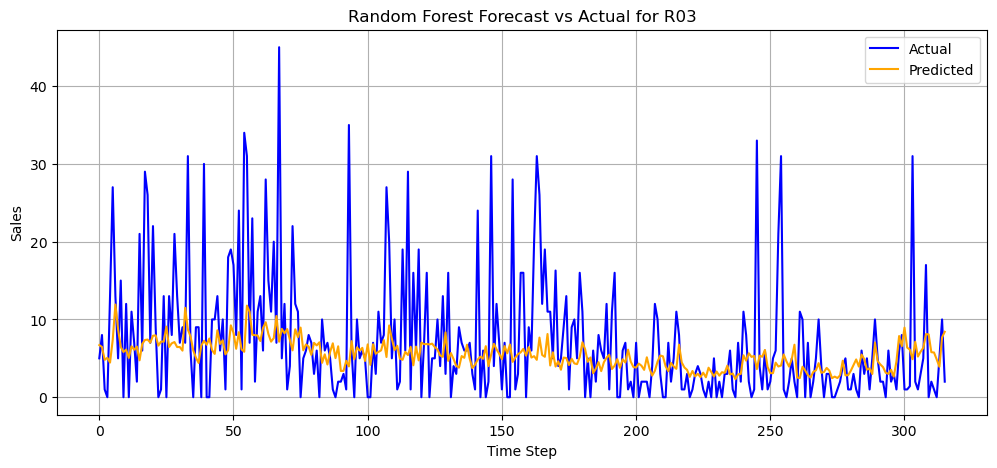

R06 - RMSE: 2.40, R^2 Score: 0.1925


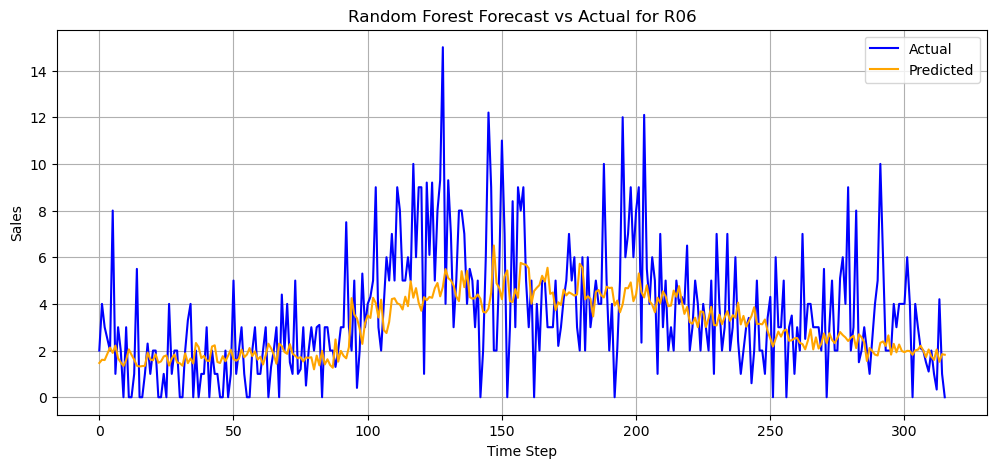

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score

# Load data
df = df_salesdaily_LSTM.copy()
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

# Define target drug columns and feature columns
drug_columns = ['M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06']
input_features = [col for col in df.columns if col not in drug_columns and col != 'date']

# Forecast loop for each drug
for drug in drug_columns:
    data = df[input_features + [drug]].dropna()
    target = data[[drug]]
    features = data[input_features]

    # Scale features and target
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    X_scaled = scaler_X.fit_transform(features)
    y_scaled = scaler_y.fit_transform(target)

    # Train/validation/test split
    X_train, X_temp, y_train, y_temp = train_test_split(X_scaled, y_scaled, test_size=0.3, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

    # Define parameter grid
    param_grid = {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    }

    # Grid search
    rf = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(rf, param_grid, cv=3, scoring='r2', n_jobs=-1)
    grid_search.fit(X_train, y_train.ravel())
    best_model = grid_search.best_estimator_

    # Predict
    y_pred = best_model.predict(X_test)
    y_pred_inv = scaler_y.inverse_transform(y_pred.reshape(-1, 1))
    y_test_inv = scaler_y.inverse_transform(y_test)

    # Evaluation
    rmse = mean_squared_error(y_test_inv, y_pred_inv, squared=False)
    r2 = r2_score(y_test_inv, y_pred_inv)

    print(f"{drug} - RMSE: {rmse:.2f}, R^2 Score: {r2:.4f}")

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(y_test_inv, label='Actual', color='blue')
    plt.plot(y_pred_inv, label='Predicted', color='orange')
    plt.title(f"Random Forest Forecast vs Actual for {drug}")
    plt.xlabel("Time Step")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()


R03 - RMSE: 8.01, R^2 Score: 0.0245, MAE: 5.53


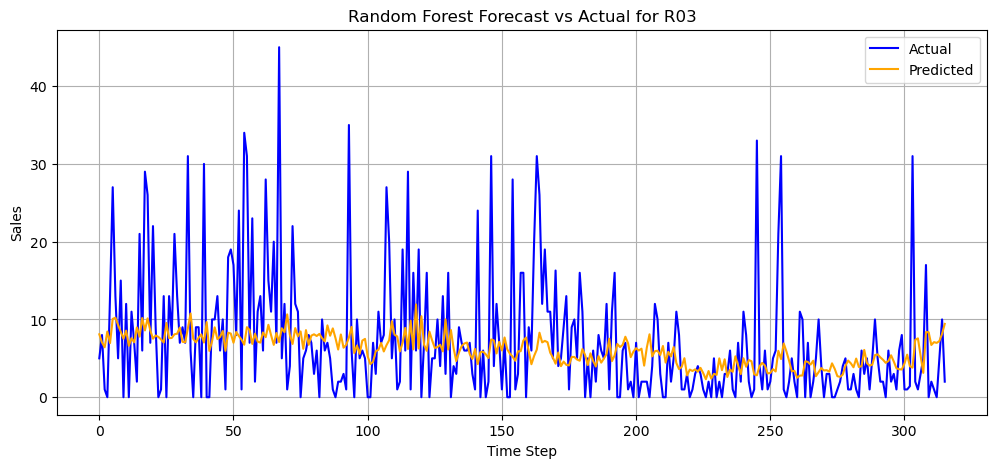

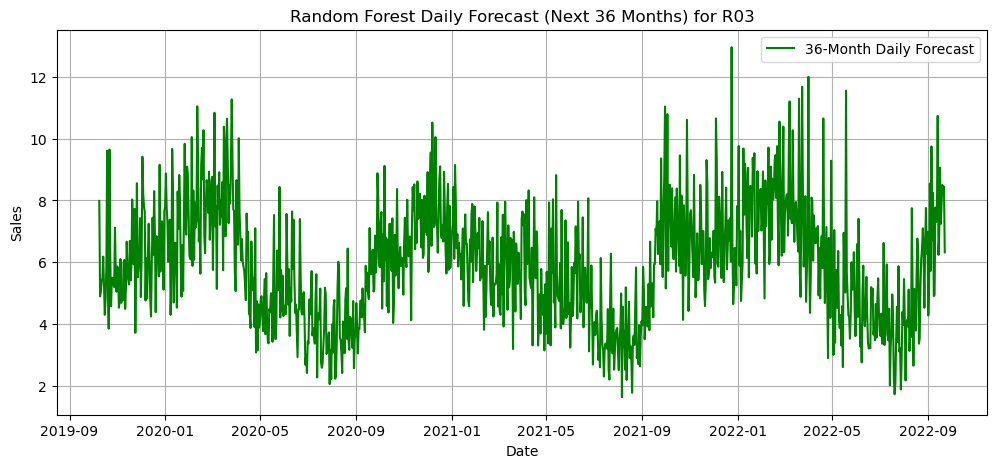

R06 - RMSE: 2.38, R^2 Score: 0.2061, MAE: 1.77


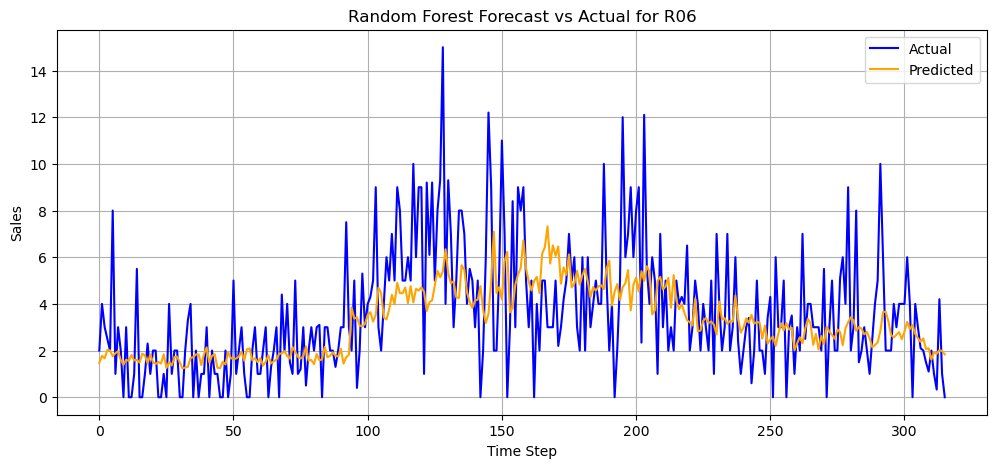

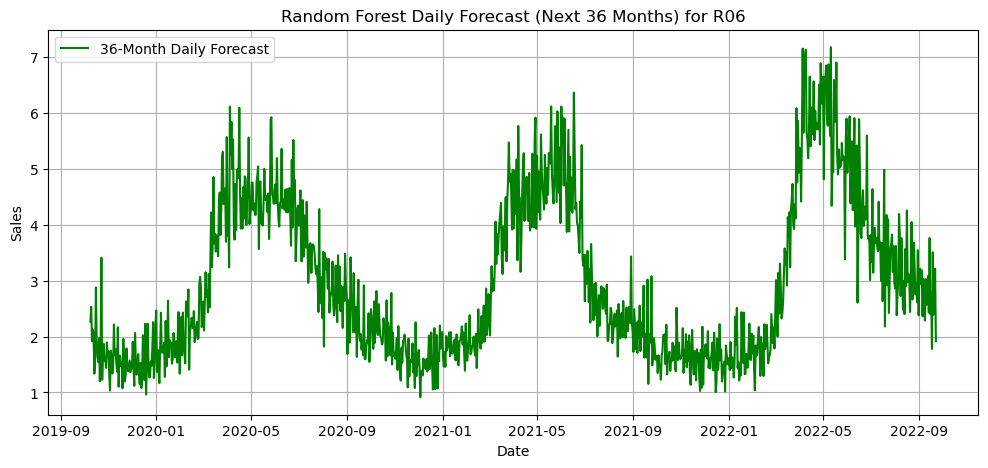

In [110]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Load data
df = df_salesdaily_LSTM.copy()
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

# Add time-based features
df['month'] = df.index.month
df['quarter'] = df.index.quarter
df['year'] = df.index.year
df['month_sin'] = np.sin(2 * np.pi * df.index.month / 12)
df['month_cos'] = np.cos(2 * np.pi * df.index.month / 12)

# Define target drug columns and feature columns
drug_columns = ['R03', 'R06']
input_features = ['R03_t-1', 'R03_t-2', 'R03_t-3', 'R06_t-1', 'R06_t-2', 'R06_t-3', 'month', 'quarter', 'year', 'month_sin', 'month_cos']

# Create future dataframe with next 36 * 30 days (approx 3 years)
dates_future = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods=36 * 30, freq='D')
future_df = pd.DataFrame(index=dates_future)

# Store evaluation metrics
results = []

# Forecast loop for each drug
for drug in drug_columns:
    data = df[input_features + [drug]].dropna()
    target = data[[drug]]
    features = data[input_features]

    # Scale features and target
    scaler_X = MinMaxScaler()
    scaler_y = MinMaxScaler()
    X_scaled = scaler_X.fit_transform(features)
    y_scaled = scaler_y.fit_transform(target)

    # Train/validation/test split
    X_train, X_temp, y_train, y_temp = train_test_split(X_scaled, y_scaled, test_size=0.3, shuffle=False)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

    # Define parameter grid
    param_grid = {
        'n_estimators': [50, 100],
        'max_depth': [10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2]
    }

    # Grid search
    rf = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(rf, param_grid, cv=3, scoring='r2', n_jobs=-1)
    grid_search.fit(X_train, y_train.ravel())

    # Apply Bagging
    rf_best = grid_search.best_estimator_
    bagged_model = BaggingRegressor(estimator=rf_best, n_estimators=10, random_state=42)
    bagged_model.fit(X_train, y_train.ravel())

    # Predict on test set
    y_pred = bagged_model.predict(X_test)
    y_pred_inv = scaler_y.inverse_transform(y_pred.reshape(-1, 1))
    y_test_inv = scaler_y.inverse_transform(y_test)

    # Evaluation
    rmse = mean_squared_error(y_test_inv, y_pred_inv, squared=False)
    r2 = r2_score(y_test_inv, y_pred_inv)
    mae = mean_absolute_error(y_test_inv, y_pred_inv)
    print(f"{drug} - RMSE: {rmse:.2f}, R^2 Score: {r2:.4f}, MAE: {mae:.2f}")

    results.append({"Drug": drug, "RMSE": rmse, "R^2": r2, "MAE": mae})

    # Direct Multi-Step Forecasting
    forecast_scaled = []
    for h in range(1, 36 * 30 + 1):
        # Create shifted target column for direct horizon
        data[f'{drug}_h{h}'] = data[drug].shift(-h)

    horizon_data = data.dropna()
    forecast_horizon = []

    for h in range(1, 36 * 30 + 1):
        y_h = horizon_data[f'{drug}_h{h}']
        X_h = horizon_data[input_features]

        X_train_h, X_test_h, y_train_h, y_test_h = train_test_split(X_h, y_h, test_size=0.3, shuffle=False)

        model_h = BaggingRegressor(estimator=RandomForestRegressor(random_state=42), n_estimators=10, random_state=42)
        model_h.fit(X_train_h, y_train_h)

        # Forecast one-step-ahead using last known feature row
        last_known_input = df[input_features].iloc[-1:]
        forecast_h = model_h.predict(last_known_input)[0]
        forecast_h = max(forecast_h, 0)  # avoid negative predictions
        forecast_h_scaled = scaler_y.transform([[forecast_h]])[0][0]
        forecast_scaled.append(forecast_h_scaled)

    forecast_scaled = np.array(forecast_scaled).reshape(-1, 1)
    forecast_unscaled = scaler_y.inverse_transform(forecast_scaled)
    future_df[drug] = forecast_unscaled.flatten()

    # Plot actual vs predicted
    plt.figure(figsize=(12, 5))
    plt.plot(y_test_inv, label='Actual', color='blue')
    plt.plot(y_pred_inv, label='Predicted', color='orange')
    plt.title(f"Random Forest Forecast vs Actual for {drug}")
    plt.xlabel("Time Step")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot future forecast
    plt.figure(figsize=(12, 5))
    plt.plot(future_df[drug], label='36-Month Daily Forecast', color='green')
    plt.title(f"Random Forest Daily Forecast (Next 36 Months) for {drug}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

# Save to CSV
future_df.to_csv("random_forest_forecast_daily_36_months.csv")
pd.DataFrame(results).to_csv("random_forest_eval_metrics.csv", index=False)


In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Define parameters
SEQ_LENGTH = 30
BATCH_SIZE = 64
LEARNING_RATE = 0.001
HIDDEN_SIZE = 64
FORECAST_HORIZON = 36 * 30  # 1080 days

optimal_epochs = {
    'M01AB': 3,
    'M01AE': 19,
    'N02BA': 125,
    'N02BE': 17,
    'N05B': 33,
    'N05C': 95,
    'R03': 89,
    'R06': 92
}

# Assume df_salesdaily_LSTM is pre-loaded DataFrame
df = df_salesdaily_LSTM.copy()
df['date'] = pd.to_datetime(df['date'])
df.set_index('date', inplace=True)

# Add time-based features
df['month'] = df.index.month
df['quarter'] = df.index.quarter
df['year'] = df.index.year
df['month_sin'] = np.sin(2 * np.pi * df.index.month / 12)
df['month_cos'] = np.cos(2 * np.pi * df.index.month / 12)

# Drugs to forecast
forecast_drugs = ['M01AE', 'N02BE']

# Explicitly define input features
input_features = [
    'M01AE_t-1', 'M01AE_t-2', 'M01AE_t-3',
    'N02BE_t-1', 'N02BE_t-2', 'N02BE_t-3',
    'month', 'quarter', 'year', 'month_cos', 'month_sin'
]

# Dataset class
class TimeSeriesDataset(Dataset):
    def __init__(self, sequences, targets):
        self.sequences = sequences
        self.targets = targets

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx], self.targets[idx]

# LSTM Model
class LSTMModel(nn.Module):
    def __init__(self, input_size):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=HIDDEN_SIZE, batch_first=True)
        self.fc = nn.Linear(HIDDEN_SIZE, 1)

    def forward(self, x):
        lstm_out, _ = self.lstm(x)
        return self.fc(lstm_out[:, -1, :])

# Training function
def train_model(model, train_loader, val_loader, drug, horizon):
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
    loss_fn = nn.MSELoss()
    epochs = optimal_epochs.get(drug, 10)
    for epoch in range(epochs):
        model.train()
        for x, y in train_loader:
            optimizer.zero_grad()
            loss = loss_fn(model(x), y)
            loss.backward()
            optimizer.step()
        model.eval()
        with torch.no_grad():
            val_loss = sum(loss_fn(model(x), y).item() for x, y in val_loader) / len(val_loader)
        print(f"Epoch {epoch+1}, {drug}_h{horizon}, Validation Loss: {val_loss:.4f}")
    return model

# Forecasting correctly
results = []
dates_future = pd.date_range(df.index[-1] + pd.DateOffset(days=1), periods=FORECAST_HORIZON, freq='D')
future_df = pd.DataFrame(index=dates_future)

for drug in forecast_drugs:
    data = df[input_features + [drug]].dropna()
    features = data[input_features]
    scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
    X_scaled = scaler_X.fit_transform(features)

    for h in range(1, FORECAST_HORIZON + 1):
        y_shifted = data[[drug]].shift(-h).dropna()
        min_len = min(len(X_scaled), len(y_shifted))
        X_h = torch.tensor(X_scaled[:min_len - SEQ_LENGTH], dtype=torch.float32)
        y_h = torch.tensor(scaler_y.fit_transform(y_shifted[:min_len - SEQ_LENGTH]), dtype=torch.float32)

        X_seq, y_seq = [], []
        for i in range(len(X_h) - SEQ_LENGTH):
            X_seq.append(X_h[i:i + SEQ_LENGTH])
            y_seq.append(y_h[i + SEQ_LENGTH])

        X_seq = torch.stack(X_seq)
        y_seq = torch.stack(y_seq)

        train_end, val_end = int(0.7 * len(X_seq)), int(0.85 * len(X_seq))
        X_train, y_train = X_seq[:train_end], y_seq[:train_end]
        X_val, y_val = X_seq[train_end:val_end], y_seq[train_end:val_end]

        train_loader = DataLoader(TimeSeriesDataset(X_train, y_train), batch_size=BATCH_SIZE, shuffle=False)
        val_loader = DataLoader(TimeSeriesDataset(X_val, y_val), batch_size=BATCH_SIZE, shuffle=False)

        model = LSTMModel(input_size=X_scaled.shape[1])
        model = train_model(model, train_loader, val_loader, drug, h)

        model.eval()
        with torch.no_grad():
            last_seq = X_seq[-1].unsqueeze(0)
            pred = model(last_seq).item()
            future_df.loc[dates_future[h-1], drug] = scaler_y.inverse_transform([[pred]])[0][0]

    plt.figure(figsize=(12, 5))
    plt.plot(future_df[drug], label='36-Month Daily Forecast', color='green')
    plt.title(f"LSTM Daily Forecast (Next 36 Months) for {drug}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

future_df.to_csv("lstm_forecast_daily_36_months.csv")


KeyboardInterrupt: 